In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd 
import os
from scipy.optimize import curve_fit
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [2]:
# # rename all .txt files (switch B1 to B2 and vice versa)
# import os
# for filename in os.listdir('.'):
#     if filename.endswith('.txt'):
#         new_filename = filename.replace('B1', 'TEMP').replace('B2', 'B1').replace('TEMP', 'B2')
#         os.rename(filename, new_filename)   
# # read all .txt files into a single DataFrame
# # dataframes = []
# # for filename in os.listdir('.'):

In [3]:
#rename all .txt with P1 and P2 for B2 and vice versa in the 
# read all .txt files into a single DataFrame

In [4]:
# # 1. Use a dictionary to store your DataFrames
# dataframes = {}

# # 2. Iterate through files in the current directory
# for filename in os.listdir('.'):
#     if filename.upper().endswith('.TXT'):  # Handles .txt and .TXT
#         # Generate the key name (remove the extension)
#         key = os.path.splitext(filename)[0]
        
#         # 3. Read the file
#         # 'sep=None' with 'engine=python' automatically detects whitespace/tabs
#         df = pd.read_csv(filename, sep=None, engine='python', names=['f', 'noise'])
        
#         # 4. Convert to numeric, turning non-numeric data into NaN (Not a Number)
#         # This ensures 'f' and 'noise' are treated as numbers, not strings
#         df['f'] = pd.to_numeric(df['f'], errors='coerce')
#         df['noise'] = pd.to_numeric(df['noise'], errors='coerce')
        
#         # 5. Store in dictionary
#         dataframes[key] = df

# # Verification
# print(f"Loaded {len(dataframes)} files: {list(dataframes.keys())}")

# 1. Simulation data

In [5]:
B2P1_simu = pd.read_csv('../simu/NoiseP1_MC.csv', sep=None, engine='python')
B2P2_simu = pd.read_csv('../simu/NoiseP2_MC.csv', sep=None, engine='python')

In [6]:
# Change the header of the frequency column (index 0)
B2P1_simu.columns.values[0] = 'f'
B2P2_simu.columns.values[0] = 'f'
#averaging noise values for each frequency
B2P1_simu['avg_noise'] = np.mean(B2P1_simu.iloc[:, 1:].values, axis=1)
B2P2_simu['avg_noise'] = np.mean(B2P2_simu.iloc[:, 1:].values, axis=1)

# Calculate the bounds for B2P1
B2P1_simu['min_noise'] = np.min(B2P1_simu.iloc[:, 1:-1].values, axis=1)
B2P1_simu['max_noise'] = np.max(B2P1_simu.iloc[:, 1:-1].values, axis=1)

# Calculate the bounds for B2P2
B2P2_simu['min_noise'] = np.min(B2P2_simu.iloc[:, 1:-1].values, axis=1)
B2P2_simu['max_noise'] = np.max(B2P2_simu.iloc[:, 1:-1].values, axis=1)


# 2. Measurement data

In [7]:

# to call the directory and load the data into a dictionary of DataFrames
def load_noise_data(data_dir):
    """
    Scans a directory for .txt files, cleans the data, and returns 
    a dictionary where keys are filenames and values are DataFrames.
    """
    temp_dataframes = {}

    # Check if the directory actually exists
    if not os.path.exists(data_dir):
        print(f"Error: The directory '{data_dir}' was not found.")
        return {}

    for filename in os.listdir(data_dir):
        if filename.upper().endswith('.TXT'):
            # Create the full path to the file
            file_path = os.path.join(data_dir, filename)
            
            # Use the filename (without extension) as the dictionary key
            key = os.path.splitext(filename)[0]
            
            try:
                # Read with whitespace regex to handle scientific notation spacing
                df = pd.read_csv(file_path, sep=r'\s+', engine='python', names=['f', 'noise'])
                
                # Convert to numeric and drop NaNs
                df['f'] = pd.to_numeric(df['f'], errors='coerce')
                df['noise'] = pd.to_numeric(df['noise'], errors='coerce')
                df = df.dropna()
                
                temp_dataframes[key] = df
            except Exception as e:
                print(f"Could not read {filename}: {e}")

    print(f"Successfully loaded {len(temp_dataframes)} files from {data_dir}.")
    return temp_dataframes

def sort_plot(df_dict, nametype, Nboard, Npair, frequency, G_x, G_y, style, label=None):
    # Create the key to look up in the dictionary
    name = f'{nametype}{Nboard}P{Npair}{frequency}'
    
    # Get the specific dataframe from the dictionary
    df = df_dict.get(name)
    
    if df is not None:
        # Use df['f'] and df['noise'] just like before
        plt.loglog(df['f'] * G_x, df['noise'] * G_y, 
                   label=label or name, 
                   linestyle=style)
        
        # Standard plot formatting
        plt.xscale('log')
        plt.yscale('log')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Noise (V/√Hz)')
        plt.grid(True, which="both", ls="--")
    else:
        print(f"No data found for {name}. Available keys: {list(df_dict.keys())[:3]}...")


def spec_combine(df_dict, nametype, Nboard, Npair, frequency):
    df_list = []

    for freq in frequency:
        name = f'{nametype}{Nboard}P{Npair}{freq}'
        df_temp = df_dict.get(name)
        
        if df_temp is not None:
            # Ensure we only take the columns we need to avoid errors
            df_list.append(df_temp[['f', 'noise']])

    if not df_list:
        print("No data found.")
        return None

    # 1. Stack all dataframes on top of each other
    combined = pd.concat(df_list, ignore_index=True)

    # 2. Group by frequency 'f'. 
    # If a frequency exists in 3 files, it calculates the mean of those 3.
    # If it exists in only 1 file, the mean is just that single value.
    final_df = combined.groupby('f', as_index=False)['noise'].mean()

    # Sort by frequency to ensure the spectrum is continuous for plotting
    final_df = final_df.sort_values('f')

    return final_df
def spec_combine_wname(df_dict, nametype, Nboard, Npair, frequency):
    df_list = []

    for freq in frequency:
        name = f'{nametype}{Nboard}P{Npair}{freq}'
        print(name)
        df_temp = df_dict.get(name)
        
        if df_temp is not None:
            # Ensure we only take the columns we need to avoid errors
            df_list.append(df_temp[['f', 'noise']])

    if not df_list:
        print("No data found.")
        return None

    # 1. Stack all dataframes on top of each other
    combined = pd.concat(df_list, ignore_index=True)

    # 2. Group by frequency 'f'. 
    # If a frequency exists in 3 files, it calculates the mean of those 3.
    # If it exists in only 1 file, the mean is just that single value.
    final_df = combined.groupby('f', as_index=False)['noise'].mean()

    # Sort by frequency to ensure the spectrum is continuous for plotting
    final_df = final_df.sort_values('f')

    return final_df
def quadr_subtract(df1, df2, mask_params=None):
    """
    Subtracts noise in quadrature. 
    mask_params: Optional dict, e.g., {'threshold': 3, 'bandwidth': 5}
    """
    # Standardize types
    for df in [df1, df2]:
        df['f'] = pd.to_numeric(df['f'], errors='coerce')
        df['noise'] = pd.to_numeric(df['noise'], errors='coerce')

    # 1. Optional Masking BEFORE subtraction
    # This cleans the raw data before the math happens
    if mask_params is not None:
        # We mask df1 (the signal) using your smart_masking function
        f_m, n_m = smart_masking_median(
            df1['f'], df1['noise'], 
            threshold_factor=mask_params.get('threshold', 3),
            bandwidth=mask_params.get('bandwidth', 5)
        )
        df1 = pd.DataFrame({'f': f_m, 'noise': n_m})

    # 2. Merge on frequency
    merged = pd.merge(df1, df2, on='f', suffixes=('_1', '_2'))
    
    # 3. Calculate squared difference
    # We use np.maximum to ensure we don't get negative values before sqrt
    diff_sq = merged['noise_1']**2 - merged['noise_2']**2
    
    # 4. Filter for log-log compatibility
    # Keep only values where signal > floor
    mask = diff_sq > 0
    filtered_df = merged[mask].copy()
    filtered_df['noise'] = np.sqrt(diff_sq[mask])
    
    return filtered_df[['f', 'noise']]





def smart_masking(frequency, noise_data, threshold, target_freqs=[50, 100, 150, 200, 250], bandwidth=2):
    """
    Only masks data if it exceeds the threshold AND is near a target frequency.
    """
    # Create a mask that is True only near our target harmonics (e.g., 50Hz, 100Hz)
    freq_mask = np.zeros(len(frequency), dtype=bool)
    for f in target_freqs:
        freq_mask |= (frequency >= f - bandwidth) & (frequency <= f + bandwidth)
    
    # Only drop if it's in the frequency zone AND above the noise threshold
    to_mask = freq_mask & (noise_data > threshold)
    
    masked_f = frequency[~to_mask]
    masked_noise = noise_data[~to_mask]
    
    print(f"Targeted masking removed {to_mask.sum()} points.")
    return masked_f, masked_noise



def smart_masking_median(frequency, noise_data, threshold_factor=1.5, target_freqs=None, bandwidth=10, window_size=50, force_mask_zone=False):
    if target_freqs is None:
        target_freqs = np.arange(1, 1001, 1)
        # target_freqs = np.arange(50, 1050, 5)
        
    # 1. Create the frequency-based "Zone" mask
    freq_mask = np.zeros(len(frequency), dtype=bool)
    for f in target_freqs:
        freq_mask |= (frequency >= f - bandwidth) & (frequency <= f + bandwidth)
    
    # 2. Local Median (Larger window size helps ignore the peak itself)
    noise_series = pd.Series(noise_data)
    local_median = noise_series.rolling(window=window_size, center=True).median().bfill().ffill()
    
    # 3. Outlier Logic
    is_too_high = noise_data > (local_median * threshold_factor)
    is_too_low  = noise_data < (local_median / threshold_factor)
    
    # 4. Logic Switch
    if force_mask_zone:
        # Just delete EVERYTHING in the target zones (50Hz, 100Hz, etc.)
        to_mask = freq_mask
    else:
        # Only delete if it's in the zone AND an outlier
        to_mask = freq_mask & (is_too_high | is_too_low)
    
    masked_f = frequency[~to_mask]
    masked_noise = noise_data[~to_mask]
    
    print(f"Masking removed {to_mask.sum()} points using factor {threshold_factor}.")
    return masked_f, masked_noise

# def fit_noise_spectrum(f, noise_density):
#     """
#     Fits noise data to the model: noise = sqrt(A/f + B)
    
#     Parameters:
#     f: array-like, frequency values
#     noise_density: array-like, noise voltage density (V/rtHz or nV/rtHz)
    
#     Returns:
#     popt: Optimized [A, B]
#     fitted_noise: The noise values calculated from the fit
#     """
#     # Define the model function
#     # We use absolute values or bounds to ensure A and B stay positive
#     def noise_model(f, A, B):
#         return np.sqrt(np.abs(A)**2/f + np.abs(B)**2)  # B is squared to ensure it's positive

#     # Initial guesses: 
#     # B_guess = the value at the highest frequency (noise floor)
#     # A_guess = (noise_at_lowest_f^2 - B_guess) * lowest_f
#     A_guess = np.mean(noise_density[0:10]**2)  # Average of the first points for a stable estimate
#     B_guess = np.mean(noise_density[-100:-1]**2) # Average the last 100 points for a stable estimate of the noise floor
#     print(f"Initial Guess: A = {A_guess:.2e}, B = {B_guess:.2e}")
#     # B_guess = 1 
#     # Perform the fit
#     popt, pcov = curve_fit(noise_model, f, noise_density, p0=[A_guess, B_guess])
    
#     fitted_noise = noise_model(f, *popt)
    
#     return popt, fitted_noise





In [8]:
#improve the mask and fix test


def rolling_mask(f, noise, window=20, sigma=5):
    series = pd.Series(noise)
    median = series.rolling(window, center=True).median().fillna(method='bfill').fillna(method='ffill')
    std = series.rolling(window, center=True).std().fillna(method='bfill').fillna(method='ffill')
    
    # Mask if point is > 'sigma' standard deviations from the rolling median
    to_mask = noise > (median + sigma * std)
    return f[~to_mask], noise[~to_mask]



def fit_noise_spectrum(frequency, noise_density, min_freq=1.0, iterations=3, f_power_config=None):
    f = np.array(frequency)
    n = np.array(noise_density)
    
    mask = np.isfinite(f) & np.isfinite(n) & (f >= min_freq)
    f_clean, n_clean = f[mask], n[mask]

    if len(f_clean) < 10:
        return [0, 0], np.zeros_like(f)

    # 1. HANDLE MODEL DYNAMICS
    if f_power_config is not None:
        # Use the provided value, or default to 1.0 if we are fitting it
        fixed_power = f_power_config.get('value', 1.0) 
        should_fit_power = not f_power_config.get('fix', True)
    else:
        fixed_power = 1.0 
        should_fit_power = False

    if should_fit_power:
        def noise_model(freq, A, B, p):
            return np.sqrt(np.abs(A)/(freq**p) + np.abs(B))
        # Initial Guess: [A, B, p] -> Start with p=fixed_power (1.0)
        p0 = [1e-18, np.nanmedian(n_clean[-10:])**2, fixed_power] 
        bounds = (0, [np.inf, np.inf, 4.0])
    else:
        def noise_model(freq, A, B):
            return np.sqrt(np.abs(A)/(freq**fixed_power) + np.abs(B))
        p0 = [1e-18, np.nanmedian(n_clean[-10:])**2]
        bounds = (0, np.inf)

    # 2. ROBUST INITIAL GUESSES (Gradient-Based)
    # Calculate the local slope in log-log space
    log_f = np.log10(f_clean)
    log_n = np.log10(n_clean)
    slopes = np.gradient(log_n, log_f)
    
    # Find where the slope is flattest (closest to 0)
    # This identifies the "corner" even if it's right at the end
    flattest_idx = np.argmin(np.abs(slopes))
    
    # Guess B: If the flattest slope is still steep (e.g., < -0.2), 
    # the white noise is likely below our current measurement floor.
    if slopes[-1] < -0.2:
        # Assume the floor is just below our last point
        B_guess = (n_clean[-1] / 2)**2 
    else:
        B_guess = n_clean[flattest_idx]**2

    # Guess A: Derived from the first point, now that we have a better B
    A_guess = max((n_clean[0]**2 - B_guess) * (f_clean[0]**fixed_power), 1e-35)
    
    p0 = [A_guess, B_guess, fixed_power] if should_fit_power else [A_guess, B_guess]
    # 3. ITERATIVE REFINEMENT
    curr_f, curr_n = f_clean, n_clean
    popt = p0

    for i in range(iterations):
        try:
            popt, _ = curve_fit(
                noise_model, curr_f, curr_n, 
                p0=popt, 
                bounds=bounds,
                sigma=curr_n,
                maxfev=5000
            )
            
            fitted_vals = noise_model(curr_f, *popt)
            residuals = curr_n - fitted_vals
            # Using absolute residuals for better spike rejection in log space
            keep_mask = np.abs(residuals) < (3 * np.std(residuals))
            curr_f, curr_n = curr_f[keep_mask], curr_n[keep_mask]
            
        except Exception as e:
            print(f"Iteration {i} failed: {e}")
            break

    # Evaluation on original frequency array
    full_fit = noise_model(f, *popt)
    return popt, full_fit

def mask_and_fit_model2(frequency, noise_density, min_freq=1.0, iterations=3):
    # 1. CONVERT TO NUMPY AND CLEAN
    # This solves the KeyError: 0 by ensuring we use 0-based integer indexing
    f = np.array(frequency)
    n = np.array(noise_density)
    
    # Remove NaNs, Infs, and crop below min_freq
    mask = np.isfinite(f) & np.isfinite(n) & (f >= min_freq)
    f_clean = f[mask]
    n_clean = n[mask]

    if len(f_clean) < 10:
        print("Warning: Not enough data points above min_freq.")
        return [0, 0], np.zeros_like(f)

    def noise_model(freq, A, B, C):
        # Using abs(A) and abs(B) inside or bounds outside prevents sqrt of negative
        return np.sqrt(np.abs(A)/(freq**C) + np.abs(B))

    # 2. ROBUST INITIAL GUESSES (Using NumPy indexing)
    # B: White noise floor (mean of the last 100 points)
    B_guess = np.nanmedian(n_clean[-100:])**2
    
    # A: Flicker noise (derived from the first point above min_freq)
    # A = (Noise^2 - B) * f
    A_guess = max((n_clean[0]**2 - B_guess) * f_clean[0], 1e-28)

    C_guess = 1

    print(f"Fitting from {min_freq}Hz. Initial Guess: A={A_guess:.2e}, B={B_guess:.2e}, C = {C_guess:.2e}")

    # 3. ITERATIVE REFINEMENT
    curr_f, curr_n = f_clean, n_clean
    popt = [A_guess, B_guess, C_guess]

    for i in range(iterations):
        try:
            # sigma=curr_n is vital for log-scale data accuracy
            popt, _ = curve_fit(
                noise_model, curr_f, curr_n, 
                p0=popt, 
                bounds=(0, np.inf),
                sigma=curr_n
            )
            
            # Mask outliers (spikes) for the next pass
            fitted_vals = noise_model(curr_f, *popt)
            residuals = curr_n - fitted_vals
            std_dev = np.std(residuals)
            
            # Keep only points that aren't extreme outliers
            keep_mask = residuals < (3 * std_dev)
            curr_f, curr_n = curr_f[keep_mask], curr_n[keep_mask]
            
        except Exception as e:
            print(f"Iteration {i} failed: {e}")
            break

    # Return fit evaluated on the ORIGINAL frequency array (even below 1Hz)
    # so you can plot the whole thing
    full_fit = noise_model(f, *popt)
    
    return popt, full_fit
def noise_model(frequency, A, B):
        return np.sqrt(A/frequency + B)  # B is squared to ensure it's positive
# try to use median method 
def median_fit(frequency, noise, f_w, f_f):
    f = frequency
    n = noise
    
    # --- METHOD 1: YOUR ROBUST MEDIAN ---
    # nw from high frequency (>300Hz)
    nw_r = np.median(n[f > f_w])
    # fc from low frequency (<100Hz)
    mask = (f < f_f) & (n > nw_r)
    fc_points = f[mask] * ((n[mask]**2 / nw_r**2) - 1)
    fc_r = np.median(fc_points)
    A = fc_r * nw_r**2
    B = nw_r**2
    n_fit = np.sqrt(A/f + B)
    return [A, B], n_fit

# save data file 
def save_df_to_txt(df, filename):
    """
    Saves a DataFrame to a .txt file with headers.
    Uses Tab-separation (\t) for best compatibility with Excel/Notepad.
    """
    try:
        df.to_csv(filename, 
                  sep='\t',      # Tab-separated is cleanest for .txt
                  index=False,   # Removes the 0, 1, 2... row numbers
                  header=True)   # Ensures 'f' and 'noise' are at the top
        print(f"Successfully saved to {filename}")
    except Exception as e:
        print(f"Error saving file: {e}")

In [9]:
# resistor selection: since we did the ideal simulation in Cadence, the load resistor only produce thermal noise, but practically it also produce flicker noise, so we need to consider the noise contribution of the load resistor when selecting it. 
#we can have a catalog of resistors's noise at 100 Ohm and 1W dissipation, then can can use this to improve our noise model by adding the resistor's noise contribution to the total noise. 

resistor_name = ['Welwyn_1percent', 'Microtech_1percent', 'Microtech_0.1percent','Yageo_1percent', 'Mira_1percent']
res_flicker_noise = [6e-9, 1.5e-8, 3.5e-8, 2.6e-7, 2.7e-7] 
# we need to convert in to flicker noise at  2.2kOhm and 1.1V 
res_flicker_noise_true = [noise * (2.2e3/100) * (1.1/10) for noise in res_flicker_noise] 
print(res_flicker_noise_true)


[1.452e-08, 3.63e-08, 8.470000000000001e-08, 6.292000000000002e-07, 6.534000000000001e-07]


In [10]:
def sim_correction(sim_df, res_noise_at_1Hz, Amp_gain, type):
    """
    Correctly adds resistor flicker noise to simulation in quadrature.
    """
    # 1. Calculate the resistor voltage noise density at each frequency
    # Noise(f) = Noise_at_1Hz / sqrt(f)
    res_noise_f = (res_noise_at_1Hz / np.sqrt(sim_df['f'])) / Amp_gain
    
    # 2. Add in quadrature. Use 2* if there are two load resistors.
    # We square the density to add in the power domain (V^2/Hz), then sqrt back.
    corrected_noise = np.sqrt(sim_df[type + '_noise']**2 + 2 * (res_noise_f**2))
    
    corrected_df = pd.DataFrame({'f': sim_df['f'], 'noise': corrected_noise})
    return corrected_df

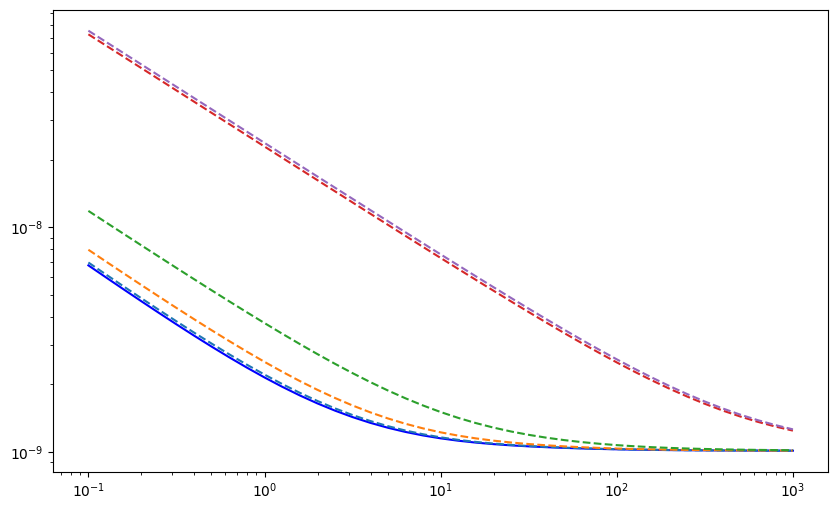

In [11]:
# test the corrected simulation noise
plt.figure(figsize=(10, 6))
plt.loglog(B2P1_simu['f'], B2P1_simu['avg_noise'], label='B2P1 Simu', color='blue')
for i in range(len(resistor_name)):
    corrected_df = sim_correction(B2P1_simu, res_flicker_noise_true[i], 39, 'avg')
    plt.loglog(corrected_df['f'], corrected_df['noise'], label=f'B2P1 Simu + {resistor_name[i]} Noise', linestyle='--')

### 2.1. Noise of Pre-amplifier SR560

In [12]:
# Define your directory here
data_dir = './../03032026'  # Change this to your actual folder name
dataframes = {}

# Load the data into the dictionary
dataframes = load_noise_data(data_dir)

Successfully loaded 21 files from ./../03032026.


In [13]:
def spec_combine_SR(df_dict, nametype, num, frequency):
    df_list = []

    for freq in frequency:
        name = f'{nametype}{num}{freq}'
        df_temp = df_dict.get(name)
        
        if df_temp is not None:
            # Ensure we only take the columns we need to avoid errors
            df_list.append(df_temp[['f', 'noise']])

    if not df_list:
        print("No data found.")
        return None

    # 1. Stack all dataframes on top of each other
    combined = pd.concat(df_list, ignore_index=True)

    # 2. Group by frequency 'f'. 
    # If a frequency exists in 3 files, it calculates the mean of those 3.
    # If it exists in only 1 file, the mean is just that single value.
    final_df = combined.groupby('f', as_index=False)['noise'].mean()

    # Sort by frequency to ensure the spectrum is continuous for plotting
    final_df = final_df.sort_values('f')

    return final_df
nametype = 'SR'
num = [2,1]
frequency = ['UF','LF','HF']


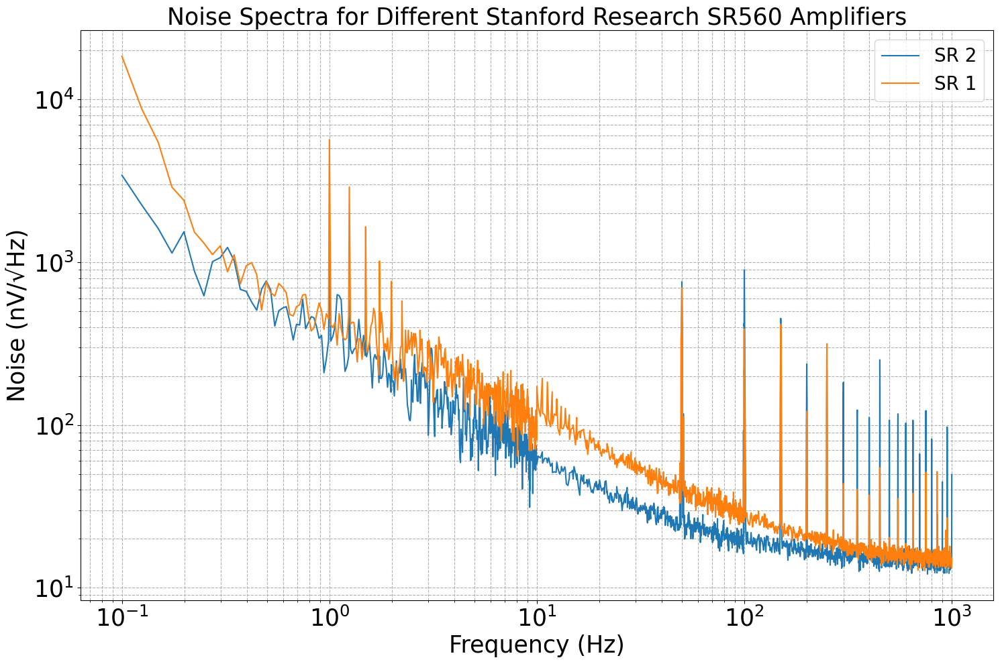

In [14]:
plt.figure(figsize = (15,10))
plt.title('Noise Spectra for Different Stanford Research SR560 Amplifiers', fontsize = 25)
for numb in num: 
    data = spec_combine_SR(dataframes, nametype, numb, frequency)
    plt.loglog(data['f'], data['noise']*1e9/10, label=f'SR {numb}')
    plt.xlabel('Frequency (Hz)', fontsize = 25)
    plt.ylabel('Noise (nV/√Hz)', fontsize = 25)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    plt.grid(True, which="both", ls="--")
    plt.legend(fontsize = 20)
plt.tight_layout()
plt.savefig('plot/SR560_comparison.png', dpi=300)

    


### 2.2. Measurement 

In [15]:
# Part of our data measured in folder measure 3 
#we load the dataframe 
data_dir = './../measure3'  # Change this to your actual folder name
# Load the data into the dictionary
dataframes2 = load_noise_data(data_dir)

Successfully loaded 36 files from ./../measure3.


1. Results measured using the first SR560 (the one below) with gain G = 10 

Result overplotting the noise measured in 3 boards (3 pairs each) and the intrinsic noise of the Stanford Reseach Pre-amplifier (SR560)

Plotting for Board 1
Plotting for Board 1
Plotting for Board 1
Plotting for Board 2
Plotting for Board 2
Plotting for Board 2
Plotting for Board 3
Plotting for Board 3
Plotting for Board 3


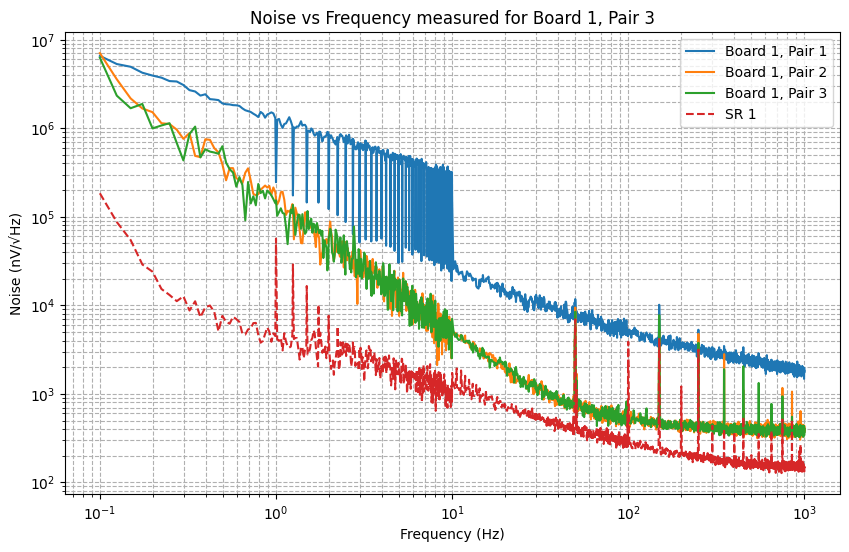

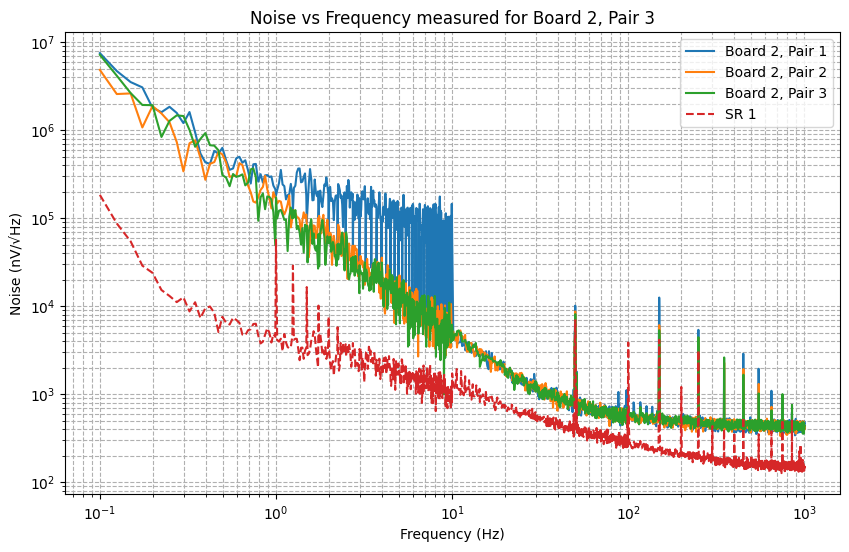

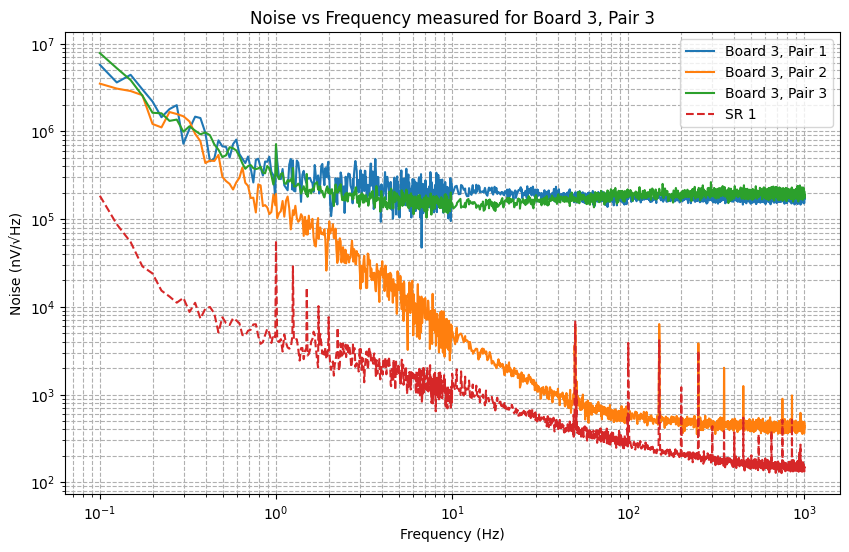

In [16]:
nametype = 'B'
board_number = [1,2,3]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']
for board in board_number:
    plt.figure(figsize=(10, 6))
    for pair in pair_number:
        print(f"Plotting for Board {board}")
        # G_SR = 10
        # if board == 1:
        #     G_y = 1e9/30/G_SR
        # else:
        #     G_y = 1e9/40/G_SR
        # G_x = 1
        G_SR = 10
        G_x = 1 
        G_y = 1e9 
        data = spec_combine(dataframes2, nametype, board, pair, frequency)
        
        plt.title(f'Noise vs Frequency measured for Board {board}, Pair {pair}')
        # for freq in frequency:
            # sort_plot('B',board, pair, freq,G_x,G_y,style='-')
        plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
    data1 = spec_combine_SR(dataframes, 'SR', 1, frequency)
    plt.loglog(data1['f']*G_x, data1['noise']*1e9, label=f'SR 1', linestyle='--')    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Noise (nV/√Hz)')
    plt.grid(True, which="both", ls="--")
    plt.legend()
    # plt.show()

Plotting for Board 2
Plotting for Board 2
Plotting for Board 2
Plotting for Board 2
Plotting for Board 2
Plotting for Board 2


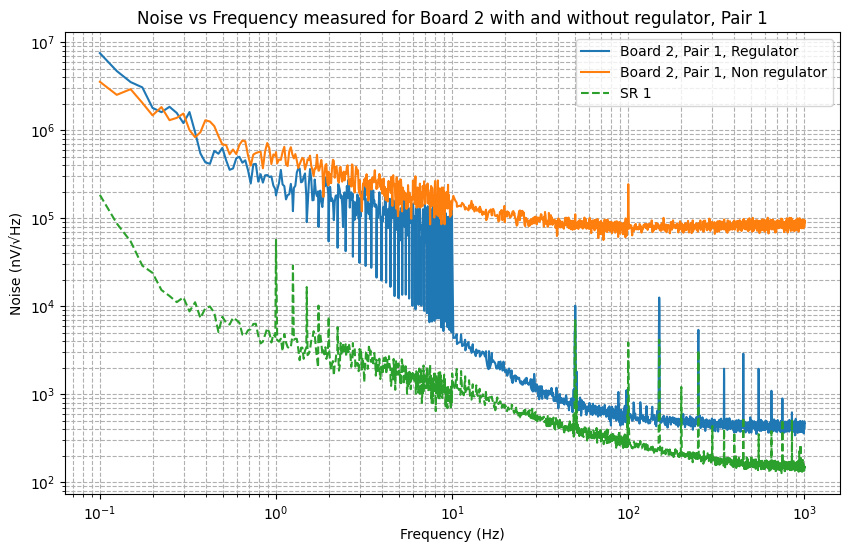

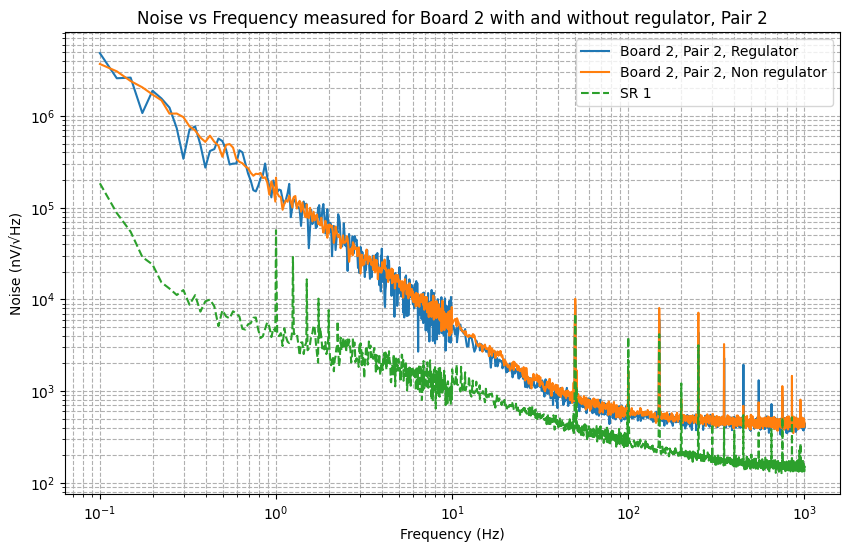

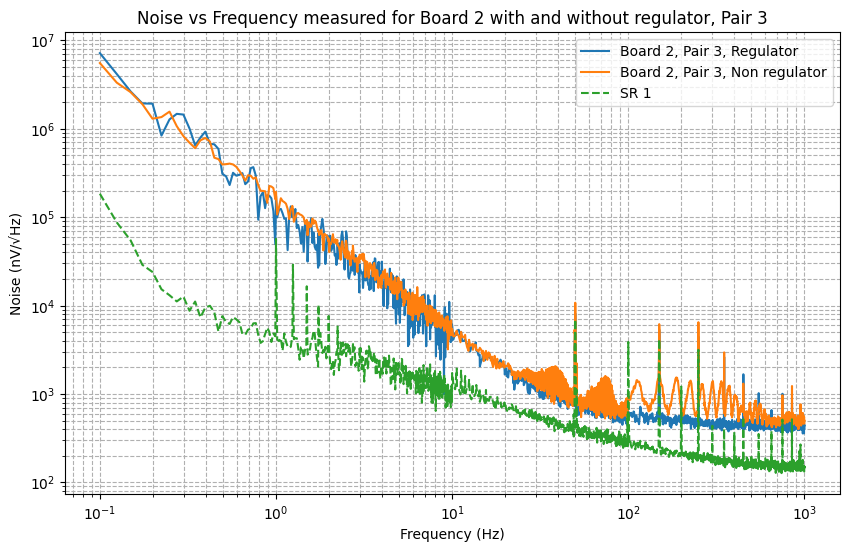

In [17]:
board_type = ['B','D']
board_number = [2]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']

for pair in pair_number:
    plt.figure(figsize=(10, 6))
    plt.title(f'Noise vs Frequency measured for Board 2 with and without regulator, Pair {pair}')
    for board in board_number:
            for type in board_type:
                if type == 'D':
                     ps = 'Non regulator'
                else:                     ps = 'Regulator'
                print(f"Plotting for Board {board}")
                G_SR = 10
                G_x = 1 
                G_y = 1e9 

                data = spec_combine(dataframes2, type, board, pair, frequency)
                # plt.title(f'Noise vs Frequency for Board {board}, Pair {pair}')
                # for freq in frequency:
                    # sort_plot('B',board, pair, freq,G_x,G_y,style='-')
                plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}, {ps}')
    data1 = spec_combine_SR(dataframes, 'SR', 1, frequency)
    plt.loglog(data1['f']*G_x, data1['noise']*1e9, label=f'SR 1', linestyle='--')  
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Noise (nV/√Hz)')
    plt.grid(True, which="both", ls="--")
    plt.legend()
        # plt.show()

2. Results measured with the second SR560 (above)

Successfully loaded 21 files from ./../03032026.
Plotting for Board 2, Pair 2, Type D
Plotting for Board 2, Pair 2, Type B
Plotting for Board 2, Pair 3, Type D
Plotting for Board 2, Pair 3, Type B


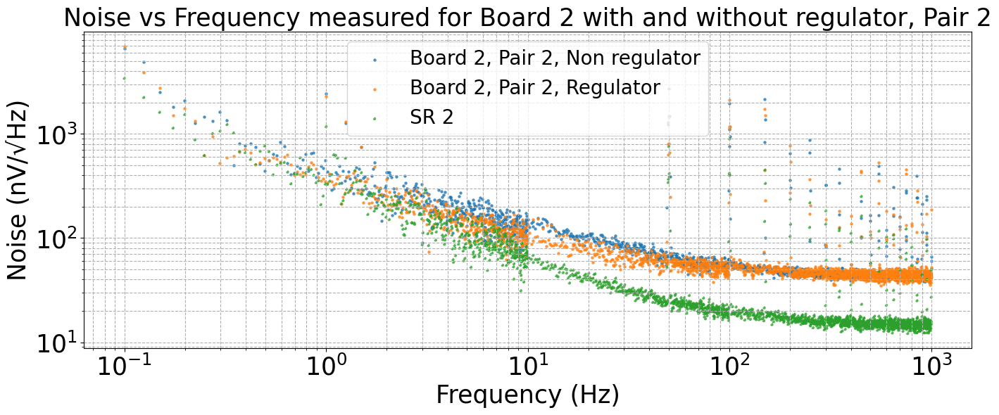

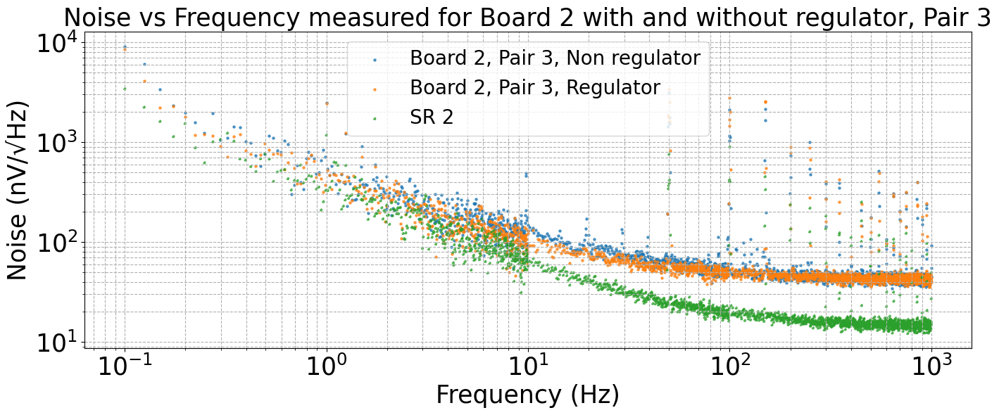

In [18]:
# Define your directory here
data_dir = './../03032026'  # Change this to your actual folder name
dataframes = {}

# Load the data into the dictionary
dataframes = load_noise_data(data_dir)

board_type = ['D','B']
board_number = [2]
pair_number = [2,3]
frequency = ['UF', 'HF', 'LF']

for pair in pair_number:
    plt.figure(figsize=(14, 6))
    plt.title(f'Noise vs Frequency measured for Board 2 with and without regulator, Pair {pair}', fontsize = 25)
    for board in board_number:
            for type in board_type:
                if type == 'D':
                     ps = 'Non regulator'
                else:                     ps = 'Regulator'
                print(f"Plotting for Board {board}, Pair {pair}, Type {type}")
                G_SR = 10
                G_x = 1
                G_y = 1e9/G_SR 

                data = spec_combine(dataframes, type, board, pair, frequency)
                plt.scatter(data['f']*G_x, data['noise']*G_y, s = 5, alpha = 0.7, label=f'Board {board}, Pair {pair}, {ps}')
    data1 = spec_combine_SR(dataframes, 'SR', 2, frequency)
    plt.scatter(data1['f']*G_x, data1['noise']*1e9/G_SR,s=5, alpha = 0.7, label=f'SR 2', linestyle='--')  
    plt.xlabel('Frequency (Hz)', fontsize = 25)
    plt.ylabel('Noise (nV/√Hz)', fontsize = 25)
    plt.grid(True, which="both", ls="--")
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(fontsize = 20)
    plt.tight_layout()
    plt.savefig(f'plot/measurement_B{board}P{pair}_regulator_compare.png', dpi = 300)
        # plt.show()

3. Measurement conducted on 04032026

In [19]:
# Part of our data measured in folder measure 3 
#we load the dataframe 
data_dir = './../04032026'  # Change this to your actual folder name
# Load the data into the dictionary
dataframes3 = load_noise_data(data_dir)

Successfully loaded 17 files from ./../04032026.


Plotting for Board 1
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 2: No data found.
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 3: No data found.
Plotting for Board 2
No data found.
Skipping plot for Board 2, Pair 1: No data found.
Plotting for Board 2
Plotting for Board 2
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 1: No data found.
Plotting for Board 3
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 3: No data found.


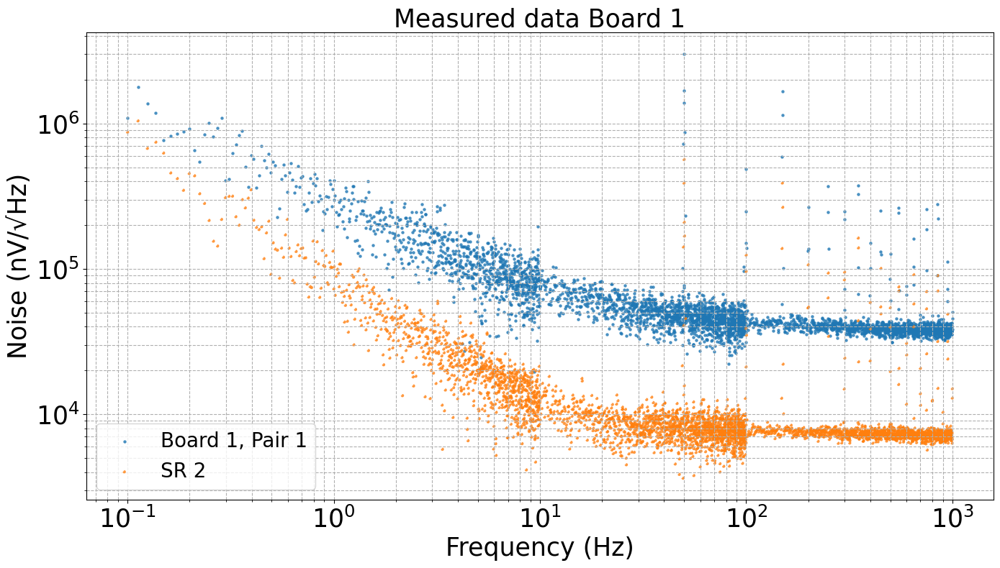

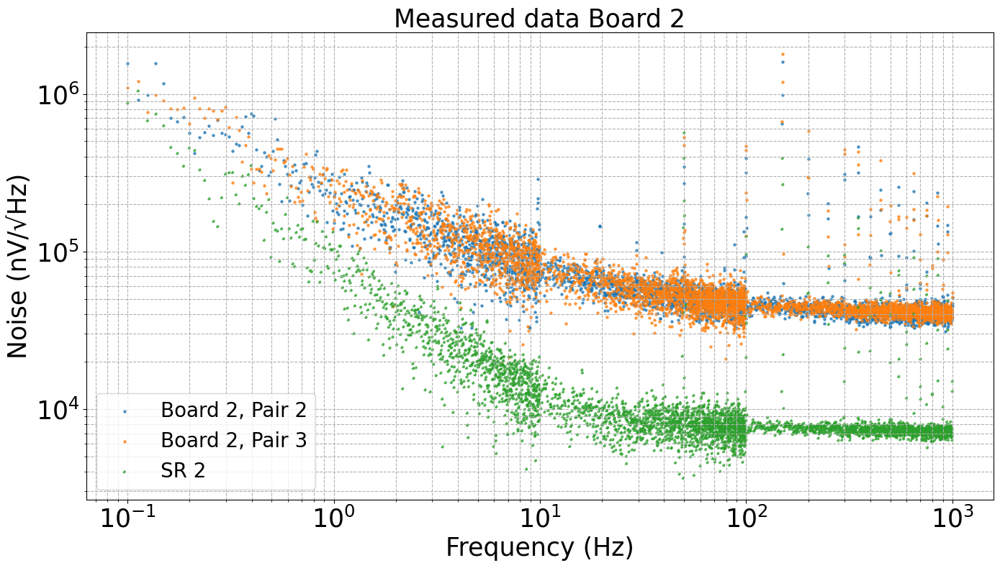

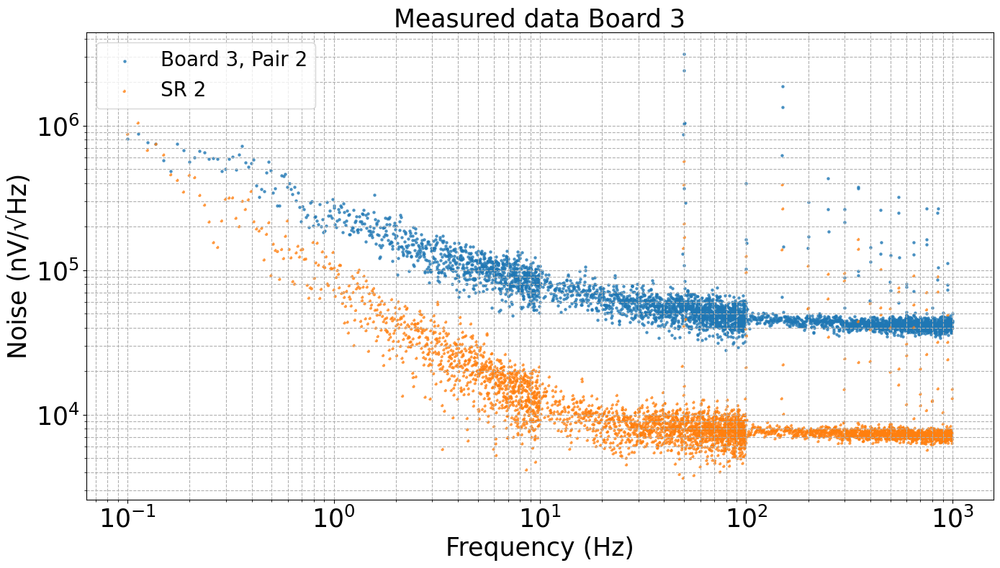

In [20]:
nametype = 'B'
board_number = [1,2,3]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']
for board in board_number:
    plt.figure(figsize=(14, 8))
    for pair in pair_number:
        print(f"Plotting for Board {board}")
        # G_SR = 10
        # if board == 1:
        #     G_y = 1e9/30/G_SR
        # else:
        #     G_y = 1e9/40/G_SR
        # G_x = 1
        G_SR = 1
        G_x = 1 
        G_y = 1e9 
        data = spec_combine(dataframes3, nametype, board, pair, frequency)
        # Check if data actually exists before trying to plot
        if data is not None:
            plt.scatter(data['f']*G_x, data['noise']*G_y, s= 5, alpha=0.7, label=f'Board {board}, Pair {pair}')
            plt.title(f'Measured data Board {board}', fontsize=25)

            # # You can also move your SR (reference) plotting inside here if it depends on data
            # data1 = spec_combine_SR(dataframes, 'SR', 1, frequency)
            # if data1 is not None:
            #      plt.loglog(data1['f']*G_x, data1['noise']*1e9, label='SR 1', linestyle='--')
        else:
            print(f"Skipping plot for Board {board}, Pair {pair}: No data found.")
        # plt.title(f'Noise vs Frequency measured for Board {board}, Pair {pair}')
        # # for freq in frequency:
        #     # sort_plot('B',board, pair, freq,G_x,G_y,style='-')
        # plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
    data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
    #save SR data
    # save_df_to_txt(data1, 'SR2_noise_spectrum.txt')
    plt.scatter(data1['f']*G_x, data1['noise']*1e9, s = 5, alpha=0.7, label=f'SR 2', linestyle='--')    
    plt.xlabel('Frequency (Hz)', fontsize=25)
    plt.ylabel('Noise (nV/√Hz)', fontsize=25)
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)
    plt.xscale('log')
    plt.yscale('log')
    plt.grid(True, which="both", ls="--")
    plt.legend(fontsize=20)
    plt.tight_layout()
    plt.savefig(f'plot/measurement_raw_B{board}.png', dpi=300)
    # plt.show()

Try quadratic subtraction the data

Plotting for Board 1
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 2: No data found.
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 3: No data found.
Plotting for Board 2
No data found.
Skipping plot for Board 2, Pair 1: No data found.
Plotting for Board 2
Plotting for Board 2
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 1: No data found.
Plotting for Board 3
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 3: No data found.


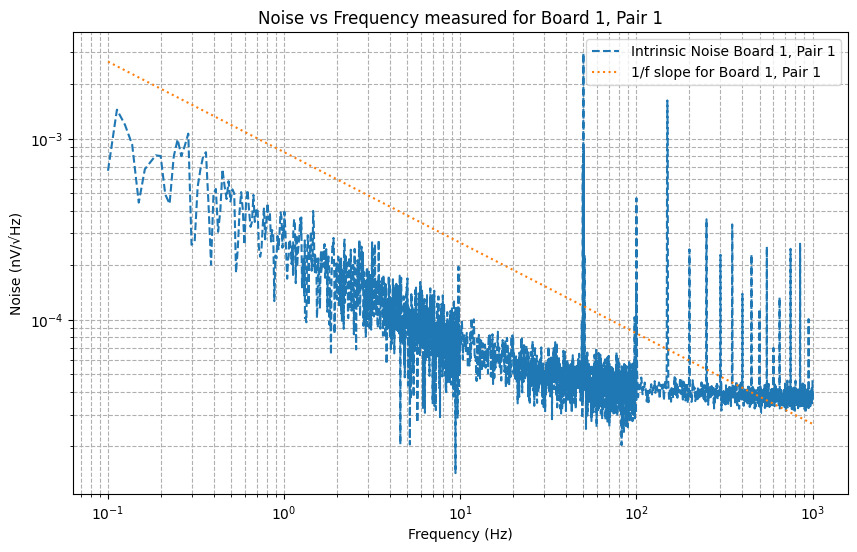

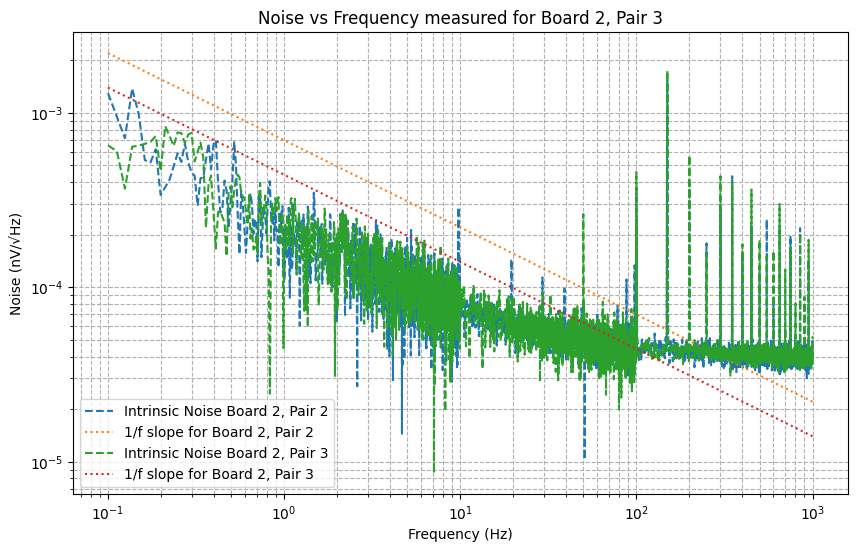

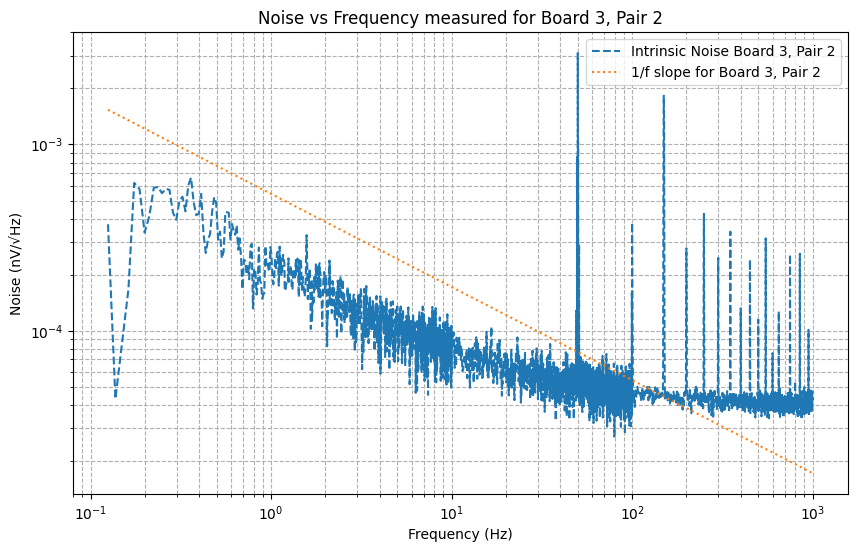

In [21]:
nametype = 'B'
board_number = [1,2,3]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']
for board in board_number:
    plt.figure(figsize=(10, 6))
    for pair in pair_number:
        print(f"Plotting for Board {board}")
        # G_SR = 10
        # if board == 1:
        #     G_y = 1e9/30/G_SR
        # else:
        #     G_y = 1e9/40/G_SR
        # G_x = 1
        # G_SR = 1000
        # G_x = 1 
        # G_y = 1e9/40/G_SR
        G_y = 1 
        data = spec_combine(dataframes3, nametype, board, pair, frequency)
        data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
        
        # Check if data actually exists before trying to plot
        if data is not None:
            # plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
            noise_intr = quadr_subtract(data, data1)
            plt.loglog(noise_intr['f']*G_x, noise_intr['noise']*G_y, label=f'Intrinsic Noise Board {board}, Pair {pair}', linestyle='--')
            plt.title(f'Noise vs Frequency measured for Board {board}, Pair {pair}')
            ymax = max((noise_intr['noise'] * G_y).iloc[20:80])
            plt.plot(noise_intr['f']*G_x,ymax/np.sqrt(noise_intr['f']*G_x), label=f'1/f slope for Board {board}, Pair {pair}', linestyle=':')

        
        else:
            print(f"Skipping plot for Board {board}, Pair {pair}: No data found.")
    
    # data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
    # plt.loglog(data1['f']*G_x, data1['noise']*1e9, label=f'SR 2', linestyle='--')    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Noise (nV/√Hz)')
    plt.grid(True, which="both", ls="--")
    plt.legend()

Try fitting the Noise Floor 

Plotting for Board 1
Targeted masking removed 331 points.
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 2: No data found.
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 3: No data found.
Plotting for Board 2
No data found.
Skipping plot for Board 2, Pair 1: No data found.
Plotting for Board 2
Targeted masking removed 331 points.
Plotting for Board 2
Targeted masking removed 331 points.
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 1: No data found.
Plotting for Board 3
Targeted masking removed 331 points.
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 3: No data found.


/Users/ton/miniforge3/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/ton/miniforge3/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


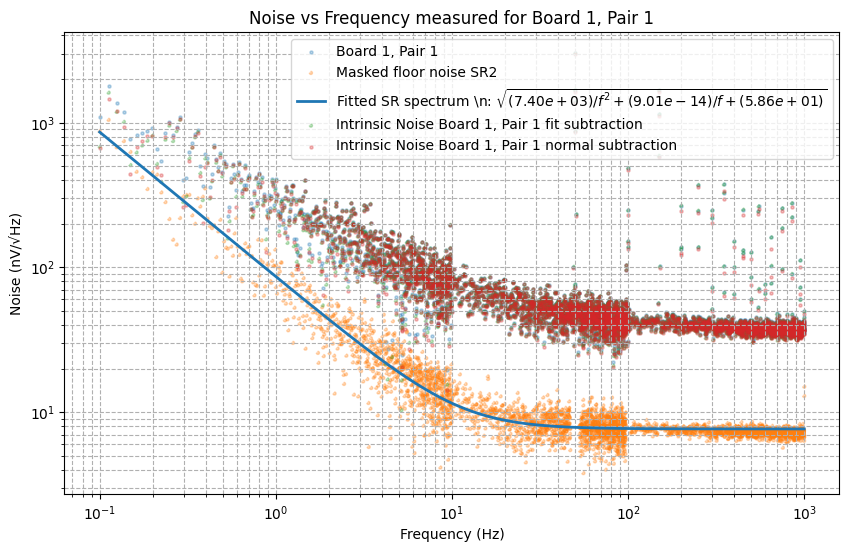

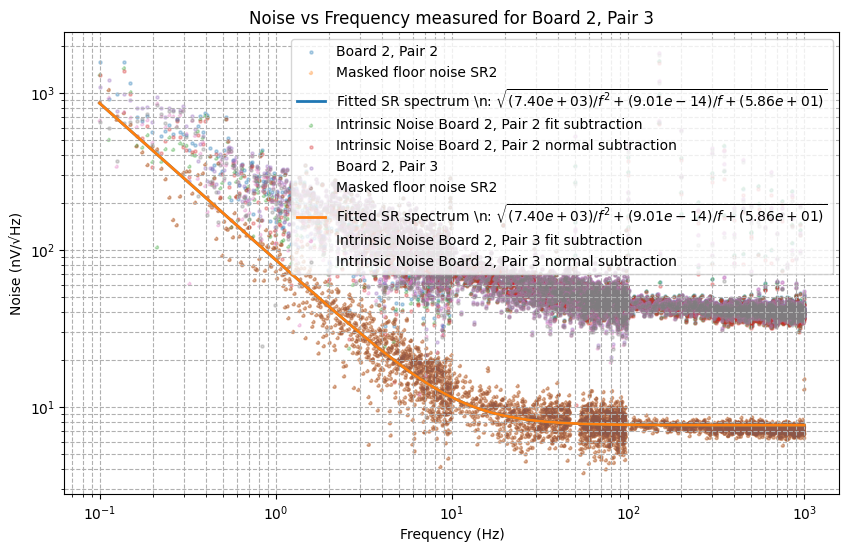

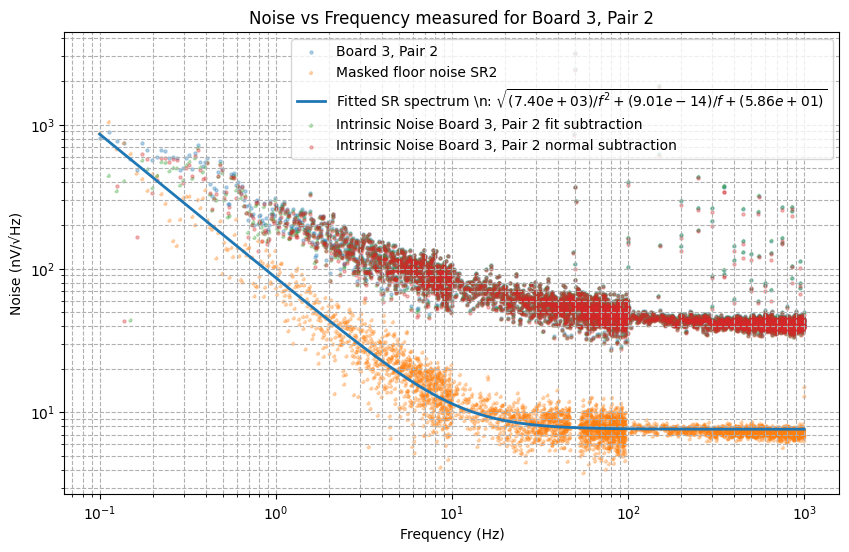

In [22]:
threshold = 2e-7 
def noise_model_SR(frequency, A, B, C):
        return np.sqrt(A/frequency**2 + B/frequency + C)  # B is squared to ensure it's positive
nametype = 'B'
board_number = [1,2,3]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']
for board in board_number:
    plt.figure(figsize=(10, 6))
    for pair in pair_number:
        print(f"Plotting for Board {board}")
        
        G_SR = 1000
        G_x = 1 
        G_y = 1e9/G_SR 
        data = spec_combine(dataframes3, nametype, board, pair, frequency)
        # Check if data actually exists before trying to plot
        if data is not None:
            plt.scatter(data['f']*G_x, data['noise']*G_y,s = 5, alpha = 0.3, label=f'Board {board}, Pair {pair}')
            plt.title(f'Noise vs Frequency measured for Board {board}, Pair {pair}')
            data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
            target_freqs = np.arange(50, 1000, 50)  # Target frequencies at 50Hz intervals

            data_masked = smart_masking(data1['f'], data1['noise'], threshold, bandwidth=3, target_freqs=target_freqs)
            # data_masked = rolling_mask(noise_intr['f'], noise_intr['noise'])


#             #test the masked data
            plt.scatter(data_masked[0]*G_x, data_masked[1]*G_y,s = 5, alpha = 0.3, label=f'Masked floor noise SR2 ', linestyle='--')

            f_data = data_masked[0].values
            n_data = data_masked[1].values * G_y # Apply your gain      
            # Get fit parameters
            popt, pcov = curve_fit(noise_model_SR, f_data, n_data, bounds=(0, np.inf))

            A_fit, B_fit, C_fit = popt
            n_fit = noise_model_SR(f_data, *popt)       
            # print(f"Fit Results: A (Flicker coeff) = {A_fit:.2e}, B (White noise floor) = {B_fit:.2e}")
            plt.loglog(f_data, n_fit, 
                   label=fr'Fitted SR spectrum \n: $\sqrt{{({A_fit:.2e})/f^2 + ({B_fit:.2e})/f + ({C_fit:.2e})}}$', 
                   linestyle='-', linewidth=2)

            # do quadratic subtraction to get the intrinsic noise of the board 
            f_plot = data['f']*G_x
            plt.scatter(f_plot, np.sqrt((data['noise']*G_y)**2 -  noise_model_SR(f_plot, *popt)**2),s = 5, alpha = 0.3, label=f'Intrinsic Noise Board {board}, Pair {pair} fit subtraction', linestyle='--')
            noise_intr = quadr_subtract(data, data1)
            plt.scatter(noise_intr['f']*G_x, noise_intr['noise']*G_y,s = 5, alpha = 0.3, label=f'Intrinsic Noise Board {board}, Pair {pair} normal subtraction')
            
        else:
            print(f"Skipping plot for Board {board}, Pair {pair}: No data found.")
        # plt.title(f'Noise vs Frequency measured for Board {board}, Pair {pair}')
        # # for freq in frequency:
        #     # sort_plot('B',board, pair, freq,G_x,G_y,style='-')
        # plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
        
#         plt.loglog(data1['f']*G_x, data1['noise']*1e9, label=f'SR 2', linestyle='--') 
    plt.xscale('log')
    plt.yscale('log')   
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Noise (nV/√Hz)')
    plt.grid(True, which="both", ls="--")
    plt.legend()
    # plt.show()

Compare with the simulations

Plotting for Board 1
Targeted masking removed 331 points.
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 2: No data found.
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 3: No data found.
Plotting for Board 2
No data found.
Skipping plot for Board 2, Pair 1: No data found.
Plotting for Board 2
Targeted masking removed 326 points.
Plotting for Board 2
Targeted masking removed 327 points.
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 1: No data found.
Plotting for Board 3
Targeted masking removed 331 points.
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 3: No data found.


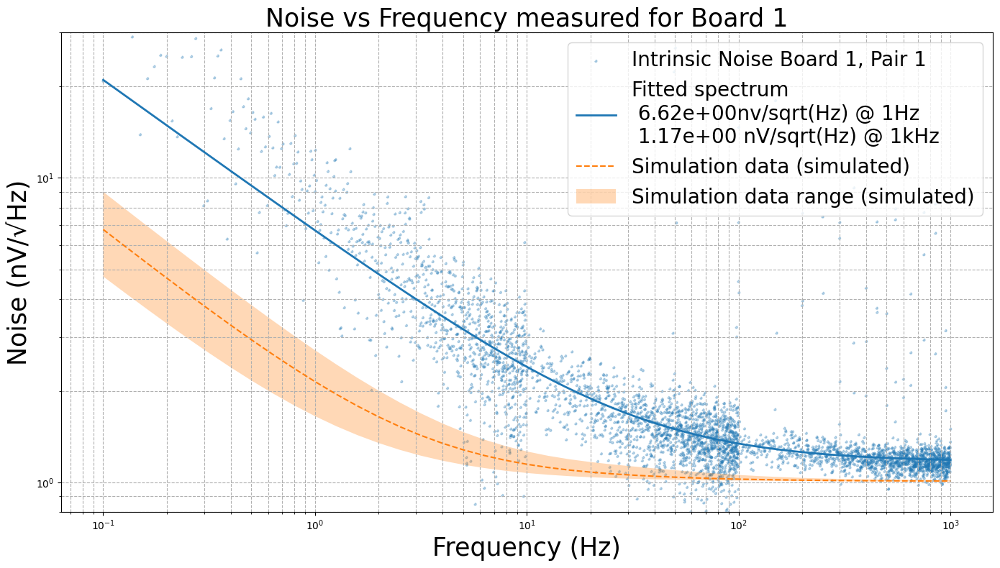

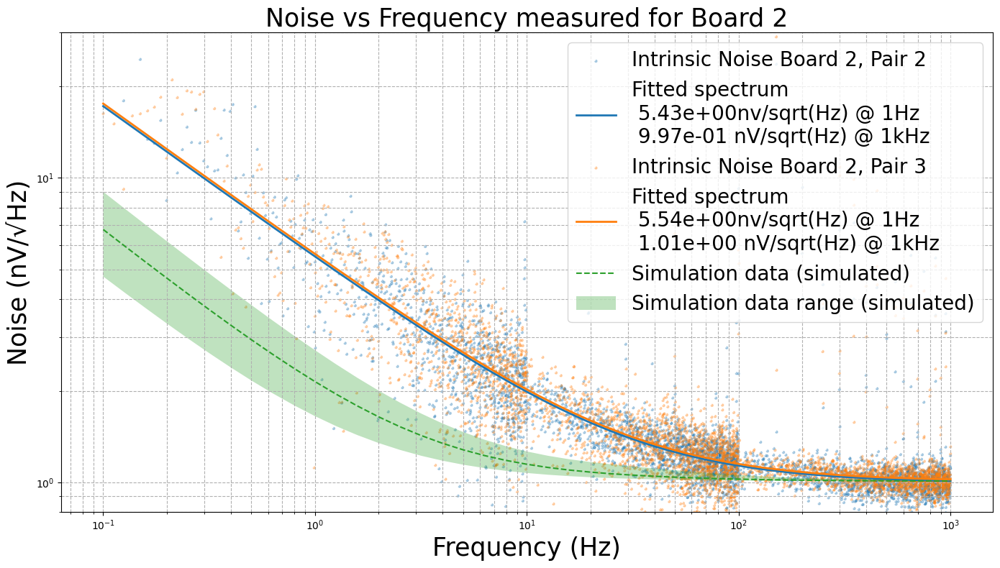

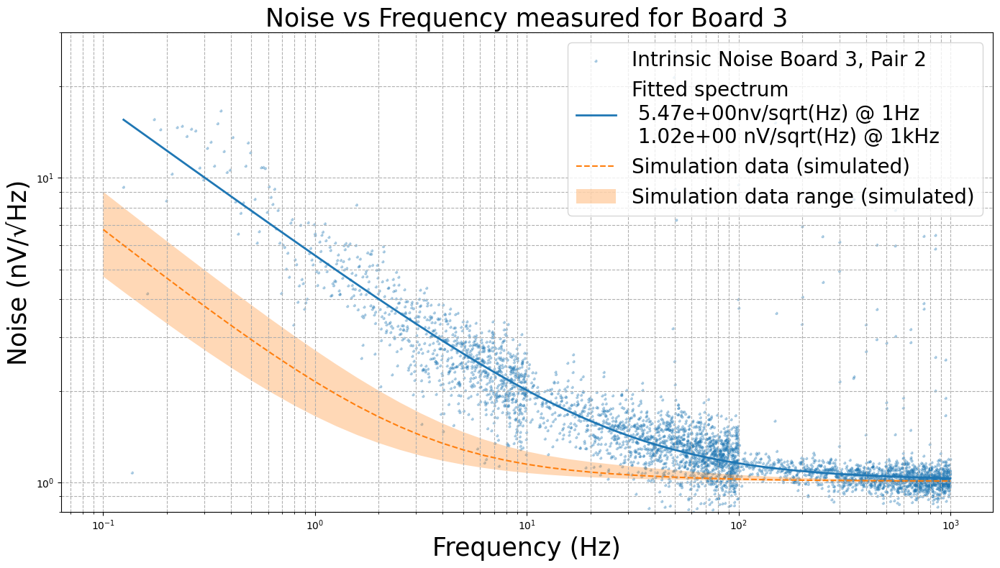

In [23]:
f_w = 600  # Frequency above which we consider noise to be mostly white
f_f = 60  # Frequency below which we consider noise to be mostly flicker
threshold = 1e-8
nametype = 'B'
board_number = [1,2,3]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']
for board in board_number:
    plt.figure(figsize=(14, 8))
    for pair in pair_number:
        print(f"Plotting for Board {board}")
        G_SR = 1000
        if board == 1:
            G_y = 1e9/32/G_SR
        else:
            G_y = 1e9/40/G_SR
        # G_x = 1
       
        # G_x = 1 
        # G_y = 1e9/40/G_SR 
        data = spec_combine(dataframes3, nametype, board, pair, frequency)
        data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
        
        # Check if data actually exists before trying to plot
        if data is not None:
            # plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
            noise_intr = quadr_subtract(data, data1)

            plt.scatter(noise_intr['f']*G_x, noise_intr['noise']*G_y, s = 5, alpha = 0.3, label=f'Intrinsic Noise Board {board}, Pair {pair}', linestyle='--')
            plt.title(f'Noise vs Frequency measured for Board {board}', fontsize=25)


            #masking out anomalous points (e.g., 50Hz and its harmonics)
            #since it was already subtracted the noise floor, we can use G_SR = 1 for masking
            # data_masked = masking(noise_intr['f'], noise_intr['noise'], 1e-8)
            target_freqs = np.arange(50, 1000, 50)  # Target frequencies at 50Hz intervals
            data_masked = smart_masking(noise_intr['f'], noise_intr['noise'], threshold, bandwidth=3, target_freqs=target_freqs)
            # data_masked = rolling_mask(noise_intr['f'], noise_intr['noise'])
            #test the masked data
            # plt.scatter(data_masked[0]*G_x, data_masked[1]*G_y,s = 5, alpha = 0.3, label=f'Masked Intrinsic Noise Board {board}, Pair {pair}', linestyle='--')
            f_data = data_masked[0].values
            n_data = data_masked[1].values * G_y # Apply your gain


            # Get fit parameters
            # params, n_fit = fit_noise_spectrum(f_data, n_data)
            params, n_fit = median_fit(f_data, n_data, f_w, f_f)
            A_fit, B_fit = params

            # print(f"Fit Results: A (Flicker coeff) = {A_fit:.2e}, B (White noise floor) = {B_fit:.2e}")
            plt.loglog(f_data, n_fit, label=f'Fitted spectrum \n {np.sqrt(A_fit):.2e}nv/sqrt(Hz) @ 1Hz \n {np.sqrt(B_fit):.2e} nV/sqrt(Hz) @ 1kHz', linestyle='-', linewidth=2)

            # Plot the Average line on top
            # plt.loglog(B2P1_simu['f'], B2P1_simu['avg_noise'] * 1e9, 
                    #    label='B2P1 Simu Average', linewidth=2)

        else:
            print(f"Skipping plot for Board {board}, Pair {pair}: No data found.")
    plt.loglog(B2P1_simu['f'], B2P1_simu['avg_noise']*1e9, label='Simulation data (simulated)', linestyle='--')
    # Plot the shaded range (Min to Max)
    plt.fill_between(B2P1_simu['f'], 
                     B2P1_simu['min_noise'] * 1e9, 
                     B2P1_simu['max_noise'] * 1e9, 
                     alpha=0.3, label='Simulation data range (simulated)')
    # data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
    # plt.loglog(data1['f']*G_x, data1['noise']*1e9, label=f'SR 2', linestyle='--')    
    plt.xlabel('Frequency (Hz)', fontsize=25)
    plt.ylabel('Noise (nV/√Hz)', fontsize=25)
    plt.grid(True, which="both", ls="--")
    plt.legend(loc = 'upper right', fontsize = 20)
    plt.ylim(0.8, 30)
    plt.tight_layout()
    plt.savefig(f'plot/measurement_B{board}_intrinsic_noise_fit_vs_simulation.png', dpi=300)
    # plt.show()

We try with the new fit method

In [24]:
# threshold = 1e-8
# nametype = 'B'
# board_number = [1,2,3]
# pair_number = [1,2,3]
# frequency = ['UF', 'HF', 'LF']
# for board in board_number:
#     plt.figure(figsize=(10, 6))
#     for pair in pair_number:
#         print(f"Plotting for Board {board}")
#         G_SR = 1000
#         if board == 1:
#             G_y = 1e9/39/G_SR
#         else:
#             G_y = 1e9/39/G_SR
#         # G_x = 1
       
#         # G_x = 1 
#         # G_y = 1e9/40/G_SR 
#         data = spec_combine(dataframes3, nametype, board, pair, frequency)
#         data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
        
#         # Check if data actually exists before trying to plot
#         if data is not None:
#             # plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
#             noise_intr = quadr_subtract(data, data1)

#             # plt.scatter(noise_intr['f']*G_x, noise_intr['noise']*G_y, s = 5, alpha = 0.3, label=f'Intrinsic Noise Board {board}, Pair {pair}', linestyle='--')
#             plt.title(f'Noise vs Frequency measured for Board {board}')

#             fit_data = proper_fit(data, data1, G_SR, G_y)
#             A_fit, B_fit = fit_data[0]
#             n_fit = fit_data[1]
#             plt.loglog(data1['f']*G_x, n_fit, label=f'Fitted intrinsic noise  \n sqrt({A_fit:.2e}/f + {B_fit:.2e})', linestyle='-', linewidth=2)    

#         else:
#             print(f"Skipping plot for Board {board}, Pair {pair}: No data found.")
#     plt.loglog(B2P1_simu['f'], B2P1_simu['avg_noise']*1e9, label='B2P1 Simulation', linestyle='--')
#     # Plot the shaded range (Min to Max)
#     plt.fill_between(B2P1_simu['f'], 
#                      B2P1_simu['min_noise'] * 1e9, 
#                      B2P1_simu['max_noise'] * 1e9, 
#                      alpha=0.3, label='B2P1 Simu Range')
#     # data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
#     # plt.loglog(data1['f']*G_x, data1['noise']*1e9, label=f'SR 2', linestyle='--')    
#     plt.xlabel('Frequency (Hz)')
#     plt.ylabel('Noise (nV/√Hz)')
#     plt.grid(True, which="both", ls="--")
#     plt.legend()

Plotting for Board 1
Targeted masking removed 220 points.
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 2: No data found.
Plotting for Board 1
No data found.
Skipping plot for Board 1, Pair 3: No data found.
Plotting for Board 2
No data found.
Skipping plot for Board 2, Pair 1: No data found.
Plotting for Board 2
Targeted masking removed 215 points.
Plotting for Board 2
Targeted masking removed 216 points.
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 1: No data found.
Plotting for Board 3
Targeted masking removed 220 points.
Plotting for Board 3
No data found.
Skipping plot for Board 3, Pair 3: No data found.


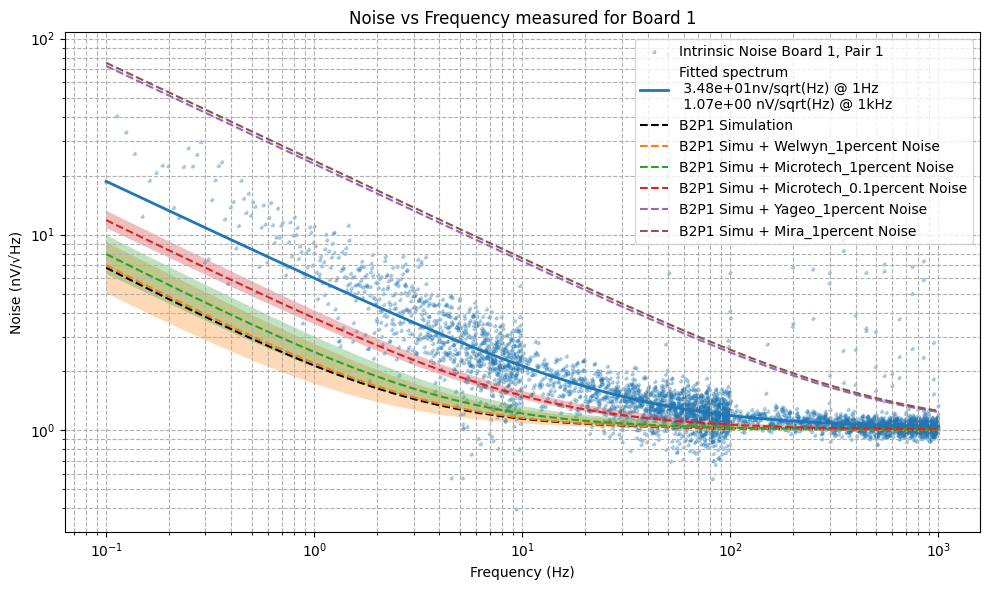

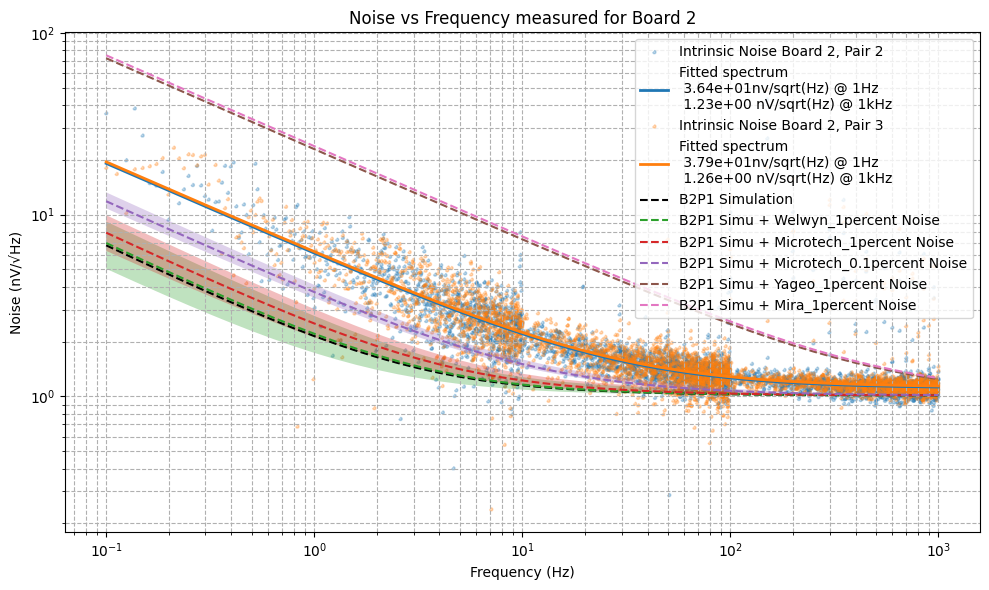

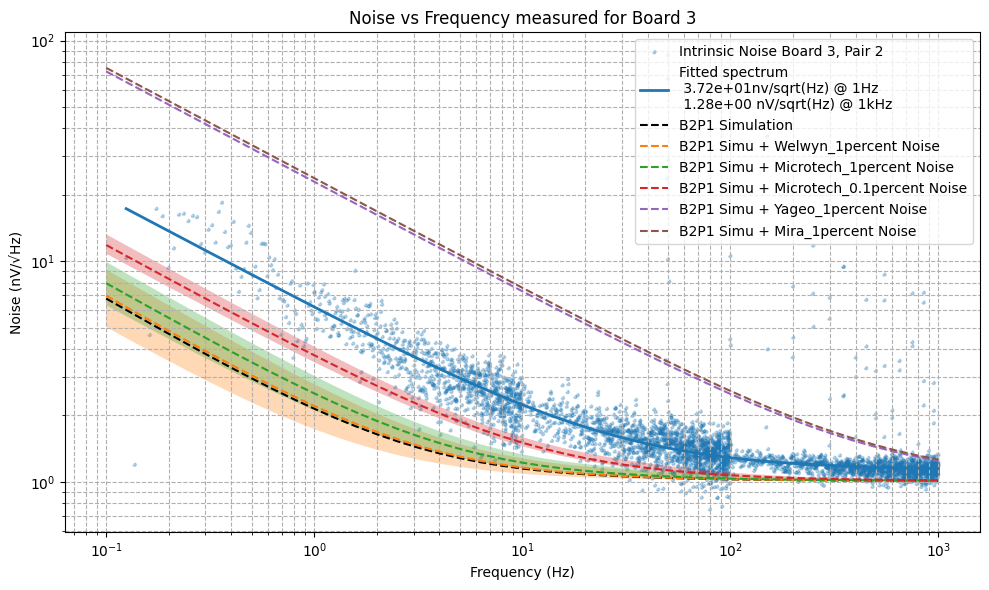

In [25]:
noise_test = {}
nametype = 'B'
board_number = [1,2,3]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']
for board in board_number:
    plt.figure(figsize=(10, 6))
    for pair in pair_number:
        print(f"Plotting for Board {board}")
        G_SR = 1000
        if board == 1:
            G_y = 1e9/36/G_SR
        else:
            G_y = 1e9/36/G_SR
        # G_x = 1
       
        # G_x = 1 
        # G_y = 1e9/40/G_SR 
        data = spec_combine(dataframes3, nametype, board, pair, frequency)
        data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
        
        # Check if data actually exists before trying to plot
        if data is not None:
            # plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
            noise_intr = quadr_subtract(data, data1)

            plt.scatter(noise_intr['f']*G_x, noise_intr['noise']*G_y, s = 5, alpha = 0.3, label=f'Intrinsic Noise Board {board}, Pair {pair}', linestyle='--')
            noise_test['f'] = noise_intr['f']
            noise_test['noise'] = noise_intr['noise']   
            plt.title(f'Noise vs Frequency measured for Board {board}')

            # ymax = max((noise_intr['noise'] * G_y).iloc[20:80])
            # plt.plot(noise_intr['f']*G_x,ymax/np.sqrt(noise_intr['f']*G_x), label=f'1/f slope for Board {board}, Pair {pair}', linestyle=':')
            
            #masking out anomalous points (e.g., 50Hz and its harmonics)
            #since it was already subtracted the noise floor, we can use G_SR = 1 for masking
            # data_masked = masking(noise_intr['f'], noise_intr['noise'], 1e-8)
            target_freqs = np.arange(50, 1000, 50)  # Target frequencies at 50Hz intervals
            data_masked = smart_masking(noise_intr['f'], noise_intr['noise'], threshold, bandwidth=2, target_freqs=target_freqs)
            #test the masked data
            # plt.scatter(data_masked[0]*G_x, data_masked[1]*G_y,s = 5, alpha = 0.3, label=f'Masked Intrinsic Noise Board {board}, Pair {pair}', linestyle='--')
            f_data = data_masked[0].values
            n_data = data_masked[1].values * G_y # Apply your gain


            # Get fit parameters
            # params, n_fit = fit_noise_spectrum(f_data, n_data)
            params, n_fit = median_fit(f_data, n_data, f_w, f_f)
            A_fit, B_fit = params

            # print(f"Fit Results: A (Flicker coeff) = {A_fit:.2e}, B (White noise floor) = {B_fit:.2e}")
            plt.loglog(f_data, n_fit, label=f'Fitted spectrum \n {np.abs(A_fit):.2e}nv/sqrt(Hz) @ 1Hz \n {B_fit:.2e} nV/sqrt(Hz) @ 1kHz', linestyle='-', linewidth=2)

            # Plot the Average line on top
            # plt.loglog(B2P1_simu['f'], B2P1_simu['avg_noise'] * 1e9, 
                    #    label='B2P1 Simu Average', linewidth=2)

        else:
            print(f"Skipping plot for Board {board}, Pair {pair}: No data found.")
    #simulation noise correspond for different CMS resistor  
    plt.loglog(B2P1_simu['f'], B2P1_simu['avg_noise']*1e9, color = 'black', label='B2P1 Simulation', linestyle='--')
    for i in range(len(resistor_name)):
        corrected_df = sim_correction(B2P1_simu, res_flicker_noise_true[i], 39, 'avg')
        plt.loglog(corrected_df['f'], corrected_df['noise']*1e9, label=f'B2P1 Simu + {resistor_name[i]} Noise', linestyle='--')
    # Plot the shaded range (Min to Max)
        plt.fill_between(B2P1_simu['f'], 
                         sim_correction(B2P1_simu, res_flicker_noise_true[i], 39, 'min')['noise'] * 1e9, 
                         sim_correction(B2P1_simu, res_flicker_noise_true[i], 39, 'max')['noise'] * 1e9, 
                         alpha=0.3)#, label='B2P1 Simu Range')
    # data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
    # plt.loglog(data1['f']*G_x, data1['noise']*1e9, label=f'SR 2', linestyle='--')    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Noise (nV/√Hz)')
    plt.grid(True, which="both", ls="--")
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'plot/Board_{board}_Noise_Spectrum_compare_sim.png', dpi=300)

### 2.3. Noise mismatches 

In [26]:
dataframes4 = load_noise_data('./../05032026')

Successfully loaded 8 files from ./../05032026.


Processing Board 2, Pair 1 (Mismatch: 0.05)
Processing Board 2, Pair 2 (Mismatch: 0.04)
Processing Board 2, Pair 3 (Mismatch: 0.03)
Successfully saved merged data to: Board_2_Mismatch_Data.txt


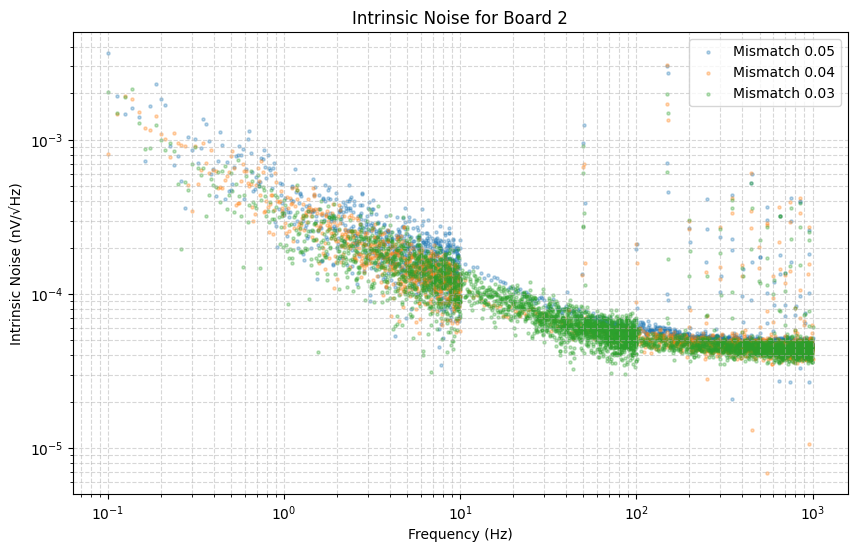

In [27]:
import pandas as pd
import numpy as np

nametype = 'B3P2A'
board_number = [2]
pair_number = [1, 2, 3]
frequency_list = ['UF', 'HF', 'LF']
mismatch = [0.05, 0.04, 0.03]

for board in board_number:
    plt.figure(figsize=(10, 6))
    
    # We will store each pair as a Series in this list
    all_series = []
    
    for pair, miss_val in zip(pair_number, mismatch):
        print(f"Processing Board {board}, Pair {pair} (Mismatch: {miss_val})")
        
        G_SR = 1
        G_y = 1
        G_x = 1 
        
        data = spec_combine_SR(dataframes4, nametype, pair, frequency_list)
        data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency_list)
        
        if data is not None:
            noise_intr = quadr_subtract(data, data1)
            
            f_vals = noise_intr['f'] * G_x
            n_vals = noise_intr['noise'] * G_y
            
            # Create a Series where the Index is the Frequency
            # This allows Pandas to align different lengths automatically
            s = pd.Series(n_vals.values, index=f_vals.values, name=f"Mismatch_{miss_val}")
            all_series.append(s)

            # Plotting
            plt.scatter(f_vals, n_vals, s=5, alpha=0.3, label=f'Mismatch {miss_val}')
        else:
            print(f"Skipping Board {board}, Pair {pair}: No data found.")

    # --- SAVE TO TXT FILE ---
    if all_series:
        # concat aligns all Series by their index (Frequency)
        df_export = pd.concat(all_series, axis=1)
        
        # Sort by index so frequency goes from low to high
        df_export = df_export.sort_index()
        
        # Rename the index so it has a header in the text file
        df_export.index.name = 'Frequency_Hz'
        
        filename = f"Board_{board}_Mismatch_Data.txt"
        # Since Frequency is the index, we set index=True
        df_export.to_csv(filename, sep='\t', index=True)
        
        print(f"Successfully saved merged data to: {filename}")

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Intrinsic Noise (nV/√Hz)')
    plt.title(f'Intrinsic Noise for Board {board}')
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.legend()
    plt.show()

Plotting for Board 2
Targeted masking removed 307 points.
Plotting for Board 2
Targeted masking removed 304 points.
Plotting for Board 2
Targeted masking removed 547 points.
Targeted masking removed 220 points.


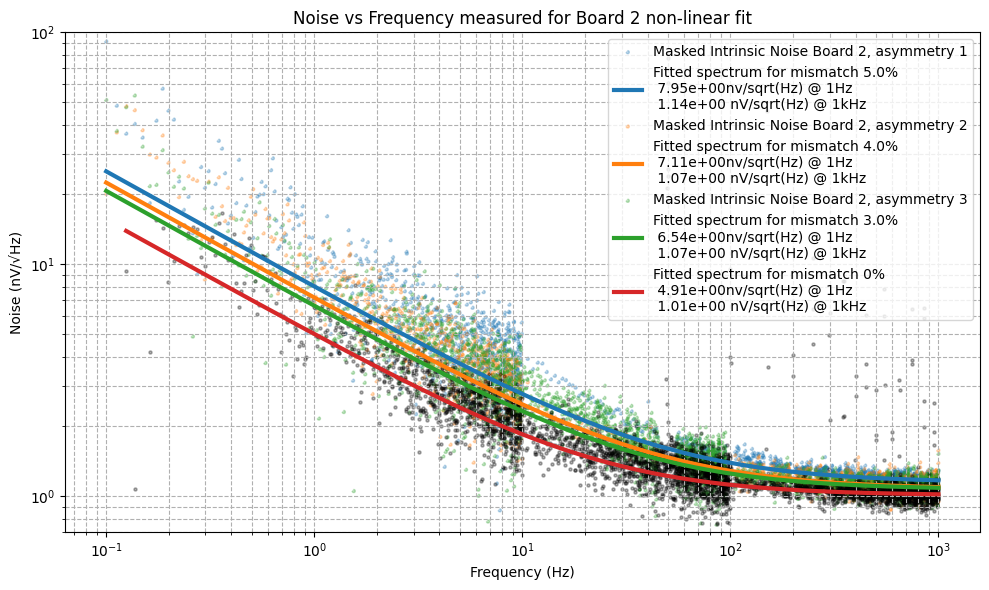

In [28]:
nametype = 'B3P2A'
board_number = [2]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']
mismatch = [0.05, 0.04, 0.03]
for board in board_number:
    plt.figure(figsize=(10, 6))
    for pair in pair_number:
        print(f"Plotting for Board {board}")
        G_SR = 1000
        if board == 1:
            G_y = 1e9/40/G_SR
        else:
            G_y = 1e9/40/G_SR
        # G_x = 1
       
        # G_x = 1 
        # G_y = 1e9/G_SR 
        # data = spec_combine(dataframes4, nametype, board, pair, frequency)
        
        data = spec_combine_SR(dataframes4, nametype, pair, frequency)
        data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
        
        # Check if data actually exists before trying to plot
        if data is not None:
            # plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
            
            noise_intr = quadr_subtract(data, data1)
            # plt.scatter(noise_intr['f']*G_x, noise_intr['noise']*G_y, s = 5, alpha = 0.3)#, label=f'Intrinsic Noise Board {board}, asymmetry {pair}', linestyle='--')
            # plt.scatter(data['f']*G_x, data['noise']*G_y, s = 5, alpha = 0.6, label=f'Intrinsic Noise Board {board}, asymmetry {pair}', linestyle='--')
            plt.title(f'Noise vs Frequency measured for Board {board} non-linear fit')

            ymax = max((noise_intr['noise'] * G_y).iloc[20:80])
            # plt.plot(noise_intr['f']*G_x,ymax/np.sqrt(noise_intr['f']*G_x), label=f'1/f slope for Board {board}, Pair {pair}', linestyle=':')
            
            # #masking out anomalous points (e.g., 50Hz and its harmonics)
            # #since it was already subtracted the noise floor, we can use G_SR = 1 for masking
            # data_masked = masking(noise_intr['f'], noise_intr['noise'], 0.5e-8)
            target_freqs = np.arange(50, 1000, 50)  # Target frequencies at 50Hz intervals
            data_masked = smart_masking(noise_intr['f'], noise_intr['noise'], threshold, bandwidth=5, target_freqs=target_freqs)
            # #test the masked data
            plt.scatter(data_masked[0]*G_x, data_masked[1]*G_y,s = 5, alpha = 0.3, label=f'Masked Intrinsic Noise Board {board}, asymmetry {pair}', linestyle='--')
            f_data = data_masked[0].values
            n_data = data_masked[1].values * G_y # Apply your gain


            # # Get fit parameters
            params, n_fit = fit_noise_spectrum(f_data, n_data)
            A_fit, B_fit = params

            # # print(f"Fit Results: A (Flicker coeff) = {A_fit:.2e}, B (White noise floor) = {B_fit:.2e}")
            plt.loglog(f_data, n_fit, label=f'Fitted spectrum for mismatch {mismatch[pair-1]*100}% \n {np.sqrt(A_fit):.2e}nv/sqrt(Hz) @ 1Hz \n {np.sqrt(B_fit):.2e} nV/sqrt(Hz) @ 1kHz', linestyle='-', linewidth=3)

        else:
            print(f"Skipping plot for Board {board}, Pair {pair}: No data found.")

    target_freqs = np.arange(50, 1000, 50)  # Target frequencies at 50Hz intervals
    data0 = spec_combine(dataframes3, 'B',3, 2, frequency)
    noise_intr0 = quadr_subtract(data0, data1)
    plt.scatter(noise_intr0['f']*G_x, noise_intr0['noise']*G_y, s = 5, color = 'black', alpha = 0.3)#, label=f'Intrinsic Noise Board {board} symmetry', linestyle='--')

    data_masked = smart_masking(noise_intr0['f'], noise_intr0['noise'], threshold, bandwidth=2, target_freqs=target_freqs)
    f_data = data_masked[0].values
    n_data = data_masked[1].values * G_y # Apply your gain
    # # Get fit parameters
    params, n_fit = fit_noise_spectrum(f_data, n_data)
    A_fit, B_fit = params
    plt.loglog(f_data, n_fit, label=f'Fitted spectrum for mismatch 0% \n {np.sqrt(A_fit):.2e}nv/sqrt(Hz) @ 1Hz \n {np.sqrt(B_fit):.2e} nV/sqrt(Hz) @ 1kHz', linestyle='-', linewidth=3)
  
    plt.xscale('log')
    plt.yscale('log') 
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Noise (nV/√Hz)')
    plt.grid(True, which="both", ls="--")
    plt.ylim(0.7,1e2)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'plot/Board_{board}_Noise_Spectrum_asymmetry_compare_nonlinearfit.png', dpi=300)

In [29]:
# try to use median method 
def median_fit(frequency, noise, f_w, f_f):
    f = frequency
    n = noise
    
    # --- METHOD 1: YOUR ROBUST MEDIAN ---
    # nw from high frequency (>300Hz)
    nw_r = np.median(n[f > f_w])
    # fc from low frequency (<100Hz)
    mask = (f < f_f) & (n > nw_r)
    fc_points = f[mask] * ((n[mask]**2 / nw_r**2) - 1)
    fc_r = np.median(fc_points)
    A = fc_r * nw_r**2
    B = nw_r**2
    n_fit = np.sqrt(A/f + B)
    return [A, B], n_fit

Plotting for Board 2
Targeted masking removed 307 points.
Plotting for Board 2
Targeted masking removed 304 points.
Plotting for Board 2
Targeted masking removed 547 points.
Targeted masking removed 220 points.


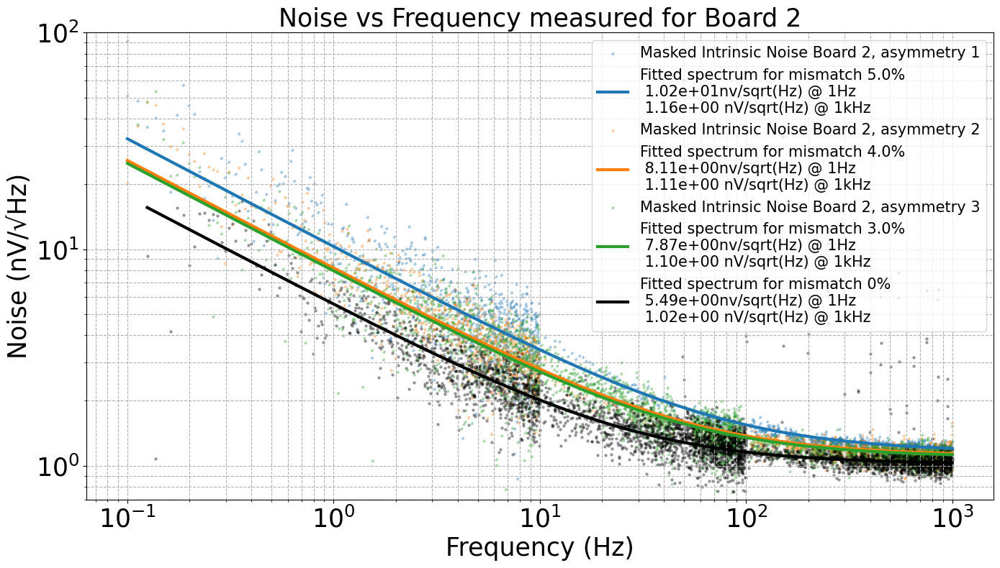

In [30]:
f_w = 600  # Frequency above which we consider noise to be mostly white
f_f = 60  # Frequency below which we consider noise to be mostly flicker
nametype = 'B3P2A'
board_number = [2]
pair_number = [1,2,3]
frequency = ['UF', 'HF', 'LF']
mismatch = [0.05, 0.04, 0.03]
for board in board_number:
    plt.figure(figsize=(14, 8))
    for pair in pair_number:
        print(f"Plotting for Board {board}")
        G_SR = 1000
        if board == 1:
            G_y = 1e9/40/G_SR
        else:
            G_y = 1e9/40/G_SR
        # G_x = 1
       
        # G_x = 1 
        # G_y = 1e9/G_SR 
        # data = spec_combine(dataframes4, nametype, board, pair, frequency)
        
        data = spec_combine_SR(dataframes4, nametype, pair, frequency)
        data1 = spec_combine_SR(dataframes3, 'SR', 2, frequency)
        
        # Check if data actually exists before trying to plot
        if data is not None:
            # plt.loglog(data['f']*G_x, data['noise']*G_y, label=f'Board {board}, Pair {pair}')
            
            noise_intr = quadr_subtract(data, data1)
            # plt.scatter(noise_intr['f']*G_x, noise_intr['noise']*G_y, s = 5, alpha = 0.3)#, label=f'Intrinsic Noise Board {board}, asymmetry {pair}', linestyle='--')
            # plt.scatter(data['f']*G_x, data['noise']*G_y, s = 5, alpha = 0.6, label=f'Intrinsic Noise Board {board}, asymmetry {pair}', linestyle='--')
            # plt.title(f'Noise vs Frequency measured for Board {board} median fit')
            plt.title(f'Noise vs Frequency measured for Board {board}', fontsize = 25)

        
            target_freqs = np.arange(50, 1000, 50)  # Target frequencies at 50Hz intervals
            data_masked = smart_masking(noise_intr['f'], noise_intr['noise'], threshold, bandwidth=5, target_freqs=target_freqs)
            # #test the masked data
            plt.scatter(data_masked[0]*G_x, data_masked[1]*G_y,s = 5, alpha = 0.3, label=f'Masked Intrinsic Noise Board {board}, asymmetry {pair}', linestyle='--')
            f_data = data_masked[0].values
            n_data = data_masked[1].values * G_y # Apply your gain


            # # Get fit parameters
            params, n_fit = median_fit(f_data, n_data, f_w, f_f)
            A_fit, B_fit = params

            # # print(f"Fit Results: A (Flicker coeff) = {A_fit:.2e}, B (White noise floor) = {B_fit:.2e}")
            plt.loglog(f_data, n_fit, label=f'Fitted spectrum for mismatch {mismatch[pair-1]*100}% \n {np.sqrt(A_fit):.2e}nv/sqrt(Hz) @ 1Hz \n {np.sqrt(B_fit):.2e} nV/sqrt(Hz) @ 1kHz', linestyle='-', linewidth=3)

        else:
            print(f"Skipping plot for Board {board}, Pair {pair}: No data found.")

    target_freqs = np.arange(50, 1000, 50)  # Target frequencies at 50Hz intervals
    data0 = spec_combine(dataframes3, 'B',3, 2, frequency)
    noise_intr0 = quadr_subtract(data0, data1)
    plt.scatter(noise_intr0['f']*G_x, noise_intr0['noise']*G_y, s = 5, color = 'black', alpha = 0.3)#, label=f'Intrinsic Noise Board {board} symmetry', linestyle='--')

    data_masked = smart_masking(noise_intr0['f'], noise_intr0['noise'], threshold, bandwidth=2, target_freqs=target_freqs)
    f_data = data_masked[0].values
    n_data = data_masked[1].values * G_y # Apply your gain
    # # Get fit parameters
    params, n_fit = median_fit(f_data, n_data, f_w, f_f)
    A_fit, B_fit = params
    plt.loglog(f_data, n_fit, label=f'Fitted spectrum for mismatch 0% \n {np.sqrt(A_fit):.2e}nv/sqrt(Hz) @ 1Hz \n {np.sqrt(B_fit):.2e} nV/sqrt(Hz) @ 1kHz', color='black', linestyle='-', linewidth=3)
  
    plt.xscale('log')
    plt.yscale('log') 
    plt.xlabel('Frequency (Hz)', fontsize = 25)
    plt.ylabel('Noise (nV/√Hz)', fontsize = 25)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    plt.grid(True, which="both", ls="--")
    plt.ylim(0.7,1e2)
    plt.legend(fontsize = 15)
    plt.tight_layout()
    plt.savefig(f'plot/Board_{board}_Noise_Spectrum_asymmetry_compare_medianfit.png', dpi=300)

In [31]:
RC = [[2172,2054],[2170,2083],[2168, 2101],[2148,2148]]
Ic = 0.5e-3
VT = 26e-3 
for rc in RC:
    RC1 = rc[0]
    RC2 = rc[1]
    gm = Ic/VT
    G = gm/2 * RC1 + gm/2 * RC2
    print(f"RC1: {RC1} Ohm, RC2: {RC2} Ohm, Gain: {G:.2f}")


RC1: 2172 Ohm, RC2: 2054 Ohm, Gain: 40.63
RC1: 2170 Ohm, RC2: 2083 Ohm, Gain: 40.89
RC1: 2168 Ohm, RC2: 2101 Ohm, Gain: 41.05
RC1: 2148 Ohm, RC2: 2148 Ohm, Gain: 41.31


### Measurement 11032026

In [32]:
dataframes5 = load_noise_data('./../11032026')

Successfully loaded 4 files from ./../11032026.


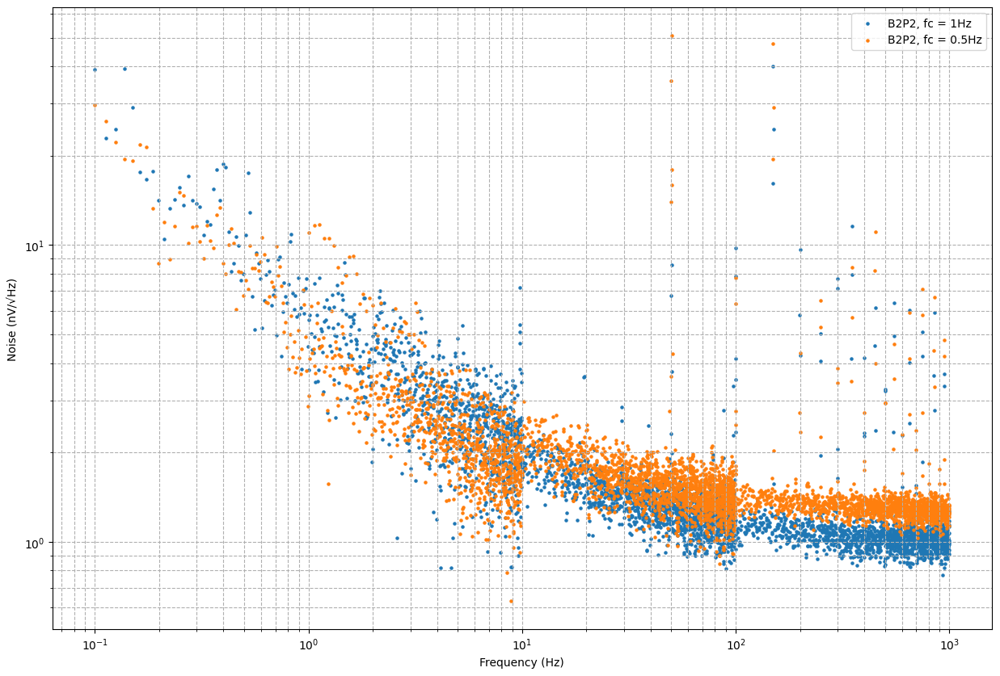

In [33]:
nametype = 'B'
board_number = 2
pair_number = 2
frequency_list = ['UF', 'HF', 'LF']

# spec_combine(df_dict, nametype, Nboard, Npair, frequency)
data = spec_combine(dataframes3, nametype, board_number, pair_number, frequency_list)
data1 = spec_combine(dataframes5, nametype, board_number, pair_number, frequency_list)
# plt.scatter(data1['f'], data1['noise'], s = 5, alpha = 0.3)
# data = spec_combine(dataframes3, nametype, board_number, pair_number, frequency_list)
plt.figure(figsize=(15,10))
plt.scatter(data['f'],   data['noise']*1e9/1000/40, s = 5, label = f'{nametype}{board_number}P{pair_number}, fc = 1Hz')
plt.scatter(data1['f'], data1['noise']*1e9/1000/40, s = 5, label = f'{nametype}{board_number}P{pair_number}, fc = 0.5Hz')
plt.xscale('log')
plt.yscale('log') 
plt.xlabel('Frequency (Hz)')
plt.ylabel('Noise (nV/√Hz)')
plt.grid(True, which="both", ls="--")
plt.legend()
    

### 12032026

1. Measure the noise in board 2 with/ without filtering in current mirror, but potentiometer use to adjust the Rc was removed 
2. Measure the gain 

In [34]:
dataframes6 = load_noise_data('./../12032026')

Successfully loaded 8 files from ./../12032026.


In [35]:
G = pd.read_csv(
    './../12032026/B2P2GNLF.TXT', 
    sep='\s+', 
    names=['f', 'G(mag)', 'G(phase)'], 
    engine='python'
)
G.head()

G_Amp = np.mean(G['G(mag)'])/2 
print(G_Amp)

G_f = 2152/2200

38.75350280137414


In [36]:
# G_y2 = 1e9/1000/G_Amp
# G_y1 = 1e9/1000/(G_Amp*G_f)
# nametype = 'B'
# board_number = 2
# pair_number = 2
# frequency_list = ['UF', 'HF', 'LF']

# noise_B2P2_nocap = spec_combine(dataframes6, nametype, board_number, '2N', frequency_list)
# noise_B2P2_wcap =  spec_combine(dataframes6, nametype, board_number, '2C', frequency_list)
# noise_B2P2_wcap_old = spec_combine(dataframes3, nametype, board_number, pair_number, frequency_list)
# plt.figure(figsize=(10,6))
# plt.scatter(noise_B2P2_wcap['f'],         noise_B2P2_wcap['noise']*G_y2, s = 5, alpha = 0.5, label = 'Board 2 (current source filtered)')
# plt.scatter(noise_B2P2_nocap['f'], noise_B2P2_nocap['noise']*G_y2, s = 5, alpha = 0.5, label = 'Board 2 (current source no filtered)')
# plt.scatter(noise_B2P2_wcap_old['f'], noise_B2P2_wcap_old['noise']*G_y1, s = 5, alpha = 0.5, label = 'Board 2 (old data)')
# plt.xscale('log')
# plt.yscale('log') 
# plt.xlabel('Frequency (Hz)')
# plt.ylabel('Noise (nV/√Hz)')
# plt.grid(True, which="both", ls="--")
# plt.legend()

### 13032026

Use board 3, remove high capacity capacitors to observe increase of common-mode noise due to mismatch

In [37]:
dataframes13022026 = load_noise_data('./../13032026')

Successfully loaded 16 files from ./../13032026.


In [38]:
?smart_masking_median

Signature:
smart_masking_median(
    frequency,
    noise_data,
    threshold_factor=1.5,
    target_freqs=None,
    bandwidth=10,
    window_size=50,
    force_mask_zone=False,
)
Docstring: <no docstring>
File:      /var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_11753/654442564.py
Type:      function

In [39]:
def total_fit(noise, noise_floor, G_y, do_floor_fit=False, **kwargs):
    """
    Refined noise fitting function.
    
    Parameters:
    - noise: DataFrame of the signal noise.
    - noise_floor: DataFrame of the background floor.
    - G_y: Gain multiplier.
    - do_floor_fit: Boolean toggle to smooth the floor before subtraction.
    - **kwargs: Pass-through parameters for threshold, bandwidth, f_w, f_f, etc.
    """
    
    # 1. Safety Check
    if noise is None or noise_floor is None:
        print("Data missing: 'noise' or 'noise_floor' is None.")
        return None

    # 2. Extract settings from kwargs with defaults
    thresh = kwargs.get('threshold', 1e-10)
    bw = kwargs.get('bandwidth', 5)
    f_w = kwargs.get('f_w', None)
    f_f = kwargs.get('f_f', None)
    target_freqs = kwargs.get('target_freqs', np.arange(50, 1000, 50))
    print(10*'--')
    # 3. Handle the Noise Floor (Optional Smoothing)
    if do_floor_fit:
        print("Performing noise floor mask...")
        f_m, n_m = smart_masking_median(
            noise_floor['f'], noise_floor['noise'], 
            threshold_factor=thresh, bandwidth=bw, target_freqs=target_freqs
        )
        
        # --- NEW: CLEANING STEP ---
        # Combine into a temporary DF to drop NaNs across both f and noise
        clean_df = pd.DataFrame({'f': f_m, 'n': n_m}).replace([np.inf, -np.inf], np.nan).dropna()
        
        if clean_df.empty:
            print("Warning: Masking removed all data. Skipping floor fit.")
            # Fallback: use raw noise_floor instead of crashing
        else:
            f_clean = clean_df['f'].values
            n_clean = clean_df['n'].values

            # Use the cleaned values for fitting
            popt, _ = curve_fit(noise_model_SR, f_clean, n_clean, bounds=(0, np.inf))
            n_fit_vals = noise_model_SR(f_clean, *popt)
            
            # Update the noise_floor variable
            noise_floor = pd.DataFrame({'f': f_clean, 'noise': n_fit_vals})

    # 4. Quadrature Subtraction
    # (Assuming quadr_subtract handles f-alignment internally)
    noise_intr = quadr_subtract(noise, noise_floor)

    # 5. Mask and Fit the Resulting Intrinsic Noise
    
    # f_intr_m, n_intr_m = smart_masking(
    #     noise_intr['f'], noise_intr['noise'], 
    #     thresh, bandwidth=bw, target_freqs=target_freqs
    # )
    print("Performing median masking on intrinsic noise...")
    f_intr_m, n_intr_m = smart_masking_median(
        noise_intr['f'], noise_intr['noise'] 
    )
    # Apply gain and perform final median fit
    f_data = f_intr_m.values
    n_data = n_intr_m.values * G_y
    
    params, n_fit_final = median_fit(f_data, n_data, f_w, f_f)
    
    return [params], f_data, n_fit_final

Successfully saved to ../13032026/B3P2A0.TXT
Successfully saved to ../13032026/B3P2A1.TXT
Successfully saved to ../13032026/B3P2A2.TXT
Successfully saved to ../13032026/B3P2A3.TXT


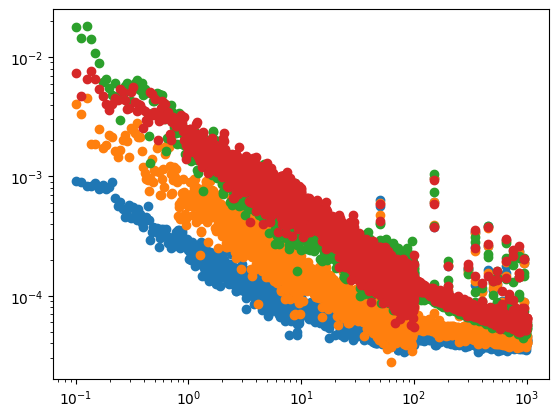

In [40]:
#savedatafile 
nametype = 'B'
board_number = [3]
pair_number = ['2A0','2A1','2A2','2A3']
frequency = ['UF', 'HF', 'LF']
mismatch_percentage = [0,5,10,15]
S = 0
for board in board_number:
    for pair in pair_number:
        data = spec_combine(dataframes13022026,nametype,board,pair,frequency)
        filename = f'{nametype}{board}P{pair}'
        S += 1 
        filename = save_df_to_txt(data,f'../13032026/{filename}.TXT')
        plt.scatter(data['f'], data['noise'])
        plt.xscale('log')
        plt.yscale('log')
SR_noisefloor = pd.read_csv(
    'SR2_noise_spectrum.txt', 
    sep='\s+', 
    names=['f', 'noise'], 
    engine='python'
)

In [41]:
?total_fit

Signature: total_fit(noise, noise_floor, G_y, do_floor_fit=False, **kwargs)
Docstring:
Refined noise fitting function.

Parameters:
- noise: DataFrame of the signal noise.
- noise_floor: DataFrame of the background floor.
- G_y: Gain multiplier.
- do_floor_fit: Boolean toggle to smooth the floor before subtraction.
- **kwargs: Pass-through parameters for threshold, bandwidth, f_w, f_f, etc.
File:      /var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_11753/1543342540.py
Type:      function

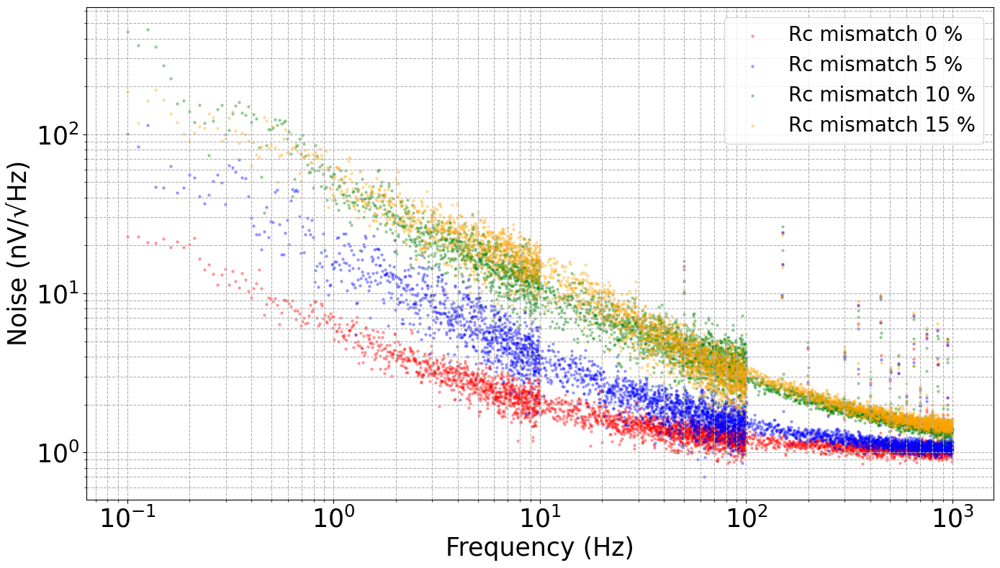

In [42]:
G_y = 1e9/40000
f_w = 970  # Frequency above which we consider noise to be mostly white
f_f = 60  # Frequency below which we consider noise to be mostly flicker
#savedatafile 
colors = ['red', 'blue', 'green', 'orange']
nametype = 'B'
board_number = [3]
pair_number = ['2A0','2A1','2A2','2A3']
# pair_number = ['2A0']
frequency = ['UF', 'LF', 'HF']
mismatch_percentage = [0,5,10,15]
S = 0
plt.figure(figsize= (14,8))
for board in board_number:
    for pair in pair_number:
        filename = f'{nametype}{board}P{pair}'
        # data = spec_combine(dataframes13022026,nametype,board,pair,frequency)
        data = pd.read_csv(
        f'../13032026/{filename}.TXT', 
        sep='\s+', 
        # names=['f', 'noise'], 
        engine='python'
        )   
        plt.scatter(data['f'], pd.to_numeric(data['noise']*G_y), s = 5, alpha = 0.3, color = colors[S], label = f'Rc mismatch {mismatch_percentage[S]} %')
        # plt.scatter(data['f'], pd.to_numeric(data['noise']*G_y), s = 5, alpha = 0.3, color = 'black', label = f'mismatch {mismatch_percentage[S]}')
        # plt.plot(data['f'], np.sqrt(5/data['f']))
        # # filename = save_df_to_txt(data,f'../13032026/{filename}.TXT')
        # noise_floor = SR_noisefloor
        # params,frequency,noise_data = total_fit(
        # data, 
        # noise_floor, 
        # G_y, 
        # do_floor_fit=True,   # Triggers the floor-smoothing logic
        # threshold=5e-12,     # Passed into smart_masking
        # bandwidth=3,         # Passed into smart_masking
        # f_w= 950,              # Passed into median_fit
        # f_f = 50
        # )
        # # plt.plot(frequency,noise_data, lw = 3, color = colors[S])
        S += 1 
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(fontsize = 20)
    plt.xlabel('Frequency (Hz)', fontsize = 25)
    plt.ylabel('Noise (nV/√Hz)',fontsize = 25)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    plt.grid(True, which="both", ls="--")
    plt.tight_layout()
    plt.savefig('plot/noise_vs_mismatch_measure.png', dpi = 300)

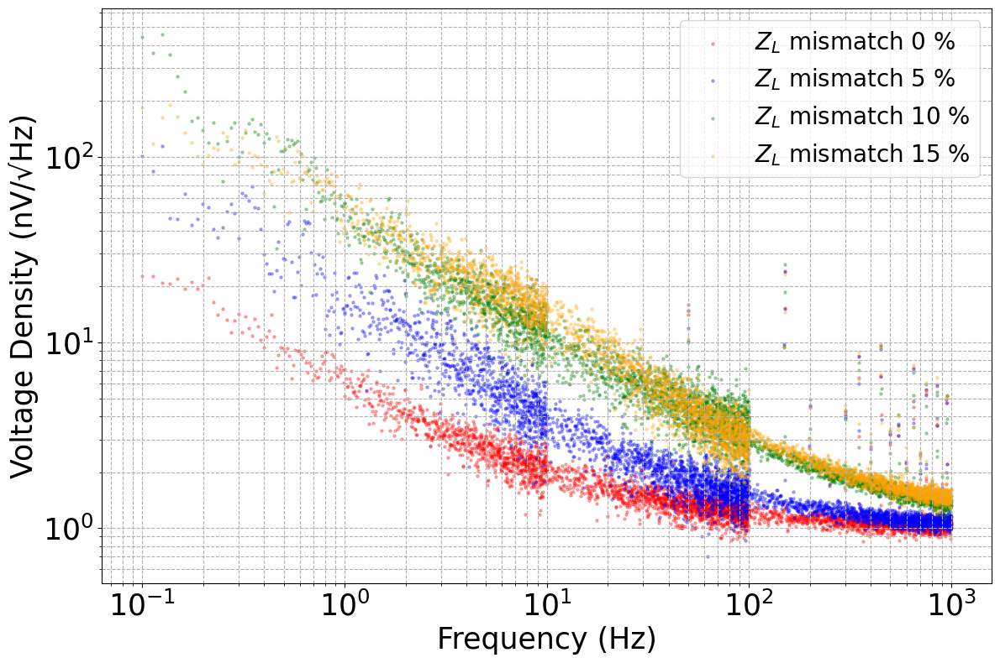

In [43]:
G_y = 1e9/40000
f_w = 970  # Frequency above which we consider noise to be mostly white
f_f = 60  # Frequency below which we consider noise to be mostly flicker
#savedatafile 
colors = ['red', 'blue', 'green', 'orange']
nametype = 'B'
board_number = [3]
pair_number = ['2A0','2A1','2A2','2A3']
# pair_number = ['2A0']
frequency = ['UF', 'LF', 'HF']
mismatch_percentage = [0,5,10,15]
S = 0
plt.figure(figsize= (12,8))
for board in board_number:
    for pair in pair_number:
        filename = f'{nametype}{board}P{pair}'
        # data = spec_combine(dataframes13022026,nametype,board,pair,frequency)
        data = pd.read_csv(
        f'../13032026/{filename}.TXT', 
        sep='\s+', 
        # names=['f', 'noise'], 
        engine='python'
        )   
        plt.scatter(data['f'], pd.to_numeric(data['noise']*G_y), s = 5, alpha = 0.3, color = colors[S], label = fr'$Z_L$ mismatch {mismatch_percentage[S]} %')
        # plt.scatter(data['f'], pd.to_numeric(data['noise']*G_y), s = 5, alpha = 0.3, color = 'black', label = f'mismatch {mismatch_percentage[S]}')
        # plt.plot(data['f'], np.sqrt(5/data['f']))
        # # filename = save_df_to_txt(data,f'../13032026/{filename}.TXT')
        # noise_floor = SR_noisefloor
        # params,frequency,noise_data = total_fit(
        # data, 
        # noise_floor, 
        # G_y, 
        # do_floor_fit=True,   # Triggers the floor-smoothing logic
        # threshold=5e-12,     # Passed into smart_masking
        # bandwidth=3,         # Passed into smart_masking
        # f_w= 950,              # Passed into median_fit
        # f_f = 50
        # )
        # # plt.plot(frequency,noise_data, lw = 3, color = colors[S])
        S += 1 
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(fontsize = 20)
    plt.xlabel('Frequency (Hz)', fontsize = 25)
    plt.ylabel('Voltage Density (nV/√Hz)',fontsize = 25)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    plt.grid(True, which="both", ls="--")
    plt.tight_layout()
    plt.savefig('plot/noise_vs_mismatch_measure_compressed.jpg', dpi = 200)

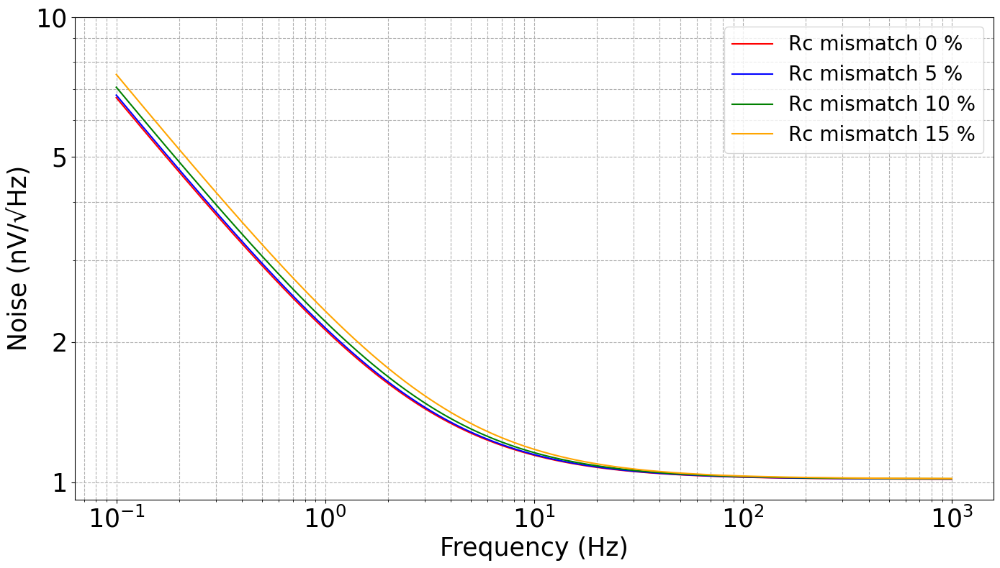

In [44]:
from matplotlib.ticker import ScalarFormatter
simu_mismatch = pd.read_csv('../simu/noise_mismatch_simu.csv')
simu_mismatch.columns = ['f','m0','m5','m10','m15']
column = ['m0','m5','m10','m15']
plt.figure(figsize= (14,8))
for i in range(len(mismatch_percentage)):
    plt.loglog(simu_mismatch['f'], simu_mismatch[column[i]]*1e9, color = colors[i], label = f'Rc mismatch {mismatch_percentage[i]} %')
plt.xscale('log')
plt.yscale('log')
plt.legend(fontsize = 20)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Noise (nV/√Hz)',fontsize = 25)
plt.xticks(fontsize = 25)
plt.yticks([1, 2, 5, 10], ['1', '2', '5', '10'], fontsize=25)
plt.grid(True, which="both", ls="--")
plt.tight_layout()
plt.savefig('plot/noise_vs_mismatch_simu.png', dpi = 300)

Try quadratic subtraction the asymmetry for the symmetry

Masking removed 305 points using factor 1.4.
Masking removed 885 points using factor 1.4.
Masking removed 321 points using factor 1.4.
Masking removed 112 points using factor 1.4.
Masking removed 306 points using factor 1.4.
Masking removed 95 points using factor 1.4.


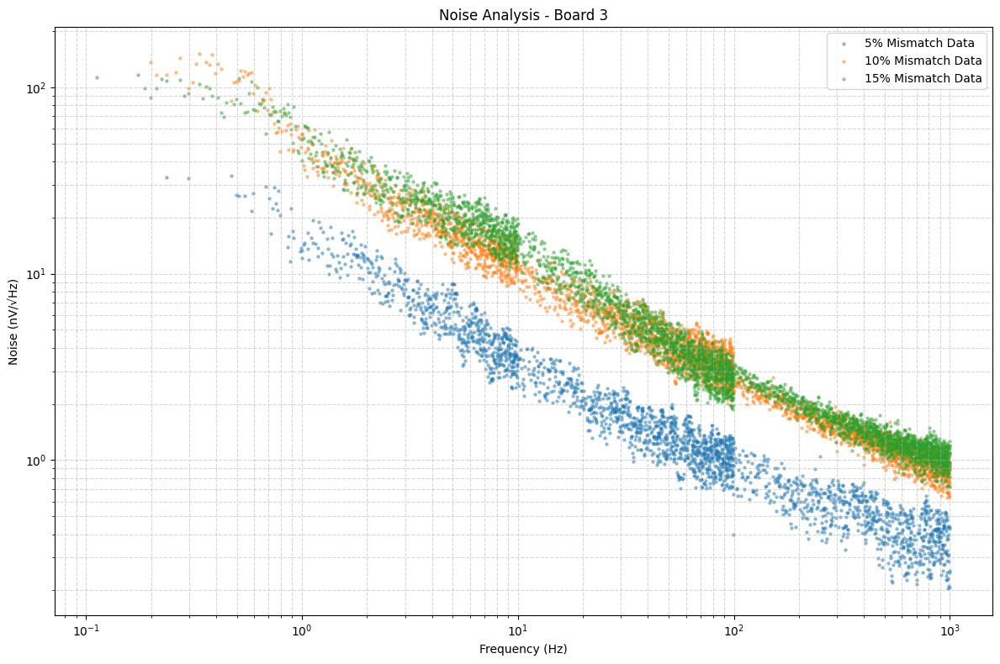

In [45]:
my_settings = {'threshold': 1.4, 'bandwidth': 20}
pair_number = ['2A1', '2A2', '2A3']
mismatch_percentage = [5, 10, 15]
S = 0
Sv_e = 4e-9
plt.figure(figsize=(12, 8))

for board in board_number:
    for pair in pair_number:
        # --- 1. Data Loading ---
        filename = f'{nametype}{board}P{pair}'
        filename_base = f'{nametype}{board}P2A0'
        
        noise = pd.read_csv(f'../13032026/{filename}.TXT', sep='\s+', engine='python')   
        noise0 = pd.read_csv(f'../13032026/{filename_base}.TXT', sep='\s+', engine='python')   
        
        # --- 2. Processing ---
        # Subtract reference and floor in quadrature
        noise_subtracted = quadr_subtract(noise, noise0, mask_params=my_settings)
        noise_floor_substracted = quadr_subtract(noise_subtracted, SR_noisefloor, mask_params=my_settings)
        
        f_data = noise_floor_substracted['f'].values
        n_data = noise_floor_substracted['noise'].values * G_y
        
        # --- 3. Fitting ---
        # params returns [A, B, p] because fix=False
        params, n_fit = fit_noise_spectrum(f_data, n_data, f_power_config={'fix': False})
        
        # Safe unpacking: handles cases where params might be length 2 or 3
        A_fit = params[0]
        B_fit = params[1]
        p_fit = params[2] if len(params) > 2 else 1.0
        
        # --- 4. Plotting ---
        # Raw Data Scatter
        plt.scatter(f_data, n_data, s=5, alpha=0.4, 
                    label=f'{mismatch_percentage[S]}% Mismatch Data')
        
        # Fit Line with dynamic LaTeX label
        # Note: We display sqrt(A) and sqrt(B) in the label to show nV units
        # label_fit = (fr'Fit: $\sqrt{{({np.sqrt(A_fit):.1e})^2 / f^{{({p_fit:.2f})}} + '
        #              fr'({np.sqrt(B_fit):.1e})^2}}$')
        
        # plt.plot(f_data, n_fit, lw=2.5, label=label_fit)
        # plt.text(1001, np.sqrt(B_fit), f'CMRR = {4/np.sqrt(B_fit)}')
        S += 1

# --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
# Move legend outside if it gets too crowded
plt.legend(loc='upper right')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Noise (nV/√Hz)')
plt.title(f'Noise Analysis - Board {board}')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

### 24032026

In [46]:
dataframes24032026 = load_noise_data('./../24032026')

Successfully loaded 55 files from ./../24032026.


Matched: 22PF11 for frequency F1
Matched: 22PF21 for frequency F2
Matched: 22PF31 for frequency F3
Matched: 22PF41 for frequency F4
Matched: 22PF52 for frequency F5
Matched: 22PF53 for frequency F5


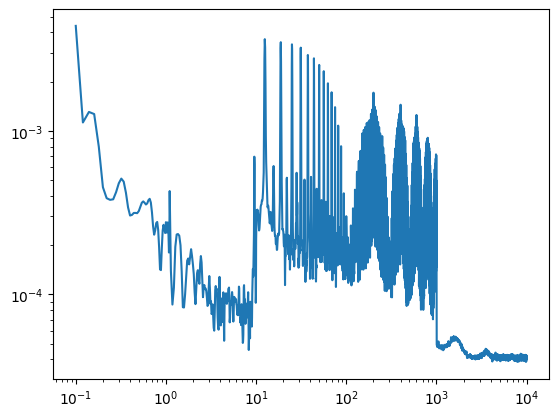

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

def spec_combine_wname(df_dict, nametype, frequency):
    df_list = []
    
    # We iterate through each target frequency (e.g., 'F1')
    for freq in frequency:
        # Filter keys that contain BOTH the nametype and the frequency string
        # We use .upper() to ensure the match isn't broken by 'f1' vs 'F1'
        matching_keys = [
            key for key in df_dict.keys() 
            if nametype.upper() in key.upper() and freq.upper() in key.upper()
        ]
        
        for key in matching_keys:
            df_temp = df_dict.get(key)
            if df_temp is not None:
                df_list.append(df_temp[['f', 'noise']].copy())
                print(f"Matched: {key} for frequency {freq}")

    if not df_list:
        print("No matching files found. Check if keys in df_dict include '.TXT'")
        return None

    # Combine and average
    combined = pd.concat(df_list, ignore_index=True)
    final_df = combined.groupby('f', as_index=False)['noise'].mean()
    return final_df.sort_values('f')

# --- How to run it with your specific filenames ---
nametype = '22P'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4', 'F5'] 

df_test = spec_combine_wname(dataframes24032026, nametype, frequency)

if df_test is not None:
    plt.loglog(df_test['f'], df_test['noise'])
    plt.show()

Matched: B2P2NUF1 for frequency NUF
Matched: B2P2_NUF for frequency NUF
Matched: B2P2NLF1 for frequency NLF
Matched: B2P2_NLF for frequency NLF
Matched: B2P2NLF for frequency NLF
Matched: B2P2NMF1 for frequency NMF
Matched: B2P2NMF2 for frequency NMF
Matched: B2P2_NMF for frequency NMF
Matched: B2P2NMF for frequency NMF
Matched: B2P2_NHF for frequency NHF
Matched: B2P2NHF for frequency NHF
Matched: B2P2NHF1 for frequency NHF
Matched: B2P2NHF2 for frequency NHF
Matched: B2P2NUHF for frequency NUHF


/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_11753/1021200204.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


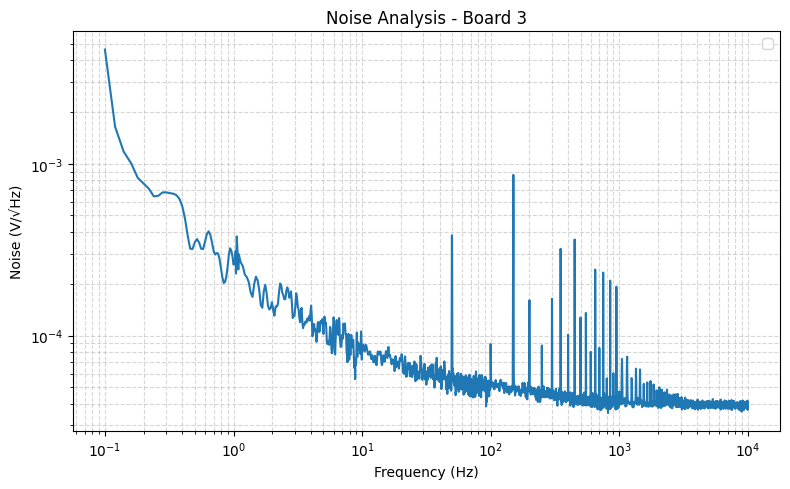

In [48]:
# --- How to run it with your specific filenames ---
nametype = 'B2P2'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['NUF', 'NLF', 'NMF', 'NHF', 'NUHF'] 

df_test = spec_combine_wname(dataframes24032026, nametype, frequency)

plt.figure(figsize = (8,5))
if df_test is not None:
    plt.loglog(df_test['f'], df_test['noise'])
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
# Move legend outside if it gets too crowded
plt.legend(loc='upper right')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Noise (V/√Hz)')
plt.title(f'Noise Analysis - Board 3')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

Matched: 23PF11 for frequency F1
Matched: 23PF31 for frequency F3
Matched: 23PF41 for frequency F4
Matched: 23PF51 for frequency F5


/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_11753/1757252518.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


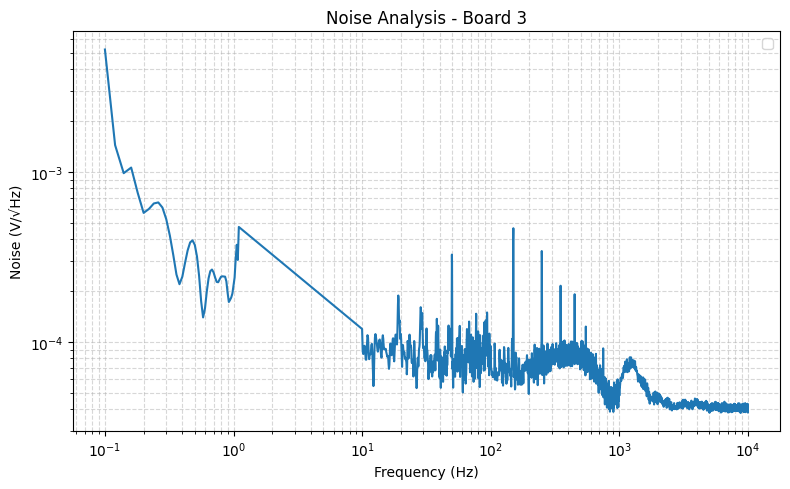

In [49]:
nametype = '23P'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4', 'F5'] 
df_test = spec_combine_wname(dataframes24032026, nametype, frequency)

plt.figure(figsize = (8,5))
if df_test is not None:
    plt.loglog(df_test['f'], df_test['noise'])
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
# Move legend outside if it gets too crowded
plt.legend(loc='upper right')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Noise (V/√Hz)')
plt.title(f'Noise Analysis - Board 3')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

### 17042026

In [50]:
dataframes17042026 = load_noise_data('./../17042026')

Successfully loaded 24 files from ./../17042026.


Matched: 52PF11 for frequency F1
Matched: 52PF21 for frequency F2
Matched: 52PF31 for frequency F3
Matched: 52PF41 for frequency F4
Matched: 52PF51 for frequency F5
Matched: 42PF11 for frequency F1
Matched: 42PF21 for frequency F2
Matched: 42PF31 for frequency F3
Matched: 42PF41 for frequency F4
Matched: 42PF51 for frequency F5
Matched: SRF11 for frequency F1
Matched: SRF21 for frequency F2
Matched: SRF31 for frequency F3
Matched: SRF41 for frequency F4
Matched: SRF51 for frequency F5


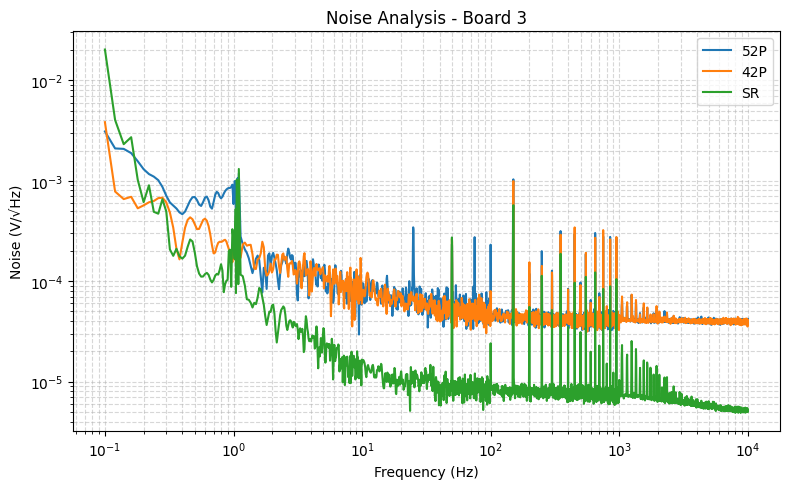

In [51]:
nametype = '52P'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4', 'F5'] 

df_52 = spec_combine_wname(dataframes17042026, nametype, frequency)
df_42 = spec_combine_wname(dataframes17042026, '42P', frequency)
df_SR = spec_combine_wname(dataframes17042026, 'SR', frequency)

plt.figure(figsize = (8,5))
if df_52 is not None:
    plt.loglog(df_52['f'], df_52['noise'], label = '52P')
    plt.loglog(df_42['f'], df_42['noise'], label = '42P')
    plt.loglog(df_SR['f'], df_SR['noise'], label = 'SR')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
# Move legend outside if it gets too crowded
plt.legend(loc='upper right')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Noise (V/√Hz)')
plt.title(f'Noise Analysis - Board 3')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

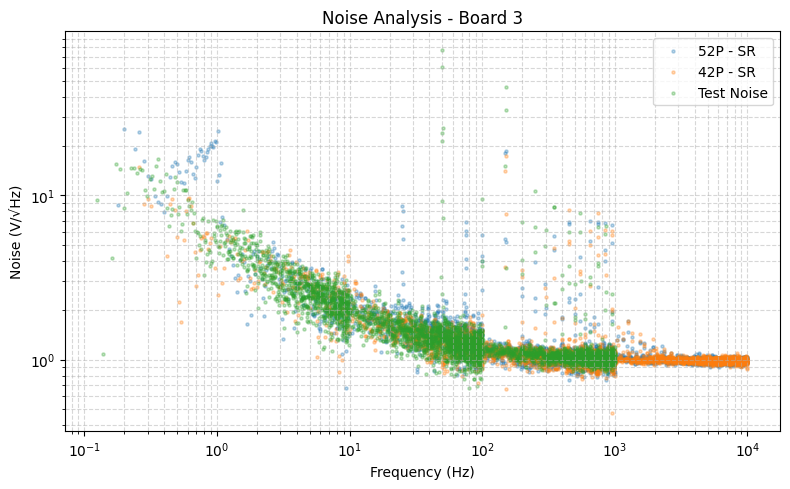

In [80]:
# quadratic subtraction 
G_y = 1e9/40000
df_52_subtracted = quadr_subtract(df_52, df_SR)
df_42_subtracted = quadr_subtract(df_42, df_SR) 
plt.figure(figsize = (8,5))
if df_52_subtracted is not None:        
    plt.scatter(df_52_subtracted['f'], df_52_subtracted['noise']*G_y, alpha = 0.3, s= 5, label = '52P - SR')
    plt.scatter(df_42_subtracted['f'], df_42_subtracted['noise']*G_y, alpha = 0.3, s= 5, label = '42P - SR')
    plt.scatter(noise_test['f'], noise_test['noise']*G_y, alpha = 0.3, s= 5, label = 'Test Noise')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
# Move legend outside if it gets too crowded        

plt.legend(loc='upper right')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Noise (V/√Hz)')     
plt.title(f'Noise Analysis - Board 3')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()  

### 24042026

In [53]:
dataframes24042026 = load_noise_data('./../24042026')

Successfully loaded 10 files from ./../24042026.


In [54]:
G4RT = pd.read_csv(
    './../24042026/G4HF.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G4RT['G(mag)'] = np.sqrt(G4RT['G(real)']**2 + G4RT['G(ima)']**2)
G4RT['G(phase)'] = np.arctan2(G4RT['G(ima)'], G4RT['G(real)']) * 180 / np.pi
G4CT = pd.read_csv(
    './../24042026/CG4HF.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G4CT['G(mag)'] = np.sqrt(G4CT['G(real)']**2 + G4CT['G(ima)']**2)
G4CT['G(phase)'] = np.arctan2(G4CT['G(ima)'], G4CT['G(real)']) * 180 / np.pi

In [55]:
G4RT.head()

# G4CT.head()

,f,G(real),G(ima),G(mag),G(phase)
0,10000.00,38.03411,-4.855692,38.342812,-7.275411
1,10618.75,38.05434,-5.200086,38.407990,-7.781215
2,11237.50,38.07624,-5.534540,38.476372,-8.270260
3,11856.25,38.09756,-5.859848,38.545582,-8.744230
4,12475.00,38.11602,-6.177262,38.613334,-9.205586


In [56]:
G4CT.head()

,f,G(real),G(ima),G(mag),G(phase)
0,10000.00,73.25734,-9.164345,73.828335,-7.130544
1,10618.75,73.37245,-9.629131,74.001599,-7.476560
2,11237.50,73.45317,-10.104530,74.144924,-7.832689
3,11856.25,73.49930,-10.593010,74.258730,-8.201221
4,12475.00,73.51133,-11.096310,74.344090,-8.583820


Cutoff Frequency for RT: 174587.50 Hz
Cutoff Frequency for CT: 180775.00 Hz


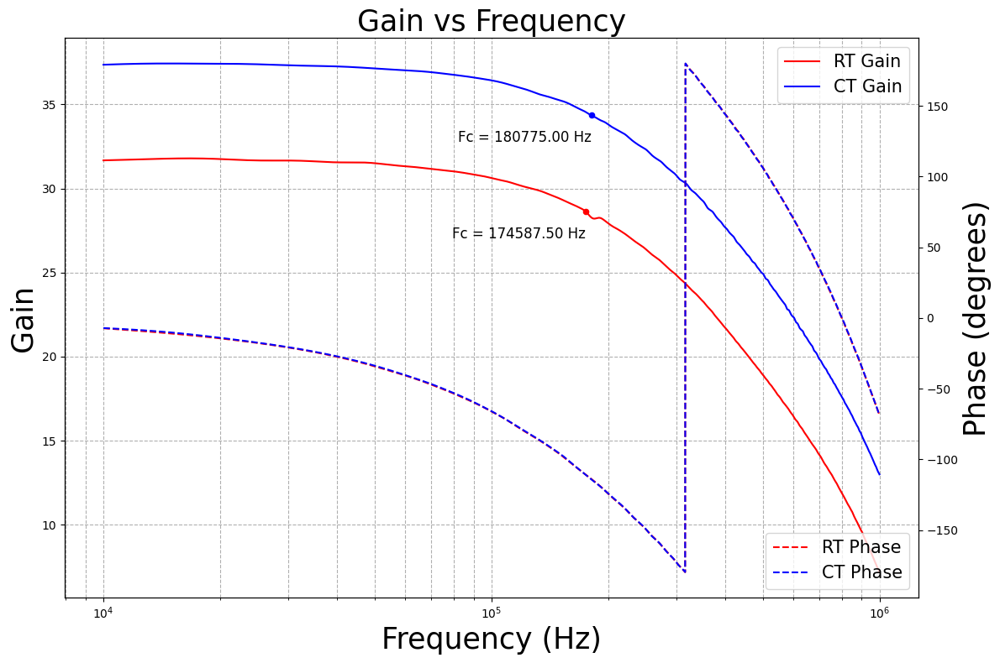

In [57]:
import math

def find_cutoff_frequency(frequencies, gains):
    target_gain_db = 20*np.log10(gains.iloc[0]) - 3  # -3 dB point
    target_gain_linear = 10 ** (target_gain_db / 20)
    for f, g in zip(frequencies, gains):
        if g <= target_gain_linear:
            return f
    return None  # Return None if cutoff frequency is not found
cutoff_freq_RT = find_cutoff_frequency(G4RT['f'], G4RT['G(mag)'])
cutoff_freq_CT = find_cutoff_frequency(G4CT['f'], G4CT['G(mag)'])
print(f"Cutoff Frequency for RT: {cutoff_freq_RT:.2f} Hz")
print(f"Cutoff Frequency for CT: {cutoff_freq_CT:.2f} Hz")  

def plot_cutoff_frequency(frequencies, gains, cutoff_freq, label, color):
    locx = np.argmin(np.abs(frequencies - cutoff_freq))
    locy = gains.iloc[locx]
    plt.scatter(frequencies.iloc[locx], 20*np.log10(gains.iloc[locx]), color=color, s = 20)
    plt.text(frequencies.iloc[locx] + 0.5, 20*np.log10(gains.iloc[locx]) - 1.8, f'Fc = {cutoff_freq:.2f} Hz', fontsize=12, ha='right', va='bottom')

# plt.figure(figsize=(12,8))
fig, ax1 = plt.subplots(figsize=(12,8))

ax1.plot(G4RT['f'], 20*np.log10(G4RT['G(mag)']), label = 'RT Gain', color = 'red')
# ax1.plot(G4RT['f'], (G4RT['G(mag)']), label = 'RT Gain', color = 'red')
plot_cutoff_frequency(G4RT['f'], G4RT['G(mag)'], cutoff_freq_RT, 'RT Cutoff', 'red')
ax1.semilogx(G4CT['f'], 20*np.log10(G4CT['G(mag)']), label = 'CT Gain', color = 'blue')
# ax1.semilogx(G4CT['f'], (G4CT['G(mag)']), label = 'CT Gain', color = 'blue')
plot_cutoff_frequency(G4CT['f'], G4CT['G(mag)'], cutoff_freq_CT, 'CT Cutoff', 'blue')
ax1.set_xlabel('Frequency (Hz)', fontsize = 25)
ax1.set_ylabel('Gain', fontsize = 25)
ax1.set_title('Gain vs Frequency', fontsize = 25)
ax1.grid(True, which="both", ls="--")
ax1.legend(loc='upper right', fontsize = 15)
ax2 = ax1.twinx()
ax2.plot(G4RT['f'], G4RT['G(phase)'], label = 'RT Phase', color = 'red', linestyle='--')
ax2.plot(G4CT['f'], G4CT['G(phase)'], label = 'CT Phase', color = 'blue', linestyle='--')
ax2.set_ylabel('Phase (degrees)', fontsize = 25)
ax2.legend(loc='lower right', fontsize = 15)
plt.tight_layout()
# plt.savefig('plot/Gain_Phase_vs_Frequency.png', dpi = 300)  

Matched: C4F1_1 for frequency F1
Matched: C4F2_1 for frequency F2
Matched: C4F3_1 for frequency F3
Matched: C4F4_2 for frequency F4
Matched: C4F4_1 for frequency F4
Matched: SRF11 for frequency F1
Matched: SRF21 for frequency F2
Matched: SRF31 for frequency F3
Matched: SRF41 for frequency F4


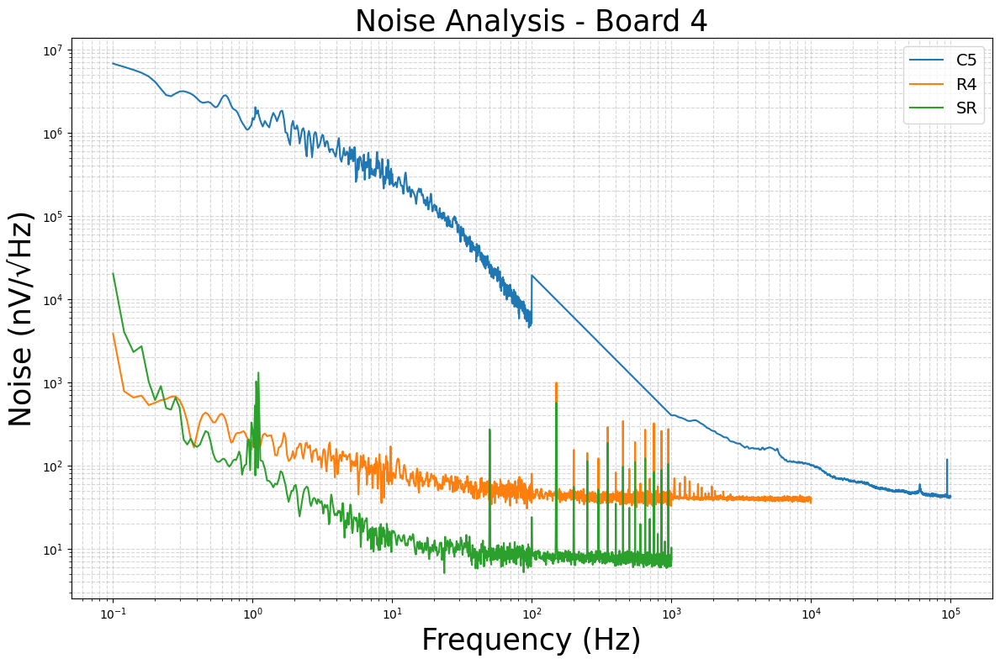

In [58]:
G_y = 1e9 / 1000
nametype = 'C4'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4'] 

df_C5 = spec_combine_wname(dataframes24042026, nametype, frequency)
# df_42 = spec_combine_wname(dataframes17042026, '42P', frequency)

df_SR = spec_combine_wname(dataframes17042026, 'SR', frequency)

plt.figure(figsize = (12,8))
if df_C5 is not None:
    plt.loglog(df_C5['f'], df_C5['noise']*G_y, label = 'C5')
    # plt.loglog(df_42['f'], df_42['noise'], label = '42P')
    plt.loglog(df_42['f'], df_42['noise']*G_y, label = 'R4')
    plt.loglog(df_SR['f'], df_SR['noise']*G_y, label = 'SR')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Noise Analysis - Board 4', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

###  27042026

In [59]:
dataframes27042026 = load_noise_data('./../27042026')

Successfully loaded 24 files from ./../27042026.


Matched: C41F1_1 for frequency F1
Matched: C4F1_1 for frequency F1
Matched: C41F2_1 for frequency F2
Matched: C4F2_1 for frequency F2
Matched: C41F3_1 for frequency F3
Matched: C4F3_1 for frequency F3
Matched: C4F4_1 for frequency F4
Matched: C41F4_1 for frequency F4
Matched: C4OF5_1 for frequency F5
Matched: C4F5_1 for frequency F5
Matched: C41F5_1 for frequency F5
Matched: C41F1_1 for frequency F1
Matched: C41F2_1 for frequency F2
Matched: C41F3_1 for frequency F3
Matched: C41F4_1 for frequency F4
Matched: C41F5_1 for frequency F5
Matched: SRF1_1 for frequency F1
Matched: SRF2_1 for frequency F2
Matched: SRF3_1 for frequency F3
Matched: SRF4_1 for frequency F4
Matched: SRF5_1 for frequency F5


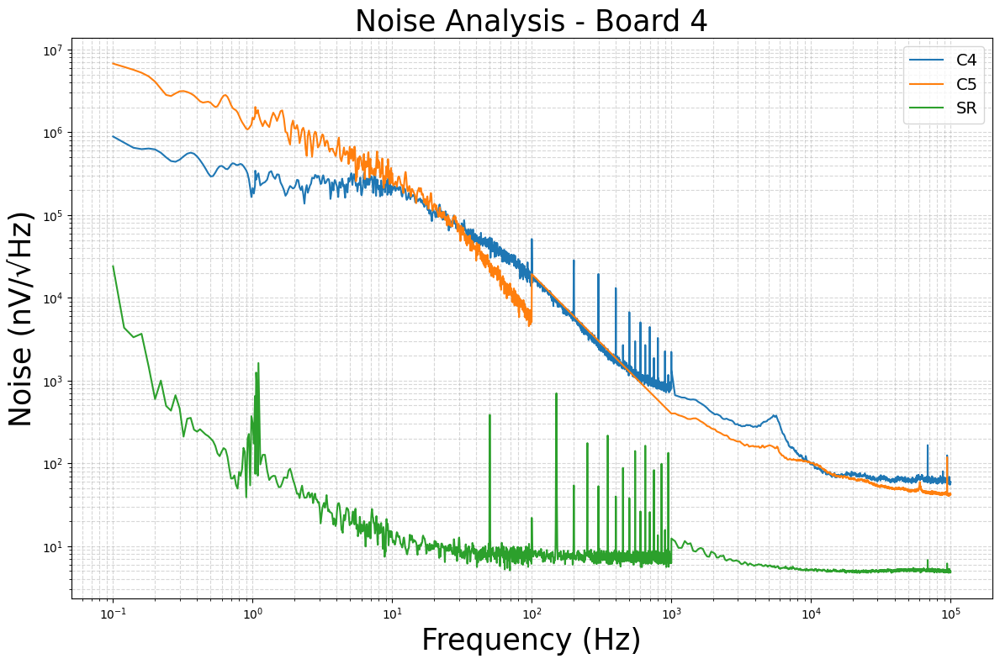

In [60]:
G_y = 1e9 / 1000
nametype = 'C4'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4', 'F5'] 

df_C4 = spec_combine_wname(dataframes27042026, 'C4', frequency)
# df_42 = spec_combine_wname(dataframes17042026, '42P', frequency)
df_C41 = spec_combine_wname(dataframes27042026, 'C41', frequency)
df_SR = spec_combine_wname(dataframes27042026, 'SR', frequency)

plt.figure(figsize = (12,8))
if df_C4 is not None:
    plt.loglog(df_C4['f'], df_C4['noise']*G_y, label = 'C4')
    plt.loglog(df_C5['f'], df_C5['noise']*G_y, label = 'C5')
    # plt.loglog(df_42['f'], df_42['noise'], label = '42P')
    # plt.loglog(df_C41['f'], df_C41['noise']*G_y, label = 'C41')
    plt.loglog(df_SR['f'], df_SR['noise']*G_y, label = 'SR')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Noise Analysis - Board 4', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

### 28042026

In [138]:
dataframes28042026 = load_noise_data('./../28042026')

Successfully loaded 95 files from ./../28042026.


In [139]:
# gain data

G42RT = pd.read_csv(
    './../28042026/GR42.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G43RT = pd.read_csv(
    './../28042026/GR43.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G42RT['G(mag)'] = np.sqrt(G42RT['G(real)']**2 + G42RT['G(ima)']**2)
G42RT['G(phase)'] = np.arctan2(G42RT['G(ima)'], G42RT['G(real)']) * 180 / np.pi
G43RT['G(mag)'] = np.sqrt(G43RT['G(real)']**2 + G43RT['G(ima)']**2)
G43RT['G(phase)'] = np.arctan2(G43RT['G(ima)'], G43RT['G(real)']) * 180 / np.pi
G42CT = pd.read_csv(
    './../28042026/GC42.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G43CT = pd.read_csv(
    './../28042026/GC43.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G42CT['G(mag)'] = np.sqrt(G42CT['G(real)']**2 + G42CT['G(ima)']**2)
G42CT['G(phase)'] = np.arctan2(G42CT['G(ima)'], G42CT['G(real)']) * 180 / np.pi
G43CT['G(mag)'] = np.sqrt(G43CT['G(real)']**2 + G43CT['G(ima)']**2)
G43CT['G(phase)'] = np.arctan2(G43CT['G(ima)'], G43CT['G(real)']) * 180 / np.pi






Cutoff Frequency for RT: 174587.50 Hz
Cutoff Frequency for RT2: 222231.30 Hz
Cutoff Frequency for RT3: 224087.50 Hz
Cutoff Frequency for CT: 180775.00 Hz
Cutoff Frequency for CT2: 240175.00 Hz
Cutoff Frequency for CT3: 230893.80 Hz


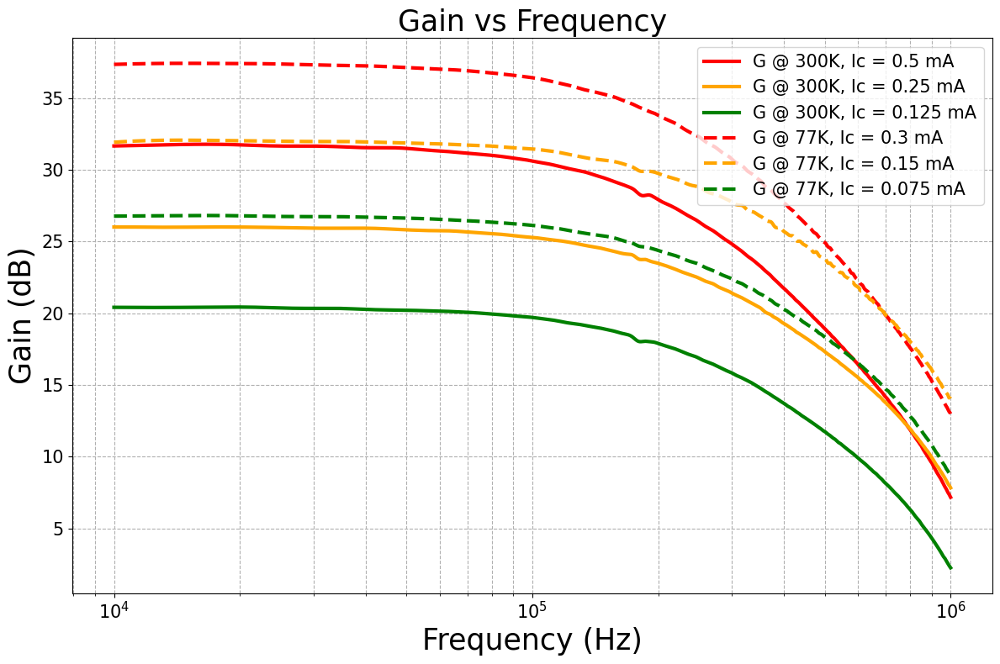

In [140]:
import math


cutoff_freq_RT = find_cutoff_frequency(G4RT['f'], G4RT['G(mag)'])
cutoff_freq_RT2 = find_cutoff_frequency(G42RT['f'], G42RT['G(mag)'])
cutoff_freq_RT3 = find_cutoff_frequency(G43RT['f'], G43RT['G(mag)'])
cutoff_freq_CT = find_cutoff_frequency(G4CT['f'], G4CT['G(mag)'])
cutoff_freq_CT2 = find_cutoff_frequency(G42CT['f'], G42CT['G(mag)'])
cutoff_freq_CT3 = find_cutoff_frequency(G43CT['f'], G43CT['G(mag)'])
print(f"Cutoff Frequency for RT: {cutoff_freq_RT:.2f} Hz")
print(f"Cutoff Frequency for RT2: {cutoff_freq_RT2:.2f} Hz")
print(f"Cutoff Frequency for RT3: {cutoff_freq_RT3:.2f} Hz")
print(f"Cutoff Frequency for CT: {cutoff_freq_CT:.2f} Hz")
print(f"Cutoff Frequency for CT2: {cutoff_freq_CT2:.2f} Hz")
print(f"Cutoff Frequency for CT3: {cutoff_freq_CT3:.2f} Hz")

def plot_cutoff_frequency(frequencies, gains, cutoff_freq, label, color):
    locx = np.argmin(np.abs(frequencies - cutoff_freq))
    locy = gains.iloc[locx]
    plt.scatter(frequencies.iloc[locx], 20*np.log10(gains.iloc[locx]), color=color, s = 20)
    plt.text(frequencies.iloc[locx] + 0.5, 20*np.log10(gains.iloc[locx]) - 1.8, f'Fc = {cutoff_freq:.2f} Hz', fontsize=12, ha='right', va='bottom')

# plt.figure(figsize=(12,8))
fig, ax1 = plt.subplots(figsize=(12,8))

ax1.plot(G4RT['f'], 20*np.log10(G4RT['G(mag)']), label = 'G @ 300K, Ic = 0.5 mA', lw = 3, color = 'red')
ax1.plot(G42RT['f'], 20*np.log10(G42RT['G(mag)']), label = 'G @ 300K, Ic = 0.25 mA', lw = 3, color = 'orange')
ax1.plot(G43RT['f'], 20*np.log10(G43RT['G(mag)']), label = 'G @ 300K, Ic = 0.125 mA', lw = 3, color = 'green')
# ax1.plot(G4RT['f'], (G4RT['G(mag)']), label = 'RT Gain', color = 'red')
# plot_cutoff_frequency(G4RT['f'], G4RT['G(mag)'], cutoff_freq_RT, 'RT Cutoff', 'red')
# plot_cutoff_frequency(G42RT['f'], G42RT['G(mag)'], cutoff_freq_RT2, 'RT2 Cutoff', 'orange')
# plot_cutoff_frequency(G43RT['f'], G43RT['G(mag)'], cutoff_freq_RT3, 'RT3 Cutoff', 'green')
ax1.semilogx(G4CT['f'], 20*np.log10(G4CT['G(mag)']), label = 'G @ 77K, Ic = 0.3 mA', lw = 3, linestyle = '--', color = 'red')
ax1.semilogx(G42CT['f'], 20*np.log10(G42CT['G(mag)']), label = 'G @ 77K, Ic = 0.15 mA', lw = 3, linestyle = '--', color = 'orange')
ax1.semilogx(G43CT['f'], 20*np.log10(G43CT['G(mag)']), label = 'G @ 77K, Ic = 0.075 mA', lw = 3, linestyle = '--', color = 'green')
# ax1.semilogx(G4CT['f'], (G4CT['G(mag)']), label = 'CT Gain', color = 'blue')
# plot_cutoff_frequency(G4CT['f'], G4CT['G(mag)'], cutoff_freq_CT, 'CT Cutoff', 'blue')
# plot_cutoff_frequency(G42CT['f'], G42CT['G(mag)'], cutoff_freq_CT2, 'CT2 Cutoff', 'purple')
# plot_cutoff_frequency(G43CT['f'], G43CT['G(mag)'], cutoff_freq_CT3, 'CT3 Cutoff', 'brown')
ax1.set_xlabel('Frequency (Hz)', fontsize = 25)
ax1.set_ylabel('Gain (dB)', fontsize = 25)
ax1.set_title('Gain vs Frequency', fontsize = 25)
ax1.grid(True, which="both", ls="--")
ax1.legend(loc='upper right', fontsize = 15)
ax1.tick_params(labelsize=15)
# ax2 = ax1.twinx()
# ax2.plot(G4RT['f'], G4RT['G(phase)'], label = 'RT Phase', color = 'red', linestyle='--')
# ax2.plot(G4CT['f'], G4CT['G(phase)'], label = 'CT Phase', color = 'blue', linestyle='--')
# ax2.set_ylabel('Phase (degrees)', fontsize = 25)
# ax2.legend(loc='lower right', fontsize = 15)
plt.tight_layout()
plt.savefig('plot/Gain_vs_Frequency_300K_77K.png', dpi = 300)

In [141]:
Gain_300K = [G4RT['G(mag)'].iloc[0], G42RT['G(mag)'].iloc[0], G43RT['G(mag)'].iloc[0]]
Gain_77K = [G4CT['G(mag)'].iloc[0], G42CT['G(mag)'].iloc[0], G43CT['G(mag)'].iloc[0]]
Ic_77K = [0.3, 0.15, 0.075]
Ic_300K = [0.5, 0.25, 0.125]
print("Gain at 300K:", Gain_300K)
print("Gain at 77K:", Gain_77K)

Gain at 300K: [38.342812472365196, 19.9945682716324, 10.492781466399663]
Gain at 77K: [73.82833523217644, 39.50861992746551, 21.824885786672514]


Matched: R43F1_1 for frequency F1
Matched: R4F1_1 for frequency F1
Matched: R42F1_1 for frequency F1
Matched: R41F1_1 for frequency F1
Matched: R41F2_1 for frequency F2
Matched: R4F2_1 for frequency F2
Matched: R43F2_1 for frequency F2
Matched: R42F2_1 for frequency F2
Matched: R43F3_1 for frequency F3
Matched: R4F3_1 for frequency F3
Matched: R42F3_1 for frequency F3
Matched: R41F3_1 for frequency F3
Matched: R41F4_1 for frequency F4
Matched: R42F4_1 for frequency F4
Matched: R43F4_1 for frequency F4
Matched: R4F4_1 for frequency F4
Matched: R42F5_1 for frequency F5
Matched: R4F5_1 for frequency F5
Matched: R43F5_1 for frequency F5
Matched: R41F5_1 for frequency F5
Matched: R41F6_1 for frequency F6
Matched: R42F6_1 for frequency F6
Matched: R43F6_1 for frequency F6
Matched: R4F6_1 for frequency F6
Matched: R42F7_1 for frequency F7
Matched: R4F7_1 for frequency F7
Matched: R43F7_1 for frequency F7
Matched: R41F7_1 for frequency F7
Matched: R41F1_1 for frequency F1
Matched: R41F2_1 for 

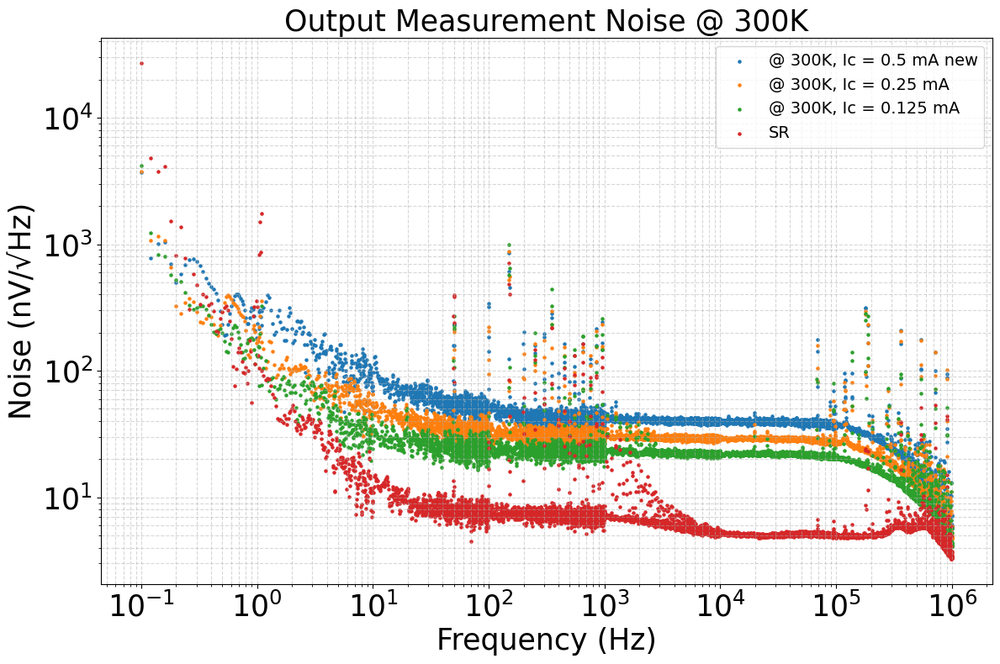

In [142]:
# plot overal noise  
G_y = 1e9 / 1000
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4','F5', 'F6', 'F7'] 

df_R40 = spec_combine_wname(dataframes28042026, 'R4', frequency)
df_R41 = spec_combine_wname(dataframes28042026, 'R41', frequency)
df_R42 = spec_combine_wname(dataframes28042026, 'R42', frequency)
df_R43 = spec_combine_wname(dataframes28042026, 'R43', frequency)
# df_42 = spec_combine_wname(dataframes17042026, '42P', frequency)
# df_R4 = spec_combine_wname(dataframes28042026, 'R4', frequency)
# df_R5 = spec_combine_wname(dataframes28042026, 'R5', frequency)
df_SR = spec_combine_wname(dataframes28042026, 'SR', frequency)

plt.figure(figsize = (12,8))
if df_R41 is not None:
    # plt.loglog(df_R40['f'], df_R40['noise']*G_y, label = f'@ 300K, Ic = {Ic_300K[0]} mA old')
    plt.scatter(df_R41['f'], df_R41['noise']*G_y, s=5, label = f'@ 300K, Ic = {Ic_300K[0]} mA new')
    plt.scatter(df_R42['f'], df_R42['noise']*G_y, s=5, label = f'@ 300K, Ic = {Ic_300K[1]} mA')
    plt.scatter(df_R43['f'], df_R43['noise']*G_y, s=5, label = f'@ 300K, Ic = {Ic_300K[2]} mA')
    # plt.loglog(df_R4['f'], df_R4['noise']*G_y, label = 'R4')
    # plt.loglog(df_R5['f'], df_R5['noise']*G_y, label = 'R5')
    # plt.loglog(df_42['f'], df_42['noise'], label = '42P')
    # plt.loglog(df_42['f'], df_42['noise']*G_y, label = 'R4')
    plt.scatter(df_SR['f'], df_SR['noise']*G_y, s=5, label = 'SR')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Output Measurement Noise @ 300K', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig('plot/Output_Noise_300K.png', dpi = 300)
plt.show()

Matched: C41F1_1 for frequency F1
Matched: C41F2_1 for frequency F2
Matched: C41F3_1 for frequency F3
Matched: C41F4_1 for frequency F4
Matched: C41F5_1 for frequency F5
Matched: C41F6_1 for frequency F6
Matched: C41F7_1 for frequency F7
Matched: C42F1_1 for frequency F1
Matched: C42F2_1 for frequency F2
Matched: C42F3_1 for frequency F3
Matched: C42F4_1 for frequency F4
Matched: C42F5_1 for frequency F5
Matched: C42F6_1 for frequency F6
Matched: C42F7_1 for frequency F7
Matched: C43F1_1 for frequency F1
Matched: C43F2_1 for frequency F2
Matched: C43F3_1 for frequency F3
Matched: C43F4_1 for frequency F4
Matched: C43F5_1 for frequency F5
Matched: C43F6_1 for frequency F6
Matched: C43F7_1 for frequency F7
Matched: C44F1_1 for frequency F1
Matched: C44F2_1 for frequency F2
Matched: C44F3_1 for frequency F3
Matched: C44F4_1 for frequency F4
Matched: C44F5_1 for frequency F5
Matched: C44F6_1 for frequency F6
Matched: C44F7_1 for frequency F7
Matched: SRF1_1 for frequency F1
Matched: SRF2_1

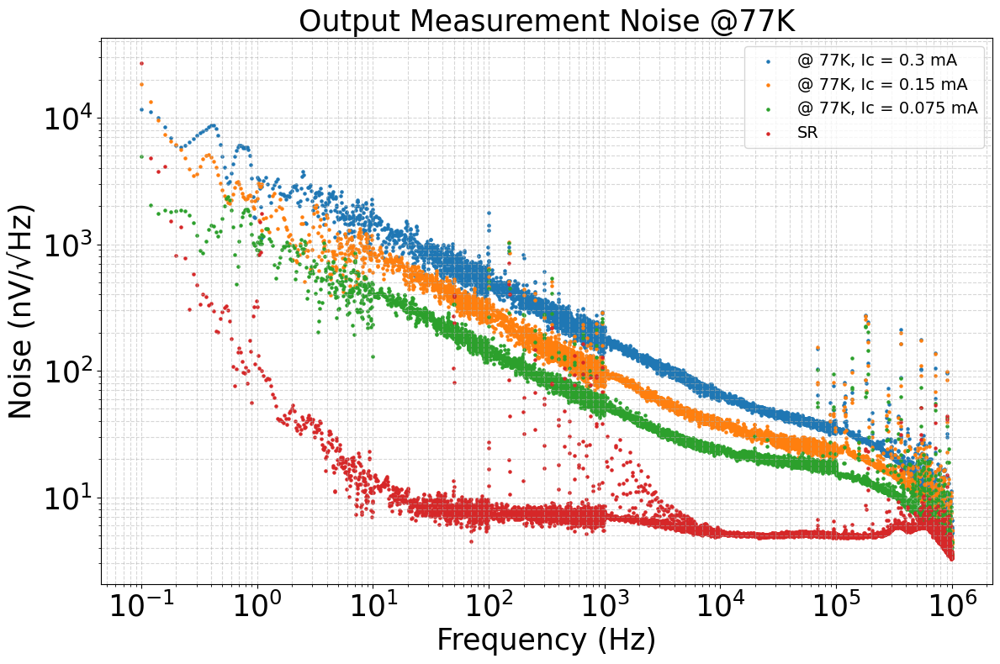

In [143]:
# plot overal noise  
G_y = 1e9 / 1000
nametype = 'C4'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4','F5', 'F6', 'F7'] 

df_C41 = spec_combine_wname(dataframes28042026, 'C41', frequency)
df_C42 = spec_combine_wname(dataframes28042026, 'C42', frequency)
df_C43 = spec_combine_wname(dataframes28042026, 'C43', frequency)
df_C44 = spec_combine_wname(dataframes28042026, 'C44', frequency)
# df_42 = spec_combine_wname(dataframes17042026, '42P', frequency)
# df_R4 = spec_combine_wname(dataframes28042026, 'R4', frequency)
# df_R5 = spec_combine_wname(dataframes28042026, 'R5', frequency)
df_SR = spec_combine_wname(dataframes28042026, 'SR', frequency)

plt.figure(figsize = (12,8))
if df_C41 is not None:
    plt.scatter(df_C41['f'], df_C41['noise']*G_y, s=5, label = f'@ 77K, Ic = {Ic_77K[0]} mA')
    plt.scatter(df_C42['f'], df_C42['noise']*G_y, s=5, label = f'@ 77K, Ic = {Ic_77K[1]} mA')
    plt.scatter(df_C43['f'], df_C43['noise']*G_y, s=5, label = f'@ 77K, Ic = {Ic_77K[2]} mA')
    plt.scatter(df_SR['f'], df_SR['noise']*G_y, s=5, label = 'SR')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Output Measurement Noise @77K', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig('plot/Output_Noise_77K.png', dpi = 300)
plt.show()

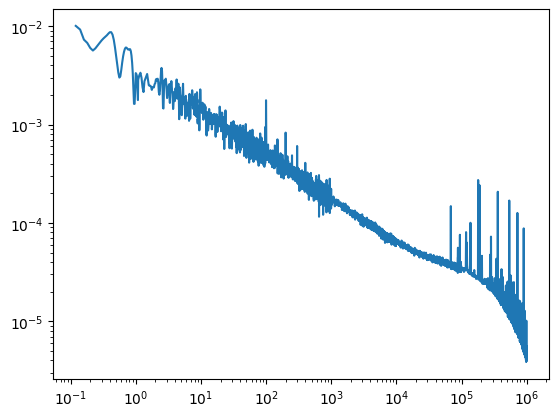

In [144]:
df_C41_subtracted = quadr_subtract(df_C41, df_SR)
df_C41_subtracted.head()
plt.loglog(df_C41_subtracted['f'],df_C41_subtracted['noise'])

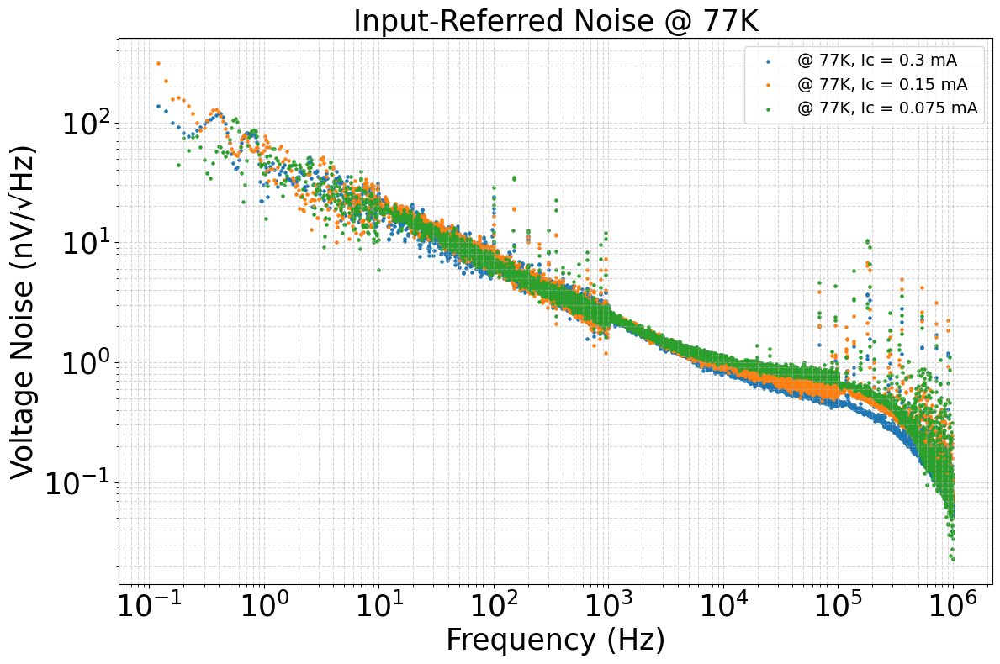

In [145]:
df_C41_subtracted = quadr_subtract(df_C41, df_SR)
df_C42_subtracted = quadr_subtract(df_C42, df_SR)
df_C43_subtracted = quadr_subtract(df_C43, df_SR)
# plt.loglog(df_C41_subtracted['f'], df_C41_subtracted['noise'])
plt.figure(figsize = (12,8))
plt.scatter(df_C41_subtracted['f'],df_C41_subtracted['noise']*G_y/Gain_77K[0], s=5, label = f'@ 77K, Ic = {Ic_77K[0]} mA')
# print(f'gain check: {Gain_77K[0]}')
plt.scatter(df_C42_subtracted['f'], df_C42_subtracted['noise']*G_y/Gain_77K[1], s=5, label = f'@ 77K, Ic = {Ic_77K[1]} mA')
# print(f'gain check: {Gain_77K[1]}')
plt.scatter(df_C43_subtracted['f'], df_C43_subtracted['noise']*G_y/Gain_77K[2], s=5, label = f'@ 77K, Ic = {Ic_77K[2]} mA')
# print(f'gain check: {Gain_77K[2]}')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Voltage Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Input-Referred Noise @ 77K', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig('plot/Input-Referred_Noise_77K.png', dpi = 300)
plt.show()

1000000.0
gain check: 38.342812472365196
gain check: 19.9945682716324
gain check: 10.492781466399663


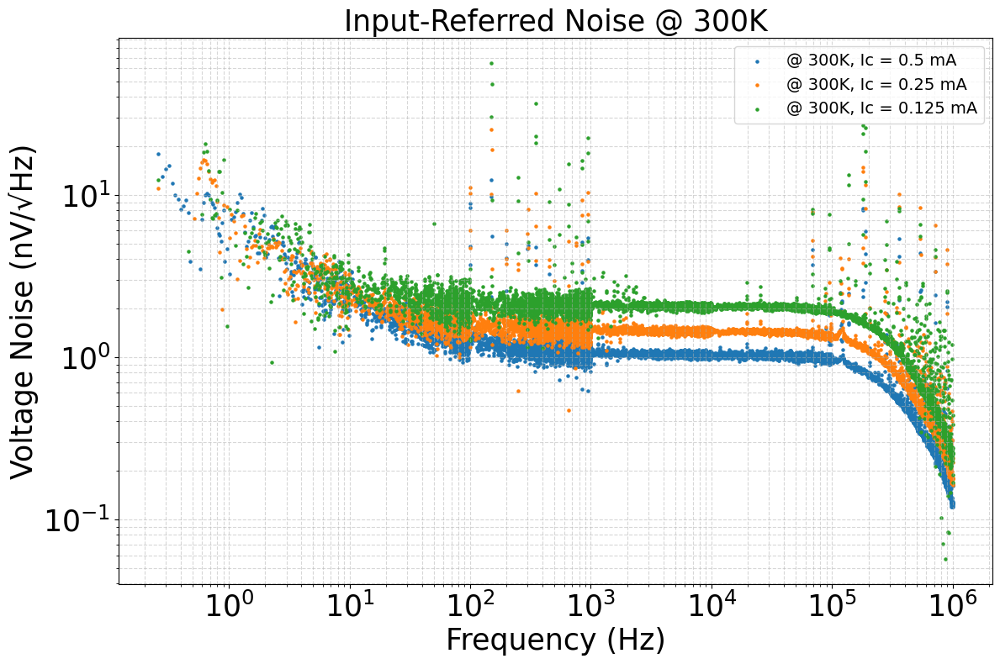

In [146]:
print(G_y)
plt.figure(figsize = (12,8))
df_R41_subtracted = quadr_subtract(df_R41, df_SR)
df_R42_subtracted = quadr_subtract(df_R42, df_SR)
df_R43_subtracted = quadr_subtract(df_R43, df_SR)
if df_R41 is not None:
    plt.scatter(df_R41_subtracted['f'], df_R41_subtracted['noise']*G_y/Gain_300K[0], s=5, label = f'@ 300K, Ic = {Ic_300K[0]} mA')
    print(f'gain check: {Gain_300K[0]}')
    plt.scatter(df_R42_subtracted['f'], df_R42_subtracted['noise']*G_y/Gain_300K[1], s=5, label = f'@ 300K, Ic = {Ic_300K[1]} mA')
    print(f'gain check: {Gain_300K[1]}')
    plt.scatter(df_R43_subtracted['f'], df_R43_subtracted['noise']*G_y/Gain_300K[2], s=5, label = f'@ 300K, Ic = {Ic_300K[2]} mA')
    print(f'gain check: {Gain_300K[2]}')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Voltage Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Input-Referred Noise @ 300K', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig('plot/Input-Referred_Noise_300K.png', dpi = 300)
plt.show()

Matched: C44F1_1 for frequency F1
Matched: C42F1_1 for frequency F1
Matched: C43F1_1 for frequency F1
Matched: C41F1_1 for frequency F1
Matched: C4F1_1 for frequency F1
Matched: C44F2_1 for frequency F2
Matched: C41F2_1 for frequency F2
Matched: C4F2_1 for frequency F2
Matched: C42F2_1 for frequency F2
Matched: C43F2_1 for frequency F2
Matched: C44F3_1 for frequency F3
Matched: C42F3_1 for frequency F3
Matched: C43F3_1 for frequency F3
Matched: C41F3_1 for frequency F3
Matched: C4F3_1 for frequency F3
Matched: C44F4_1 for frequency F4
Matched: C4F4_1 for frequency F4
Matched: C41F4_1 for frequency F4
Matched: C43F4_1 for frequency F4
Matched: C42F4_1 for frequency F4
Matched: C44F5_1 for frequency F5
Matched: C43F5_1 for frequency F5
Matched: C42F5_1 for frequency F5
Matched: C4F5_1 for frequency F5
Matched: C41F5_1 for frequency F5
Matched: C44F6_1 for frequency F6
Matched: C4F6_1 for frequency F6
Matched: C41F6_1 for frequency F6
Matched: C43F6_1 for frequency F6
Matched: C42F6_1 for

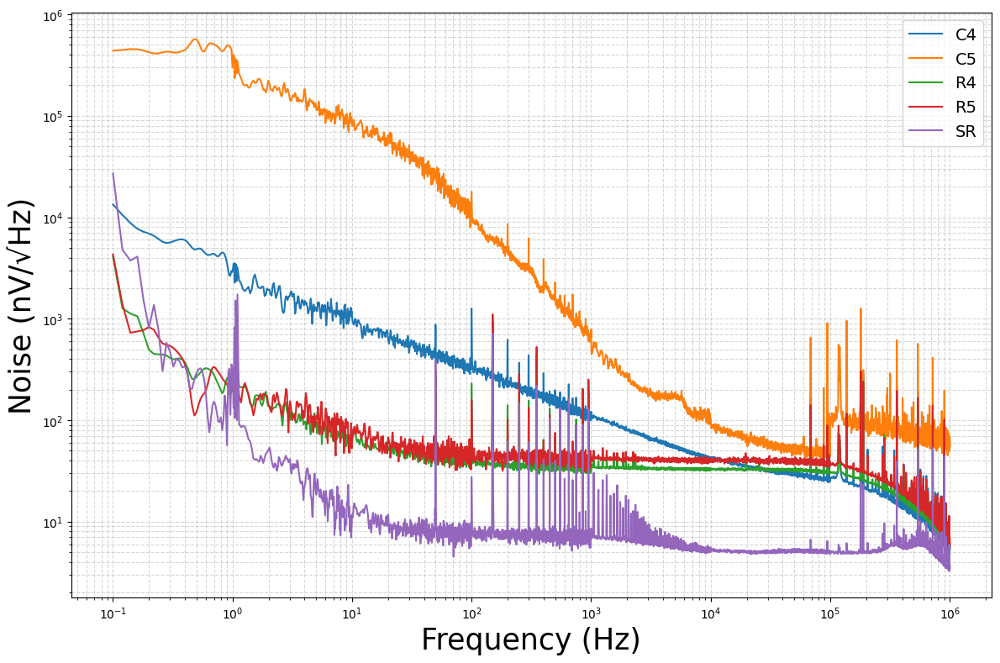

In [147]:
G_y = 1e9 / 1000
nametype = 'C4'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4','F5', 'F6', 'F7'] 

df_C4 = spec_combine_wname(dataframes28042026, 'C4', frequency)
df_C5 = spec_combine_wname(dataframes28042026, 'C5', frequency)
# df_42 = spec_combine_wname(dataframes17042026, '42P', frequency)
df_R4 = spec_combine_wname(dataframes28042026, 'R4', frequency)
df_R5 = spec_combine_wname(dataframes28042026, 'R5', frequency)
df_SR = spec_combine_wname(dataframes28042026, 'SR', frequency)

plt.figure(figsize = (12,8))
if df_C4 is not None:
    plt.loglog(df_C4['f'], df_C4['noise']*G_y, label = 'C4')
    plt.loglog(df_C5['f'], df_C5['noise']*G_y, label = 'C5')
    plt.loglog(df_R4['f'], df_R4['noise']*G_y, label = 'R4')
    plt.loglog(df_R5['f'], df_R5['noise']*G_y, label = 'R5')
    # plt.loglog(df_42['f'], df_42['noise'], label = '42P')
    # plt.loglog(df_42['f'], df_42['noise']*G_y, label = 'R4')
    plt.loglog(df_SR['f'], df_SR['noise']*G_y, label = 'SR')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Noise (nV/√Hz)', fontsize = 25)
# plt.title(f'Noise Analysis - Board 4', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

### 30042026

Keep the same gain

In [184]:
dataframes30042026 = load_noise_data('./../30042026')

Successfully loaded 16 files from ./../30042026.


In [185]:
# gain data

G42RT = pd.read_csv(
    './../30042026/GR2.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G42CT = pd.read_csv(
    './../30042026/CR2.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G42RT['G(mag)'] = np.sqrt(G42RT['G(real)']**2 + G42RT['G(ima)']**2)
G42RT['G(phase)'] = np.arctan2(G42RT['G(ima)'], G42RT['G(real)']) * 180 / np.pi
G42CT['G(mag)'] = np.sqrt(G42CT['G(real)']**2 + G42CT['G(ima)']**2)
G42CT['G(phase)'] = np.arctan2(G42CT['G(ima)'], G42CT['G(real)']) * 180 / np.pi

GR4N = G42RT['G(mag)'][0]
GC4N = G42CT['G(mag)'][0]




In [186]:
# plot overal noise  
G_y = 1e9 / 1000
nametype = 'C4'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4','F5', 'F6', 'F7'] 

df_R42_N = spec_combine_wname(dataframes30042026, 'R42', frequency)
df_C42_N = spec_combine_wname(dataframes30042026, 'C42', frequency)
# df_C43 = spec_combine_wname(dataframes28042026, 'C43', frequency)
# df_C44 = spec_combine_wname(dataframes28042026, 'C44', frequency)
# # df_42 = spec_combine_wname(dataframes17042026, '42P', frequency)
# # df_R4 = spec_combine_wname(dataframes28042026, 'R4', frequency)
# # df_R5 = spec_combine_wname(dataframes28042026, 'R5', frequency)
# df_SR = spec_combine_wname(dataframes28042026, 'SR', frequency)


Matched: R42F1_1 for frequency F1
Matched: R42F2_1 for frequency F2
Matched: R42F3_1 for frequency F3
Matched: R42F4_1 for frequency F4
Matched: R42F5_1 for frequency F5
Matched: R42F6_1 for frequency F6
Matched: R42F7_1 for frequency F7
Matched: C42F1_1 for frequency F1
Matched: C42F2_1 for frequency F2
Matched: C42F3_1 for frequency F3
Matched: C42F4_1 for frequency F4
Matched: C42F5_1 for frequency F5
Matched: C42F6_1 for frequency F6
Matched: C42F7_1 for frequency F7


gain check: 73.82833523217644
gain check: 81.48467847228704


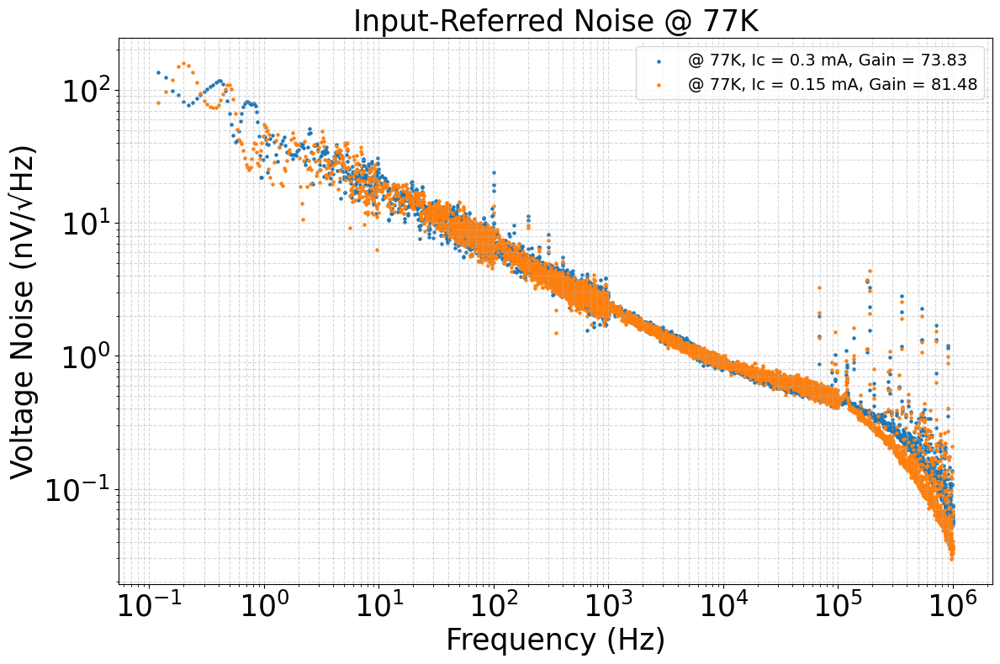

In [187]:
df_C41_subtracted = quadr_subtract(df_C41, df_SR)
df_C42N_subtracted = quadr_subtract(df_C42_N, df_SR)
# df_C43_subtracted = quadr_subtract(df_C43, df_SR)
# plt.loglog(df_C41_subtracted['f'], df_C41_subtracted['noise'])
plt.figure(figsize = (12,8))
plt.scatter(df_C41_subtracted['f'],df_C41_subtracted['noise']*G_y/Gain_77K[0], s=5, label = f'@ 77K, Ic = {Ic_77K[0]} mA, Gain = {Gain_77K[0]:.2f}')
print(f'gain check: {Gain_77K[0]}')
plt.scatter(df_C42N_subtracted['f'], df_C42N_subtracted['noise']*G_y/GC4N, s=5, label = f'@ 77K, Ic = {Ic_77K[1]} mA, Gain = {GC4N:.2f}')
print(f'gain check: {GC4N}')
# plt.loglog(df_C43_subtracted['f'], df_C43_subtracted['noise']*G_y/Gain_77K[2], label = f'@ 77K, Ic = {Ic_77K[2]} mA')
# print(f'gain check: {Gain_77K[2]}')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Voltage Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Input-Referred Noise @ 77K', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig('plot/Input-Referred_Noise_77K_same_gain.png', dpi = 300)
plt.show()

gain check: 38.342812472365196
gain check: 38.877703844570206


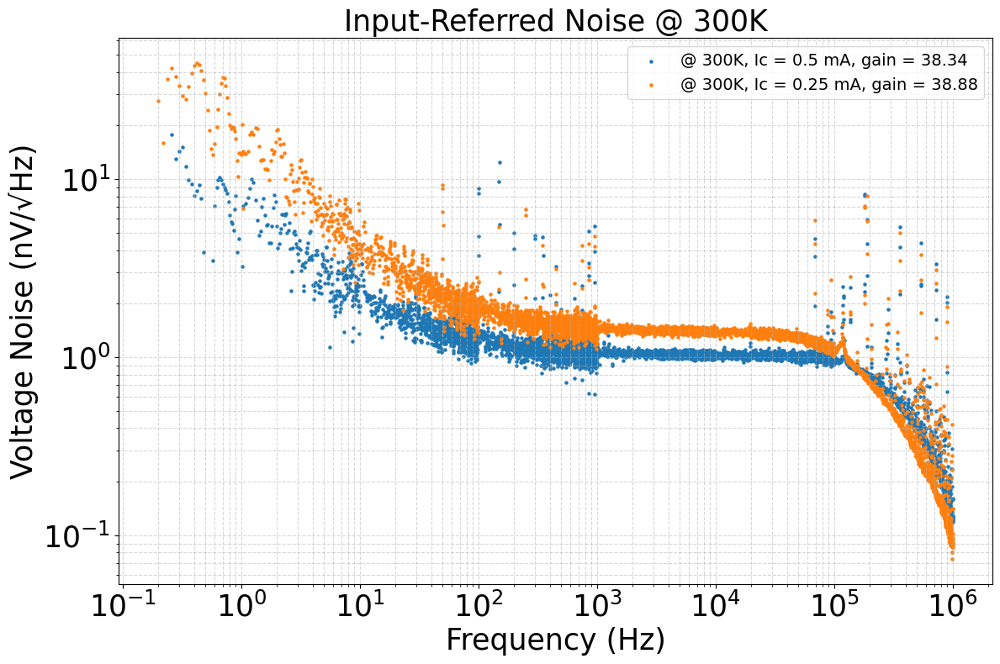

In [188]:
df_R41_subtracted = quadr_subtract(df_R41, df_SR)
df_R42N_subtracted = quadr_subtract(df_R42_N, df_SR)
# df_C43_subtracted = quadr_subtract(df_C43, df_SR)
# plt.loglog(df_C41_subtracted['f'], df_C41_subtracted['noise'])
plt.figure(figsize = (12,8))
plt.scatter(df_R41_subtracted['f'],df_R41_subtracted['noise']*G_y/Gain_300K[0], s=5, label = f'@ 300K, Ic = {Ic_300K[0]} mA, gain = {Gain_300K[0]:.2f}')
print(f'gain check: {Gain_300K[0]}')
plt.scatter(df_R42N_subtracted['f'], df_R42N_subtracted['noise']*G_y/GR4N, s=5, label = f'@ 300K, Ic = {Ic_300K[1]} mA, gain = {GR4N:.2f}')
print(f'gain check: {GR4N}')
# plt.loglog(df_C43_subtracted['f'], df_C43_subtracted['noise']*G_y/Gain_77K[2], label = f'@ 77K, Ic = {Ic_77K[2]} mA')
# print(f'gain check: {Gain_77K[2]}')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Voltage Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Input-Referred Noise @ 300K', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig('plot/Input-Referred_Noise_300K_same_gain.png', dpi = 300)
plt.show()

### 05062026

In [194]:
dataframes04052026 = load_noise_data('./../04052026')

Successfully loaded 46 files from ./../04052026.


In [197]:
# gain data

G43RT = pd.read_csv(
    './../04052026/GR3.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G43CT = pd.read_csv(
    './../04052026/GC3.TXT', 
    sep='\s+', 
    names=['f', 'G(real)', 'G(ima)'], 
    engine='python'
)
G43RT['G(mag)'] = np.sqrt(G43RT['G(real)']**2 + G43RT['G(ima)']**2)
G43RT['G(phase)'] = np.arctan2(G43RT['G(ima)'], G43RT['G(real)']) * 180 / np.pi
G43CT['G(mag)'] = np.sqrt(G43CT['G(real)']**2 + G43CT['G(ima)']**2)
G43CT['G(phase)'] = np.arctan2(G43CT['G(ima)'], G43CT['G(real)']) * 180 / np.pi

GR43 = G43RT['G(mag)'][0]
GC43 = G43CT['G(mag)'][0]




In [198]:
# plot overal noise  
G_y = 1e9 / 1000
# nametype = 'C4'
# If your files are F11, F22, etc., make sure your search strings match the start
frequency = ['F1', 'F2', 'F3', 'F4','F5', 'F6', 'F7'] 

df_R42_04052026 = spec_combine_wname(dataframes04052026, 'R42', frequency)
df_C42_04052026 = spec_combine_wname(dataframes04052026, 'C42', frequency)
df_R41_04052026 = spec_combine_wname(dataframes04052026, 'R41', frequency)
df_C41_04052026 = spec_combine_wname(dataframes04052026, 'C41', frequency)
df_C43_04052026 = spec_combine_wname(dataframes04052026, 'C43', frequency) 
df_R43_04052026 = spec_combine_wname(dataframes04052026, 'R43', frequency)
# df_C44 = spec_combine_wname(dataframes04052026, 'C44', frequency)
# # df_42 = spec_combine_wname(dataframes04052026, '42P', frequency)
# # df_R4 = spec_combine_wname(dataframes04052026, 'R4', frequency)
# # df_R5 = spec_combine_wname(dataframes28042026, 'R5', frequency)
# df_SR = spec_combine_wname(dataframes28042026, 'SR', frequency)


Matched: R42F1_1 for frequency F1
Matched: R42F2_1 for frequency F2
Matched: R42F3_1 for frequency F3
Matched: R42F4_1 for frequency F4
Matched: R42F5_1 for frequency F5
Matched: R42F6_1 for frequency F6
Matched: R42F7_1 for frequency F7
Matched: C42F1_1 for frequency F1
Matched: C42F2_1 for frequency F2
Matched: C42F3_1 for frequency F3
Matched: C42F4_1 for frequency F4
Matched: C42F5_1 for frequency F5
Matched: C42F6_1 for frequency F6
Matched: C42F7_1 for frequency F7
Matched: R41F1_1 for frequency F1
Matched: R41F2_1 for frequency F2
Matched: R41F3_1 for frequency F3
Matched: R41F4_1 for frequency F4
Matched: R41F5_1 for frequency F5
Matched: R41F6_1 for frequency F6
Matched: R41F7_1 for frequency F7
Matched: C41F1_1 for frequency F1
Matched: C41F2_1 for frequency F2
Matched: C41F3_1 for frequency F3
Matched: C41F4_1 for frequency F4
Matched: C41F5_1 for frequency F5
Matched: C41F6_1 for frequency F6
Matched: C41F7_1 for frequency F7
Matched: C43F1_1 for frequency F1
Matched: C43F2

gain check: 73.82833523217644
gain check: 81.48467847228704
gain check: 86.24249272512768


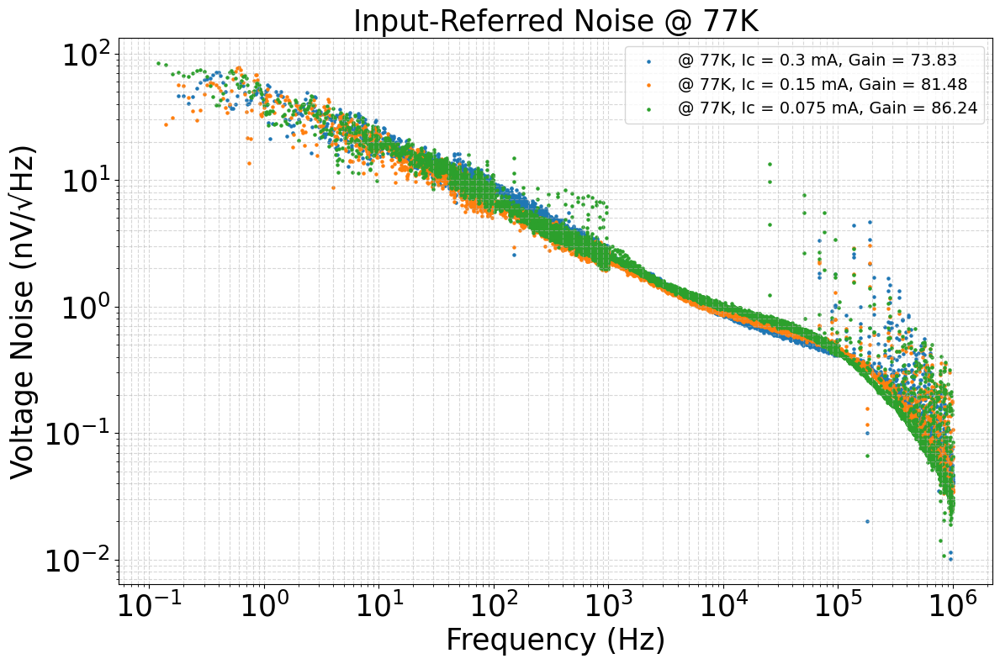

In [199]:
df_C41_subtracted = quadr_subtract(df_C41_04052026, df_SR)
df_C42_subtracted = quadr_subtract(df_C42_04052026, df_SR)
df_C43_subtracted = quadr_subtract(df_C43_04052026, df_SR)
# df_C43_subtracted = quadr_subtract(df_C43_04052026, df_SR)
# plt.loglog(df_C41_subtracted['f'], df_C41_subtracted['noise'])
plt.figure(figsize = (12,8))
plt.scatter(df_C41_subtracted['f'],df_C41_subtracted['noise']*G_y/Gain_77K[0], s=5, label = f'@ 77K, Ic = {Ic_77K[0]} mA, Gain = {Gain_77K[0]:.2f}')
print(f'gain check: {Gain_77K[0]}')
plt.scatter(df_C42_subtracted['f'], df_C42_subtracted['noise']*G_y/GC4N, s=5, label = f'@ 77K, Ic = {Ic_77K[1]} mA, Gain = {GC4N:.2f}')
print(f'gain check: {GC4N}')
plt.scatter(df_C43_subtracted['f'], df_C43_subtracted['noise']*G_y/GC43, s=5, label = f'@ 77K, Ic = {Ic_77K[2]} mA, Gain = {GC43:.2f}')
print(f'gain check: {GC43}')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Voltage Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Input-Referred Noise @ 77K', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig('plot/Input-Referred_Noise_77K_same_gain_new_supply.png', dpi = 300)
plt.show()

gain check: 38.342812472365196
gain check: 38.877703844570206
gain check: 38.6731719306566


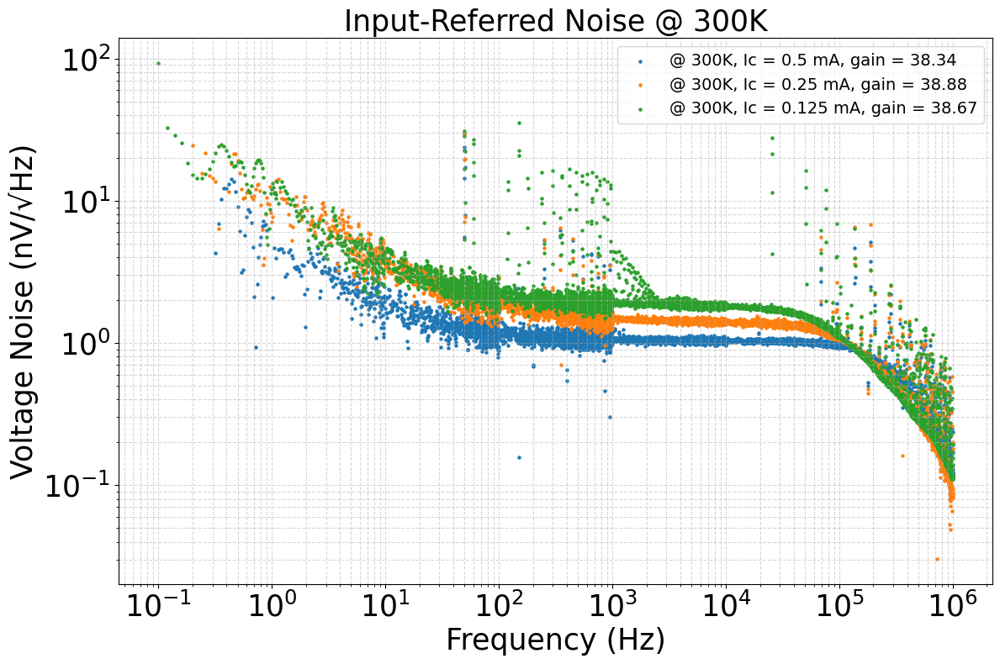

In [200]:
df_R41_subtracted = quadr_subtract(df_R41_04052026, df_SR)
df_R42_subtracted = quadr_subtract(df_R42_04052026, df_SR)

# df_C43_subtracted = quadr_subtract(df_C43_04052026, df_SR)
# plt.loglog(df_C41_subtracted['f'], df_C41_subtracted['noise'])
plt.figure(figsize = (12,8))
plt.scatter(df_R41_subtracted['f'],df_R41_subtracted['noise']*G_y/Gain_300K[0], s=5, label = f'@ 300K, Ic = {Ic_300K[0]} mA, gain = {Gain_300K[0]:.2f}')
print(f'gain check: {Gain_300K[0]}')
plt.scatter(df_R42_subtracted['f'], df_R42_subtracted['noise']*G_y/GR4N, s=5, label = f'@ 300K, Ic = {Ic_300K[1]} mA, gain = {GR4N:.2f}')
print(f'gain check: {GR4N}')
plt.scatter(df_R43_04052026['f'], df_R43_04052026['noise']*G_y/GR43, s=5, label = f'@ 300K, Ic = {Ic_300K[2]} mA, gain = {GR43:.2f}')
print(f'gain check: {GR43}')
# plt.loglog(df_C43_subtracted['f'], df_C43_subtracted['noise']*G_y/Gain_77K[2], label = f'@ 77K, Ic = {Ic_77K[2]} mA')
# print(f'gain check: {Gain_77K[2]}')
    # --- Final Styling ---
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
# Move legend outside if it gets too crowded
plt.legend(loc='upper right', fontsize = 14)
plt.xlabel('Frequency (Hz)', fontsize = 25)
plt.ylabel('Voltage Noise (nV/√Hz)', fontsize = 25)
plt.title(f'Input-Referred Noise @ 300K', fontsize = 25)
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig('plot/Input-Referred_Noise_300K_same_gain_new_supply.png', dpi = 300)
plt.show()

## 3. Noise compare 

In [193]:
# nametype = 'B'
# board_number = [1,2,3]
# pair_number = [1,2,3]
# frequency = ['UF', 'HF', 'LF']
# for board in board_number:
#     plt.figure(figsize=(10, 6))
#     for pair in pair_number:
#         print(f"Plotting for Board {board}")
#         G_SR = 10
#         if board == 1:
#             G_y = 1e9/30/G_SR
#         else:
#             G_y = 1e9/40/G_SR
#         G_x = 1
#         G_y = 40*G_SR
#         data = spec_combine(nametype, board, pair, frequency)
#         plt.title(f'Noise vs Frequency for Board {board}, Pair {pair}')
#         # for freq in frequency:
#             # sort_plot('B',board, pair, freq,G_x,G_y,style='-')
#         plt.loglog(data['f']*G_x, data['noise']/G_y, label=f'Board {board}, Pair {pair}')
#         plt.loglog(B2P1_simu['f'], B2P1_simu['avg_noise'], label='B2P1 Simulation', linestyle='--')
#         plt.loglog(B2P2_simu['f'], B2P2_simu['avg_noise'], label='B2P2 Simulation', linestyle='--')
#         plt.xlabel('Frequency (Hz)')
#         plt.ylabel('Noise (V/√Hz)')
#         plt.grid(True, which="both", ls="--")
#         plt.legend()
#         # plt.show()